In [1]:
import numpy as np
import pandas as pd
from scipy import sparse

from importlib import reload
import op
import ml
import time
import calendar
import osch as osh
import matplotlib.pyplot as plt
%matplotlib inline
path='D:\\ml\\'

In [8]:
reload(osh)

<module 'osch' from 'd:\\Python\\NVIDA\\osch.py'>

In [115]:
repairs=pd.read_excel(path+'repairs_data.xlsx')
distances=pd.read_excel(path+'Матрица расстояний.xlsx')

In [6]:
data.rename(columns={'Unnamed: 2':'ID'},inplace=True)

In [2]:
data=pd.read_excel('D:\\ранжирование скважин\\Итоговые данные rev 1.xlsx',usecols=[0,1,2,3,6,9,10,11,12,16,21,23,41,57,63,64,65,103])

In [385]:
otm_raw=pd.read_excel('D:\\ранжирование скважин\\Итоговые данные rev 2.xlsx',sheet_name='Данные ОТМ  ',usecols=[0,1,2,3,4,5,6,7],header=0)

In [21]:
prohib_ws.to_csv(path+'prohib_ws.csv',index_label=False)

In [60]:
distances.to_csv(path+'distances_v2.csv', index_label=False)

In [305]:
otm.to_csv(path+'OTM_v1.csv', index_label=False)

In [184]:
otm_groups.to_csv(path+'otm_groups.csv',index_label=False)

In [185]:
otm_prohibits.to_csv(path+'otm_prohibits.csv',index_label=False)

In [10]:
data=pd.read_csv(path+'gtm_v1.csv',parse_dates=['Start date','End date'],dayfirst=True,infer_datetime_format=True)

In [12]:
otm_prohibits_=pd.read_csv(path+'otm_prohibits.csv')

In [386]:
print(otm_raw.shape)
print(otm.shape)

(555, 8)
(555, 24)


In [387]:
otm['Start date']=otm_raw['Start date']

In [389]:
otm['Период проведеняи'].value_counts()

I квартал      103
III квартал     87
II квартал      65
IV квартал      38
Name: Период проведеняи, dtype: int64

In [392]:
mask=otm['quarter']==1
otm.loc[mask,'quarter']=np.nan
mask=otm['Период проведеняи']=='I квартал'
otm.loc[mask,'quarter']=1

In [393]:
otm['quarter'].value_counts()

1.0    103
3.0     87
2.0     65
4.0     38
Name: quarter, dtype: int64

In [395]:
otm.to_csv(path+'OTM_v1.csv',index_label=False)

In [604]:
data=pd.read_csv(path+'gtm_v1.csv',parse_dates=['Start date','End date'],dayfirst=True,infer_datetime_format=True)
mask=np.isnan(data['Порядок для одинаковых'])
data.loc[mask,'Порядок для одинаковых']=1
data['Порядок для одинаковых']=data['Порядок для одинаковых'].astype(np.int32)
distances=pd.read_csv(path+'distances_v2.csv')
fields=pd.read_csv(path+'Транспортная карта месторождений.csv')
groups=pd.read_csv(path+'groups.csv')
equipment_=pd.read_csv(path+'equipment.csv')
services=pd.read_csv(path+'services.csv')
otm=pd.read_csv(path+'OTM_v1.csv')
prohib=pd.read_csv(path+'binary_otm.csv')
OR=pd.read_csv(path+'OR.csv')
otm_groups=pd.read_csv(path+'otm_groups.csv')
otm_prohibits_=pd.read_csv(path+'otm_prohibits.csv')
pair=pd.read_csv(path+'pairs_prohibit.csv')
prohib_sva=pd.read_csv(path+'prohib_sva.csv')
prohib_us=pd.read_csv(path+'prohib_us.csv')
prohib_ws=pd.read_csv(path+'prohib_ws.csv')
mask=data['Фиксация на месяц проведения']=='фиксация'
data.loc[mask,'Start date']=data.loc[mask,'Месяц проведения'].apply(lambda x: osh.get_month_range(x)[0])
data.loc[mask,'End date']=data.loc[mask,'Месяц проведения'].apply(lambda x: osh.get_month_range(x)[1])
otm_mask=~otm['quarter'].isnull()
#mask1=np.isnan(otm['quarter'])
#otm.loc[mask1,'quarter']=1
otm.loc[otm_mask,'Start date']=otm.loc[otm_mask,'quarter'].apply(lambda x: osh.get_quarter_range(x)[0])
otm.loc[otm_mask,'End date']=otm.loc[otm_mask,'quarter'].apply(lambda x: osh.get_quarter_range(x)[1])
otm_mask=~otm['Start date'].isnull()
otm['Start date']=otm['Start date'].astype(np.datetime64)
otm['End date']=otm['End date'].astype(np.datetime64)
otm.loc[otm_mask,'Start']=otm.loc[otm_mask,'Start date'].apply(lambda x: (x-date)/np.timedelta64(1,'D'))
otm.loc[otm_mask,'End']=otm.loc[otm_mask,'End date'].apply(lambda x: (x-date)/np.timedelta64(1,'D'))
                                                               
date=np.datetime64('2017-01-01')
mask=~data['Start date'].isnull()
data.loc[mask,'Start']=data.loc[mask,'Start date'].apply(lambda x: (x-date)/np.timedelta64(1,'D'))
data.loc[mask,'End']=data.loc[mask,'End date'].apply(lambda x: (x-date)/np.timedelta64(1,'D'))
data.sort_values(by='Порядок для одинаковых',inplace=True)
#tmask=data['Well type after WO']=='Producer'
#cdata=data.groupby('ID').first()
#mask=data['Начатые операции']=='Начатое'
cdata,queue=osh.get_queue(data)
cdata['used']=False
id_mask=distances.index.isin(cdata.index)
ts=distances[id_mask][distances.columns[id_mask]]/24
mask=pair.index.isin(cdata.index)
pair=pair[mask][pair.columns[mask]]
pairs=pair.loc[ts.index,ts.index].values


In [375]:
osh.get_quarter_range(4.)

(numpy.datetime64('2017-10-01'), numpy.datetime64('2017-12-31'))

In [374]:
otm['quarter'].max()

4.0

In [378]:
mask=otm['quarter']==4
otm[mask]

,Pad,Well,Start date,End date,Период проведеняи,"Duration, hrs",Process group,Веерное отключение,Признак остановки,quarter,...,Бригада,Начало работ,Окончание работ,t1,t2,_t1,_t2,t1_service,t2_service,service
403,PAD_63_SVA,SVA-51201,2017-10-01,2017-12-31,IV квартал,15.533333,Reservoir,NaN,Требует остановки,4.0,...,Бригада 1,2018-10-15 11:17:00,2018-10-16 02:49:00,652.470139,653.117361,139.167007,145.167007,139.167007,145.167007,ТРС
414,PAD_63_SVA,SVA-51201,2017-10-01,2017-12-31,IV квартал,24.000000,Reservoir,NaN,Требует остановки,4.0,...,Бригада 2,2018-10-16 10:16:00,2018-10-17 10:16:00,653.427778,654.427778,139.167007,145.167007,139.167007,145.167007,ТРС
418,PAD_63_SVA,SVA-51201,2017-10-01,2017-12-31,IV квартал,15.833333,Reservoir,NaN,Требует остановки,4.0,...,Бригада 1,2018-10-16 02:49:00,2018-10-16 18:39:00,653.117361,653.777083,139.167007,145.167007,139.167007,145.167007,ТРС
422,PAD_29_WS,WS-7568,2017-10-01,2017-12-31,IV квартал,18.616667,Reservoir,NaN,Требует остановки,4.0,...,Бригада 1,2018-10-04 23:14:00,2018-10-05 17:51:00,641.968056,642.743750,95.542000,99.625000,95.542000,99.625000,ТРС
426,PAD_29_WS,WS-7569,2017-10-01,2017-12-31,IV квартал,18.616667,Reservoir,NaN,Требует остановки,4.0,...,Бригада 2,2018-10-05 23:39:00,2018-10-06 18:16:00,642.985417,643.761111,130.751999,142.647995,130.751999,142.647995,КРС
430,PAD_29_WS,WS-7568,2017-10-01,2017-12-31,IV квартал,24.000000,Reservoir,NaN,Требует остановки,4.0,...,Бригада 1,2018-10-06 17:51:00,2018-10-07 17:51:00,643.743750,644.743750,95.542000,99.625000,95.542000,99.625000,ТРС
431,PAD_29_WS,WS-7569,2017-10-01,2017-12-31,IV квартал,24.000000,Reservoir,NaN,Требует остановки,4.0,...,Бригада 2,2018-10-06 18:16:00,2018-10-07 18:16:00,643.761111,644.761111,130.751999,142.647995,130.751999,142.647995,КРС
435,PAD_29_WS,WS-7569,2017-10-01,2017-12-31,IV квартал,24.000000,Reservoir,NaN,Требует остановки,4.0,...,Бригада 2,2018-10-07 18:16:00,2018-10-08 18:16:00,644.761111,645.761111,130.751999,142.647995,130.751999,142.647995,КРС
436,PAD_29_WS,WS-7568,2017-10-01,2017-12-31,IV квартал,24.000000,Reservoir,NaN,Требует остановки,4.0,...,Бригада 1,2018-10-05 17:51:00,2018-10-06 17:51:00,642.743750,643.743750,95.542000,99.625000,95.542000,99.625000,ТРС
440,PAD_29_WS,WS-7569,2017-10-01,2017-12-31,IV квартал,24.000000,Reservoir,NaN,Требует остановки,4.0,...,Бригада 2,2018-10-08 18:16:00,2018-10-09 18:16:00,645.761111,646.761111,130.751999,142.647995,130.751999,142.647995,КРС


In [359]:
reload(osh)

<module 'osch' from 'd:\\Python\\NVIDA\\osch.py'>

In [401]:
def get_pairs_prohib(data):
    index=data['well_name'].value_counts().keys()
    frame=pd.DataFrame(data=np.ones(shape=(index.shape[0],index.shape[0]),dtype=bool),index=index,columns=index)
    #print(frame.shape)
    mask=~data['Код'].isnull()
    sub=data[mask][['Код','well_name']]
    agg_sub=sub.groupby('Код')
    s=0
    for k,group in enumerate(agg_sub):
        code=group[0]
        name=group[1]['well_name']
        for i in np.arange(name.shape[0]):
            iwell=name.iloc[i]
            #print(s,iwell)
            s+=1
            for j in np.arange(name.shape[0]):
                jwell=name.iloc[j]
                if iwell!=jwell:
                    frame.loc[jwell,iwell]=False
    return frame

def get_prohib_dict(data):
    index=np.arange(data.shape[0])
    frame=dict()
    mask=np.ones(shape=index.shape[0],dtype=bool)
    k=0
    i=0
    while k<index.shape[0]:
        if mask[k]:
            indices=np.where(data[k]==False)[0]
            mask[k]=False
            if indices.shape[0]>0:
                frame.update({i:np.append(k,indices)})
                mask[indices]=False
                i+=1
            
        
        k+=1
    

    return frame
    
def get_dummy_dict(data=pd.DataFrame([]),index=np.array([])):
    #index=np.arange(data.shape[0])
    main=dict({})
    for i in index:
        iteam=dict({})
        for c in data.columns:
            iteam.update({c:data.iloc[i].values[0]})
        main.update({i:iteam})
    return main

def set_cathegory(x,columns=np.array([])):
    cathegory=[]
    for i,c in enumerate(columns):
        if c==x:
            cathegory.append(i)
            break
    return np.array(cathegory)                
                
def adddays(date,day):
    hours,days=np.modf(day)
    #print(hours)
    return date+pd.DateOffset(days=days)+pd.DateOffset(hours=24*hours)

def set_loc_index(index=np.array([]),R=np.array([]),T=np.array([]),D=np.array([])):
    i=0
    res=np.empty(shape=(index.shape[0],2))
    res.fill(np.NINF)
    while i<R.shape[1]:
        j=0
        while j<R.shape[0]:
            ind=R[j,i]
            if ind<0:
                break
            t2=T[j,i]
            t1=D[j,i]
            res[ind,0]=t1
            res[ind,1]=t2
            
            j+=1
        i+=1
    return res
            
def get_otm_binary(otm_wells=np.array([]),otm_services=np.array([]),wells=pd.Index([]),services=np.array([]),otm_prohibits=np.array([])):
    k=otm_wells.shape[0]
    n=k+wells.shape[0]
    binary=np.ones(shape=(otm_wells.shape[0],n),dtype=bool)
    
    i=0
    while i<k:
        index=otm_wells[i]        
        serv=otm_services[i]
        try:
            well=wells.get_loc(index)
            serv1=services[well]
            for s in serv:
                for s_ in serv1:
                    if not otm_prohibits[s_,s]:
                        binary[i,k+well]=False
                        if i==0:
                            print(i,k+well,False)
        except KeyError:
            i+=1
            continue
        i+=1
    return binary
        
def get_debitfun_dict(bounds=np.array([]),start=0):
    debit_functions=dict({})
    k=0
    while k<bounds.shape[0]:
        fun=osh.debit_function()
        t=bounds[k]
        fun.t1=t[0]
        fun.t2=t[1]
        debit_functions.update({k+start:fun})
        k+=1
    return debit_functions
        
def isinterseption(a,b):    
    interseption=ml.interseption(a,b,shape=2)
    if interseption.shape[0]>0:
        return True
    else:
        return False        
    

In [605]:
R_=np.load(path+'task\\otm\\R_.npy')
T_=np.load(path+'task\\otm\\T_.npy')
D_=np.load(path+'task\\otm\\D_.npy')
Q0=cdata['Stop oil rate'].values
mask=np.isnan(Q0)
Q0[mask]=0
Q1=cdata['Start oil rate'].values
mask=np.isnan(Q1)
Q1[mask]=0
dQ=Q1-Q0
ts1=ts.values
tr=cdata['Продолжительность ремонта'].values
support=cdata[['Start','End']].values
mask=np.isnan(tr)
tr[mask]=0
index=np.arange(Q0.shape[0])
mask=cdata['Начатые операции']=='Начатое'
cdata.loc[mask,'used']=True
cdata.loc['SVA-1064','used']=True
cdata.loc['SVA-1064','Начальное положение бригад на конец 2016 года ']='Hoist 10 BIRS'
mused=cdata['used'].values.astype(bool)
group=index[mused]
used=mask[mused].values
dummy_index=cdata['Начальное положение бригад на конец 2016 года '].iloc[group].values
services=services.loc[dummy_index]
equipment=equipment_.loc[dummy_index]
cdata['services']=cdata['вид ремонта '].apply(lambda x: osh.set_cathegory(x,services.columns))
cdata['equipment']=cdata['Оборудование'].apply(lambda x: osh.set_cathegory(x,equipment.columns))
otm['services']=otm['Process group'].apply(lambda x: osh.set_cathegory(x,otm_prohibits_.columns))
#prohib=prohib[otm_prohibits.columns]

wells_service=cdata['services'].values
otm_service=otm['services'].values
wells_equipment=cdata['equipment'].values
service=services.values
equipment=equipment.values
otm_index=np.arange(otm.shape[0])
otm_mask=~otm['group_place'].isnull()
otm_group=otm_index[otm_mask]
otm_prohibits=otm_prohibits_.loc[otm['group_place'].iloc[otm_group].values][otm_prohibits_.columns]
otm_used=np.zeros(otm_group.shape[0],dtype=bool)
otm_Q0=np.zeros(otm.shape[0])
otm_Q1=np.zeros(otm.shape[0])
otm_tr=otm['Duration, hrs'].values/24
mask=np.isnan(otm_tr)
otm_tr[mask]=0
otm_support=otm[['Start','End']].values
otm_wells=otm['Well']
#mask=distances.index.isin(otm_wells)
#otm_distances=distances.loc[mask,distances.columns[mask]]
well_index=osh.set_unical_well_index(otm_wells,distances.index)
otm_distances=distances.iloc[well_index][distances.columns[well_index]].values/24
#wells_services=pd.get_dummies(cdata['вид ремонта '])[services.columns]
#wells_equipment=pd.get_dummies(cdata['Оборудование'])[equipment.columns]
#mask=cdata.index.isin(otm_wells.values)
binary=osh.get_otm_binary(otm_wells,otm_service,cdata.index,wells_service,prohib.values)
bounds=osh.set_loc_index(cdata.index,R=R_,T=T_,D=D_)
#mask1=~np.isnan(res[:,0])
#bounds=res
expanded=osh.get_debitfun_dict(bounds=bounds,start=otm_wells.shape[0])

In [12]:
reload(osh)

<module 'osch' from 'd:\\Python\\NVIDA\\osch.py'>

In [371]:
otm_support.max()

729.0

In [533]:
#subpath=path+'task\\otm\\'
#otm_Q0=np.load(subpath+'Q0.npy')
#otm_Q1=np.load(subpath+'Q1.npy')
#otm_distances=np.load(subpath+'ts.npy')
otm_group=np.load(subpath+'groups.npy')
#otm_support=np.load(subpath+'support.npy')
#service=np.load(subpath+'service.npy')
#equipment=np.load(subpath+'equipment.npy')
#otm_service=np.load(subpath+'well_service.npy',allow_pickle=True)
#otm_tr=np.load(subpath+'tr.npy')
#prohibits=np.load(subpath+'otm_binary.npy')
#expanded=np.load(subpath+'expanded.npy',allow_pickle=True)[()]
service=otm_prohibits.astype(np.int32).values
equipment=np.ones(otm_prohibits.shape[0],dtype=np.int32).reshape(-1,1)

otm_group_support=np.array([[0,24],[9,19],[0,24]])/24

wsch=osh.wells_schedule()
wsch.t=360
wsch.tracing=True
stop=otm_Q0.shape[0]
wsch.fun=wsch.f14
wsch.fit(otm_distances,otm_tr,otm_Q0,otm_Q1,otm_group,support=otm_support,stop=stop,epsilon=np.inf,service=service, equipment=equipment,wells_service=otm_service,prohibits=binary,group_support=otm_group_support)
#wsch.fit(otm_distances,otm_tr,otm_Q0,otm_Q1,otm_group,support=otm_support,stop=stop,epsilon=np.inf,service=service, equipment=equipment,wells_service=otm_service,prohibits=None)
wsch.update_debit_functions(expanded)
mask=np.isin(wsch.free,wsch.supported)
wsch.free=wsch.free[mask]
t1=time.perf_counter()
trace=wsch.get_routes_v1(tracing=True)
t2=time.perf_counter()
print('time=',t2-t1)
R,T,D,O=osh.get_rout_time(trace)
print('not used '+str(wsch.free.shape[0]))

AttributeError: 'wells_schedule' object has no attribute 'get_routes_v1'

In [60]:
prohibits=np.load(subpath+'otm_binary.npy')

In [29]:
subpath=path+'task\\otm\\'

In [17]:
reload(op)

<module 'op' from 'd:\\Python\\NVIDA\\op.py'>

In [33]:
reload(osh)

<module 'osch' from 'd:\\Python\\NVIDA\\osch.py'>

In [581]:
reload(osh)

<module 'osch' from 'd:\\Python\\NVIDA\\osch.py'>

In [366]:
reload(op)

<module 'op' from 'd:\\Python\\NVIDA\\op.py'>

In [601]:
used=np.load(path+'task\\used.npy')
support=np.load(path+'task\\support.npy')
group=np.load(path+'task\\groups.npy')
Q0=np.load(path+'task\\Q0.npy')
Q1=np.load(path+'task\\Q1.npy')
tr=np.load(path+'task\\tr.npy')
ts1=np.load(path+'task\\ts.npy')
pairs=np.load(path+'pairs.npy')
#support=np.empty(shape=(Q0.shape[0],2))
#support.fill(np.nan)
service=np.load(path+'service.npy')
equipment=np.load(path+'equipment.npy')
wells_service=np.load(path+'wells_service.npy',allow_pickle=True)
wells_equipment=np.load(path+'wells_equipment.npy',allow_pickle=True)
#pairs=np.ones(shape=pairs.shape,dtype=bool)
t1=time.perf_counter()
wsch=osh.wells_schedule()
#wsch.t=(tr.sum()/16)*1.1
wsch.t=360
wsch.tracing=True
stop=int(Q0.shape[0]/1)
wsch.fun=wsch.f14
wsch.function=op.get_optim_trajectory
wsch.fit(ts1,tr,Q0,Q1,group,stop=stop,support=support,used=used,epsilon=np.inf,service=service,equipment=equipment,wells_service=wells_service,wells_equipment=wells_equipment,prohibits=pairs,tracing=True)
mask=np.isin(wsch.free,wsch.supported)
wsch.free=wsch.free[mask]

trace=wsch.get_routes()
t2=time.perf_counter()
print('time=',t2-t1)
R,T,D,O=osh.get_rout_time(trace)
print('not used '+str(wsch.free.shape[0]))


time= 0.49186244304291904
not used 1


In [602]:
used=np.load(path+'task\\used.npy')
support=np.load(path+'task\\support.npy')
group=np.load(path+'task\\groups.npy')
Q0=np.load(path+'task\\Q0.npy')
Q1=np.load(path+'task\\Q1.npy')
tr=np.load(path+'task\\tr.npy')
ts1=np.load(path+'task\\ts.npy')
pairs=np.load(path+'pairs.npy')
#support=np.empty(shape=(Q0.shape[0],2))
#support.fill(np.nan)
service=np.load(path+'service.npy')
equipment=np.load(path+'equipment.npy')
wells_service=np.load(path+'wells_service.npy',allow_pickle=True)
wells_equipment=np.load(path+'wells_equipment.npy',allow_pickle=True)
#pairs=np.ones(shape=pairs.shape,dtype=bool)

wsch=osh.wells_schedule()
#wsch.t=(tr.sum()/16)*1.1
wsch.t=360
wsch.tracing=False
stop=int(Q0.shape[0]/1)
wsch.fun=wsch.f6
wsch.routes=R
wsch.start=D
wsch.end=T
wsch.function=op.get_optim_trajectory_fast
wsch.fit(ts1,tr,Q0,Q1,group,stop=stop,support=support,used=used,epsilon=tr.mean(),service=service,equipment=equipment,wells_service=wells_service,wells_equipment=wells_equipment,prohibits=pairs)
t1=time.perf_counter()
trace=wsch.get_routes()
t2=time.perf_counter()
print('time=',t2-t1)
R_,T_,D_,O=osh.get_rout_time(trace)
print('not used '+str(wsch.free.shape[0]))
#usd=wsch.used
#mask=np.isin(wsch.supported,usd)
#
#wsch.free=wsch.supported

time= 1.5334075109567493
not used 1


In [595]:
reload(op)
reload(osh)

<module 'osch' from 'd:\\Python\\NVIDA\\osch.py'>

In [607]:
subpath=path+'task\\otm\\'
otm_Q0=np.load(subpath+'Q0.npy')
otm_Q1=np.load(subpath+'Q1.npy')
otm_distances=np.load(subpath+'ts.npy')
otm_group=np.load(subpath+'groups.npy')
otm_support=np.load(subpath+'support.npy')
service=np.load(subpath+'service.npy')
equipment=np.load(subpath+'equipment.npy')
otm_service=np.load(subpath+'well_service.npy',allow_pickle=True)
otm_tr=np.load(subpath+'tr.npy')
prohibits=np.load(subpath+'otm_binary.npy')
expanded=np.load(subpath+'expanded.npy',allow_pickle=True)[()]
otm_group_support=np.array([[0,24],[9,19],[0,24]])/24
#service=otm_prohibits.astype(np.int32).values
#equipment=np.ones(otm_prohibits.shape[0],dtype=np.int32).reshape(-1,1)

wsch=osh.wells_schedule()
wsch.t=360
#wsch.tracing=True
stop=int(otm_Q0.shape[0]/2)
wsch.fun=wsch.f14
wsch.fit(otm_distances,otm_tr,otm_Q0,otm_Q1,otm_group,support=otm_support,tracing=True,stop=stop,epsilon=np.inf,service=service, equipment=equipment,wells_service=otm_service,prohibits=prohibits,group_support=otm_group_support)
#wsch.fit(otm_distances,otm_tr,otm_Q0,otm_Q1,otm_group,support=otm_support,stop=stop,epsilon=np.inf,service=service, equipment=equipment,wells_service=otm_service,prohibits=None)
wsch.update_debit_functions(expanded)
mask=np.isin(wsch.free,wsch.supported)
wsch.free=wsch.free[mask]
t1=time.perf_counter()
trace=wsch.get_routes()
t2=time.perf_counter()
print('time=',t2-t1)
R,T,D,O=osh.get_rout_time(trace)
print('not used '+str(wsch.free.shape[0]))

time= 6.2208964170422405
not used 164


In [569]:
mask=otm['Well']=='WS-7761'

In [571]:
otm[mask]

,Pad,Well,Start date,End date,Период проведеняи,"Duration, hrs",Process group,Веерное отключение,Признак остановки,quarter,...,Начало работ,Окончание работ,t1,t2,_t1,_t2,t1_service,t2_service,service,interseption
263,PAD_29_WS,WS-7761,2017-07-01 00:00:00,2017-09-30 00:00:00,III квартал,4.916667,Reservoir,NaN,Требует остановки,3.0,...,2017-07-01 00:00:00,2017-07-01 04:55:00,181.000000,181.204861,181.0,191.020996,181.0,191.020996,КРС,True
268,PAD_29_WS,WS-7761,2017-07-01 00:00:00,2017-09-30 00:00:00,III квартал,24.000000,Reservoir,NaN,Требует остановки,3.0,...,2017-08-16 14:56:59.384766,2017-08-17 14:56:59.384766,227.622910,228.622910,181.0,191.020996,181.0,191.020996,КРС,False
270,PAD_29_WS,WS-7761,2017-07-01 00:00:00,2017-09-30 00:00:00,III квартал,24.000000,Reservoir,NaN,Требует остановки,3.0,...,2017-08-14 14:56:59.384766,2017-08-15 14:56:59.384766,225.622910,226.622910,181.0,191.020996,181.0,191.020996,КРС,False
272,PAD_29_WS,WS-7761,2017-07-01 00:00:00,2017-09-30 00:00:00,III квартал,24.000000,Reservoir,NaN,Требует остановки,3.0,...,2017-08-15 14:56:59.384766,2017-08-16 14:56:59.384766,226.622910,227.622910,181.0,191.020996,181.0,191.020996,КРС,False
275,PAD_29_WS,WS-7761,2017-07-01 00:00:00,2017-09-30 00:00:00,III квартал,10.000000,Reservoir,NaN,Требует остановки,3.0,...,2017-07-11 05:32:00,2017-07-11 15:32:00,191.230556,191.647222,181.0,191.020996,181.0,191.020996,КРС,False
425,PAD_29_WS,WS-7761,2017-10-04 07:22:00,2017-10-04 10:05:00,NaN,2.716667,Power Generation/Supply,NaN,Требует остановки,NaN,...,2017-10-04 09:00:00,2017-10-04 11:43:00,276.375000,276.488194,NaN,NaN,181.0,191.020996,КРС,False


In [572]:
otm_support[263]

array([181., 272.])

In [573]:
fun=wsch.debit_functions[263]

In [576]:
print(fun.t1,fun.t2)
print(fun.prohibits)

181.0 181.20486111111111
[885]


In [577]:
pfun=wsch.debit_functions[885]

In [578]:
print(pfun.t1,pfun.t2)

181.0 191.02099609375


In [10]:
expanded=np.load(subpath+'expanded.npy',allow_pickle=True)[()]

In [7]:
print('time=',t2-t1)
R,T,D,O=osh.get_rout_time(trace)
print('not used '+str(wsch.free.shape[0]))

time= 54.210605928001314
not used 167


In [110]:
subpath=path+'task\\otm\\'
np.save(subpath+'Q0.npy',otm_Q0)
np.save(subpath+'Q1.npy',otm_Q1)
np.save(subpath+'ts.npy',otm_distances)
np.save(subpath+'groups.npy',otm_group)
np.save(subpath+'support.npy',otm_support)
np.save(subpath+'service.npy',otm_prohibits.astype(np.int32).values)
np.save(subpath+'equipment.npy',np.ones(otm_prohibits.shape[0],dtype=np.int32).reshape(-1,1))
np.save(subpath+'well_service.npy',otm_service)
np.save(subpath+'tr.npy',otm_tr/24)

In [311]:
np.save(subpath+'well_service.npy',otm_service)

In [606]:
np.save(subpath+'expanded',expanded)

In [561]:
np.save(subpath+'support.npy',otm_support)

In [331]:
np.save(subpath+'service.npy',otm_prohibits.astype(np.int32).values)

In [41]:
reload(osh)

<module 'osh' from 'd:\\Python\\NVIDA\\osh.py'>

In [40]:
max(prohibits.shape)

894

In [125]:
subpath=path+'task\\otm\\'
otm_Q0=np.load(subpath+'Q0.npy')
otm_Q1=np.load(subpath+'Q1.npy')
otm_distances=np.load(subpath+'ts.npy')
otm_group=np.load(subpath+'groups.npy')
otm_support=np.load(subpath+'support.npy')
service=np.load(subpath+'service.npy')
equipment=np.load(subpath+'equipment.npy')
otm_service=np.load(subpath+'well_service.npy',allow_pickle=True)
otm_tr=np.load(subpath+'tr.npy')

In [291]:
otm.to_excel(path+'otm_v2.xlsx')

In [73]:
values,index,inverse,counts=np.unique(otm_distances.index,return_index=True,return_inverse=True,return_counts=True)

In [108]:
reload(osh)

<module 'osh' from 'd:\\Python\\NVIDA\\osh.py'>

In [30]:
np.save(path+'service.npy',service)
np.save(path+'equipment.npy',equipment)
np.save(path+'wells_service.npy',wells_service)
np.save(path+'wells_equipment.npy',wells_equipment)

In [37]:
service=np.load(path+'service.npy')
equipment=np.load(path+'equipment.npy')
wells_service=np.load(path+'wells_service.npy',allow_pickle=True)
wells_equipment=np.load(path+'wells_equipment.npy',allow_pickle=True)

In [64]:
equipment.to_csv(path+'equipment.csv',index_label=False)

In [37]:
#mask=data['Начатые операции']=='Начатое'
first,queue=get_queue(data)

In [133]:
support=np.empty(shape=(Q0.shape[0],2))
support.fill(np.nan)

In [56]:
distances=osh.get_distances(wells,fields,well='Скважина')

In [14]:
ts.to_csv(path+'distances_v3.csv',index_label=False)

In [95]:
reload(osh)

<module 'osh' from 'd:\\Python\\NVIDA\\osh.py'>

In [26]:
def get_queue(data):
    aggdata=data.groupby('ID')
    first=aggdata.first()
    queue=dict({})
    for i,group in enumerate(aggdata):
        ID=group[0]
        p=group[1]
        #mask=p['Фиксация на месяц проведения']=='фиксация'
        mask=(~np.isnan(p['Start']))&(p['Начатые операции']!='Начатое')
        q=p[mask]
        
        start=[]
        end=[]
        tau=[]
        q0=[]
        q1=[]
        t=0
        if q[mask].shape[0]>1:
            for k in q.index:
                row=q.loc[k]
                if t>0:
                    #if row['Фиксация на месяц проведения']=='фиксация':
                    start.append(row['Start'])
                    end.append(row['End'])
                    tau.append(row['Продолжительность ремонта'])
                    q0.append(row['Stop oil rate'])
                    q1.append(row['Start oil rate'])
                t+=1
        if t>0:
            index=first.index.get_loc(ID)
            array=osh.queues(np.array([start,end,tau,q0,q1]))
            queue.update({index:array})
    return first,queue
        
            

In [190]:
Q0=cdata['Stop oil rate'].values
mask=np.isnan(Q0)
Q0[mask]=0
Q1=cdata['Start oil rate'].values
mask=np.isnan(Q1)
Q1[mask]=0
dQ=Q1-Q0
ts1=ts.values
tr=cdata['Продолжительность ремонта'].values
support=cdata[['Start','End']].values
mask=np.isnan(tr)
tr[mask]=0
index=np.arange(Q0.shape[0])
mask=cdata['Начатые операции']=='Начатое'
cdata.loc[mask,'used']=True
cdata.loc['WS-1223','used']=True
cdata.loc['WS-1223','Начальное положение бригад на конец 2016 года ']='Hoist 10 BIRS'
mused=cdata['used'].values.astype(bool)


#usd=cdata[cdata['used']==True]
#mask=usd['Начатые операции']=='Начатое'

#mask.loc['1223']=True
#used=index[mask]
#cdata.loc['1223','Начатые операции']='Начатое'
#mask=cdata['Начатые операции']=='Начатое'
group=index[mused]
used=mask[mused].values


In [46]:
reload(osh)

<module 'osh' from 'd:\\Python\\NVIDA\\osh.py'>

In [6]:
support=np.empty(shape=(Q0.shape[0],2))
support.fill(np.nan)

In [50]:
used=np.load(path+'task\\used.npy')
support=np.load(path+'task\\support.npy')
group=np.load(path+'task\\groups.npy')
Q1=np.load(path+'task\\Q1.npy')
Q0=np.load(path+'task\\Q0.npy')
tr=np.load(path+'task\\tr.npy')
ts1=np.load(path+'task\\ts.npy')
service=np.load(path+'service.npy')
equipment=np.load(path+'equipment.npy')
wells_service=np.load(path+'wells_service.npy',allow_pickle=True)
wells_equipment=np.load(path+'wells_equipment.npy',allow_pickle=True)
#queue=np.load(path+'task\\queue.npy',allow_pickle=True)[()]

In [176]:
np.save(path+'task\\Q0.npy',Q0)
np.save(path+'task\\Q1.npy',Q1)
np.save(path+'task\\ts.npy',ts1)
np.save(path+'task\\groups.npy',group)
np.save(path+'task\\support.npy',support)
np.save(path+'task\\used.npy',used)
#np.save(path+'task\\queue.npy',queue)
np.save(path+'task\\tr.npy',tr)

In [382]:
otm['quarter'].value_counts()

1.0    365
3.0     87
2.0     65
4.0     38
Name: quarter, dtype: int64

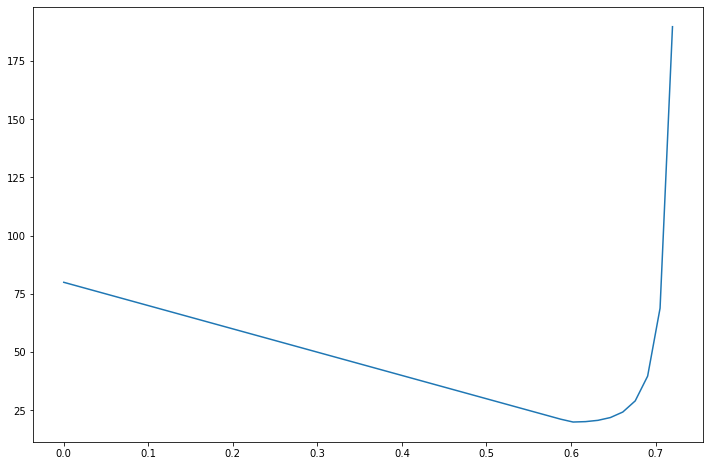

In [112]:
line1.gamma=1
plt.figure(figsize=(12,8))
x=np.linspace(0,(line1.t-line1.tau)-0.08,50)
#y=[line1.scaled_v2(t) for t in x]
#p=[line1.scaled_v1(t) for t in x]
y=[line1.tail(t) for t in x]
plt.plot(x,y)
#plt.plot(x,p)
#plt.plot(x,q)
plt.show()

49 0.375 0.3958333333333333 0.6458333333333333 0.25 89.0


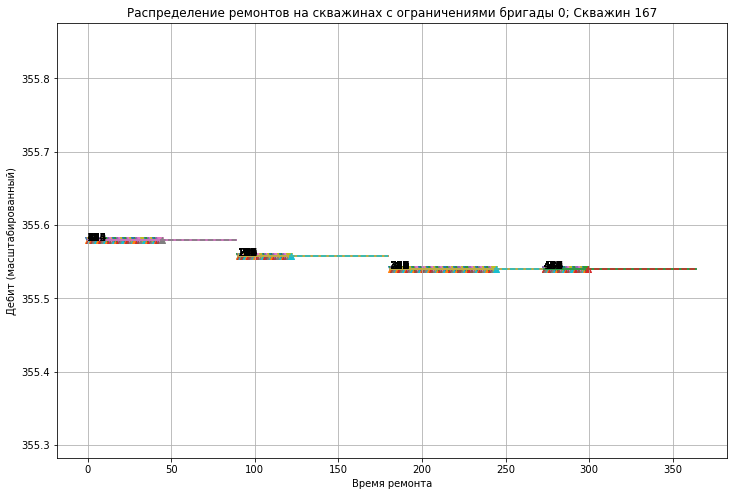

4 15.60763931274414 15.788889312744141 16.03888931274414 0.25 15.788889


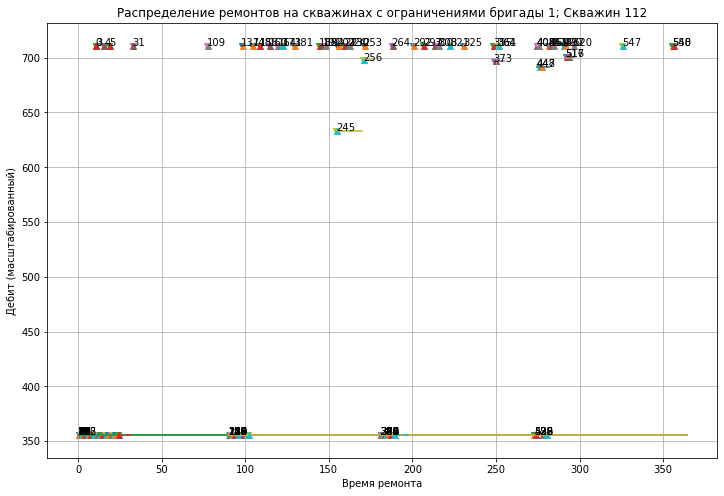

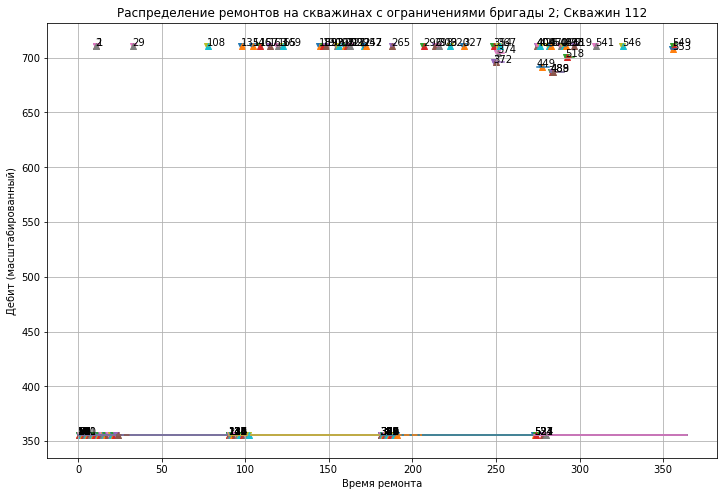

In [399]:
R_=R
D_=D
T_=T
gamma=0.001
#k=1
#mask=~np.isnan(D[:,k])
for k in np.arange(R_.shape[1]):
    plt.figure(figsize=(12,8))
    mask=R_[:,k]>=0
    count=mask[mask==True].shape[0]
#график интеграла функции дебита для каждой скважины
    for s,i in enumerate(R_[:,k]):
        if i<0: 
            break
        order=O[s,k]
        # order>0:
        wsch.update_queue(i,order)
        fun=wsch.debit_functions[i]
        x=fun.supp
        t1_=D_[s,k]
        t2_=T_[s,k]
        if s<R_.shape[0]-1:
            target=R_[s+1,k]
            if target<0:
                t3_=np.inf
                ts_=np.inf
            else:                               
                t3_=D_[s+1,k]
                ts_=otm_distances[R_[s,k],R_[s+1,k]]
        else:
            t3_=np.inf
            ts_=np.inf
        #if fun.cs:
        delta=osh.get_delta(t1_,t2_,t3_,ts=ts_,bound=wsch.debit_functions[R_[s,k]].supp[1])
        if delta<0:
            print(i,t1_,t2_,t3_,ts_,wsch.debit_functions[R_[s,k]].supp[1])
        
        y=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in x]
        t1=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in [D_[:,k][s]] if ~np.isnan(w)]
        t2=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in [T_[:,k][s]] if ~np.isnan(w)]
        plt.plot(x,y)
        tilda=(wsch.f6(t1_,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2))
        #print(tilda,i)
        plt.plot([t1_,t1_+delta],[tilda,tilda],linestyle='dashed')
        if len(t1)>0:
            plt.scatter(D_[:,k][s],t1,marker='v')
            plt.scatter(T_[:,k][s],t1,marker='^')
        plt.annotate(str(i),xy=(fun.supp[0],(wsch.f6(fun.supp[0],fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2))))
        
    #if np.fmod(i,2)==0:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    #else:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    plt.title('Распределение ремонтов на скважинах с ограничениями бригады '+str(k)+'; Скважин '+str(count))
    plt.xlabel('Время ремонта')
    plt.ylabel('Дебит (масштабированный)')    #обозначение номера скважины, для которой построена интегральная функция
    plt.grid(True)
    #plt.savefig(path+'distributions_group '+str(k)+'.png')
    plt.show()

49 0.25 0.2708333333333333 0.5208333333333333 0.25 89.0
283 204.5951388888889 205.5951388888889 205.5951385498047 0.0 272.0


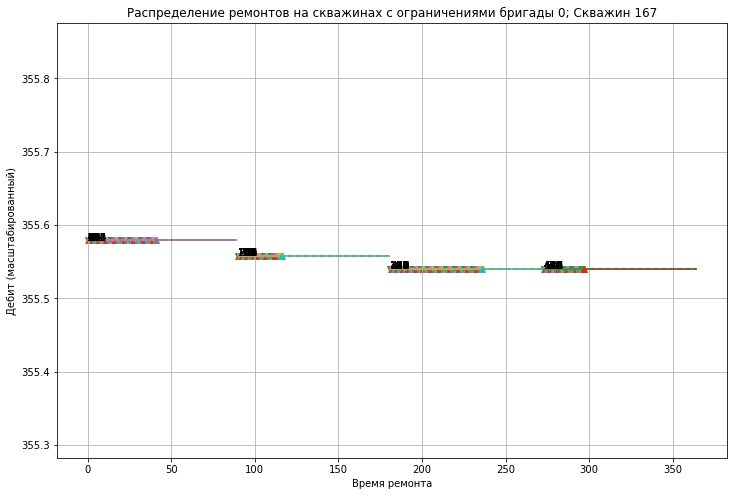

3 11.375 11.3875 11.6375 0.25 10.954166
4 15.60763931274414 15.788889312744141 16.41388931274414 0.625 15.788889
405 275.375 276.0472222222222 276.375 0.25 275.08334


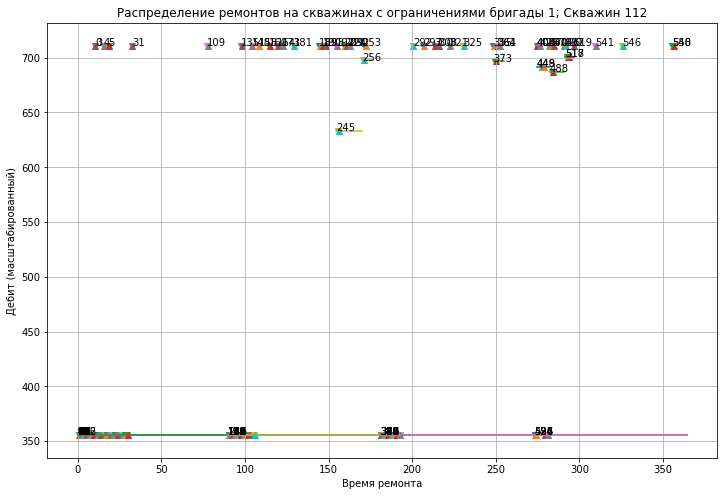

37 7.495833333333334 7.968055555555556 8.218055555555555 0.25 89.0


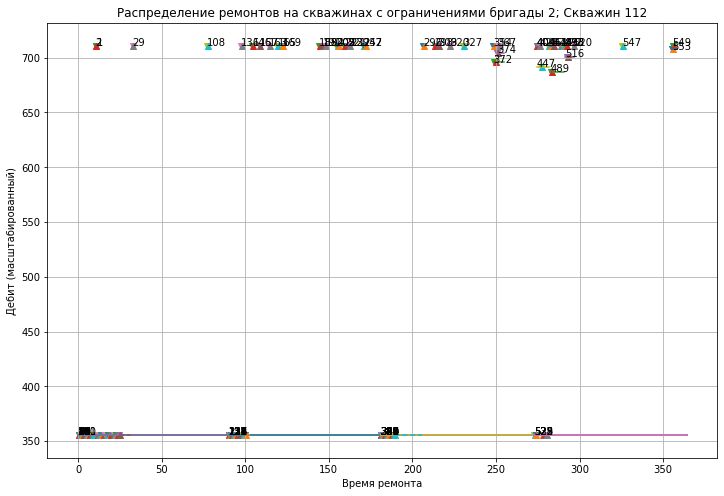

In [616]:
R_=R
D_=D
T_=T
gamma=0.001
#k=1
#mask=~np.isnan(D[:,k])
for k in np.arange(R_.shape[1]):
    plt.figure(figsize=(12,8))
    mask=R_[:,k]>=0
    count=mask[mask==True].shape[0]
#график интеграла функции дебита для каждой скважины
    for s,i in enumerate(R_[:,k]):
        if i<0: 
            break
        order=O[s,k]
        # order>0:
        wsch.update_queue(i,order)
        fun=wsch.debit_functions[i]
        x=fun.supp
        t1_=D_[s,k]
        t2_=T_[s,k]
        if s<R_.shape[0]-1:
            target=R_[s+1,k]
            if target<0:
                t3_=np.inf
                ts_=np.inf
            else:                               
                t3_=D_[s+1,k]
                ts_=otm_distances[R_[s,k],R_[s+1,k]]
        else:
            t3_=np.inf
            ts_=np.inf
        #if fun.cs:
        delta=osh.get_delta(t1_,t2_,t3_,ts=ts_,bound=wsch.debit_functions[R_[s,k]].supp[1])
        if delta<0:
            print(i,t1_,t2_,t3_,ts_,wsch.debit_functions[R_[s,k]].supp[1])
        
        y=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in x]
        t1=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in [D_[:,k][s]] if ~np.isnan(w)]
        t2=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in [T_[:,k][s]] if ~np.isnan(w)]
        plt.plot(x,y)
        tilda=(wsch.f6(t1_,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2))
        #print(tilda,i)
        plt.plot([t1_,t1_+delta],[tilda,tilda],linestyle='dashed')
        if len(t1)>0:
            plt.scatter(D_[:,k][s],t1,marker='v')
            plt.scatter(T_[:,k][s],t1,marker='^')
        plt.annotate(str(i),xy=(fun.supp[0],(wsch.f6(fun.supp[0],fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2))))
        
    #if np.fmod(i,2)==0:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    #else:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    plt.title('Распределение ремонтов на скважинах с ограничениями бригады '+str(k)+'; Скважин '+str(count))
    plt.xlabel('Время ремонта')
    plt.ylabel('Дебит (масштабированный)')    #обозначение номера скважины, для которой построена интегральная функция
    plt.grid(True)
    #plt.savefig(path+'distributions_group '+str(k)+'.png')
    plt.show()
    

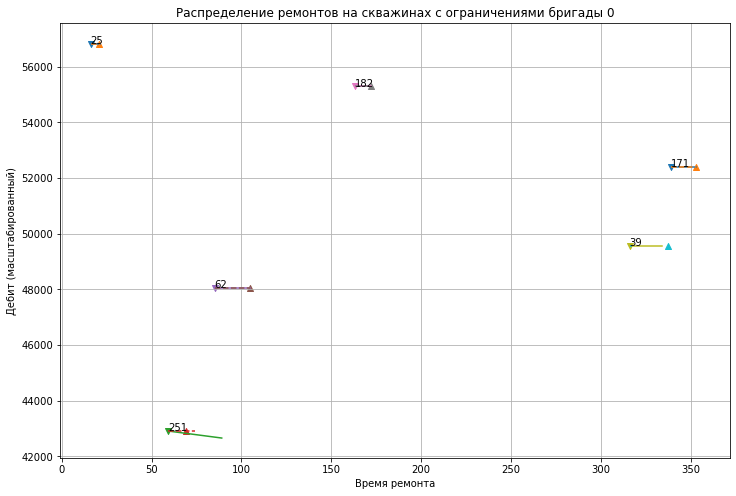

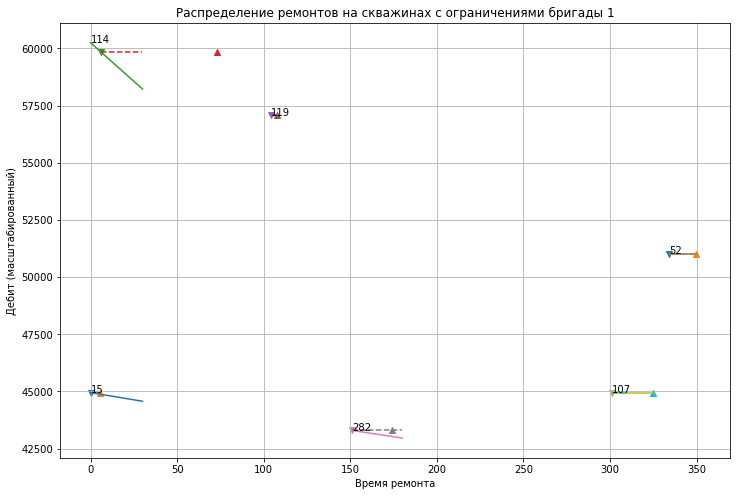

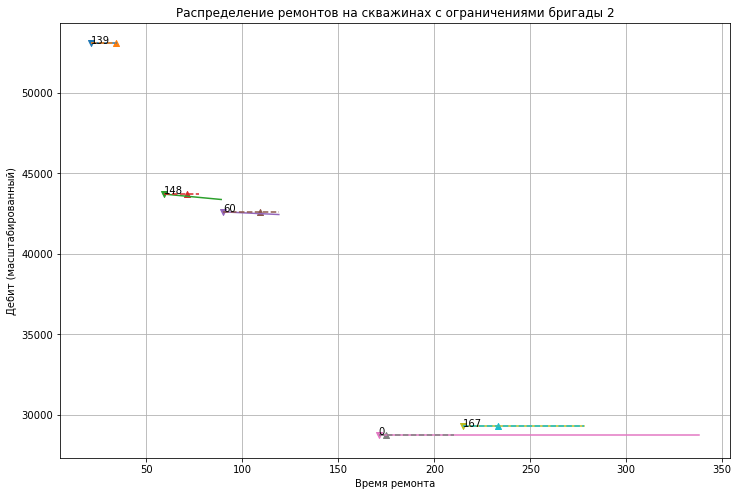

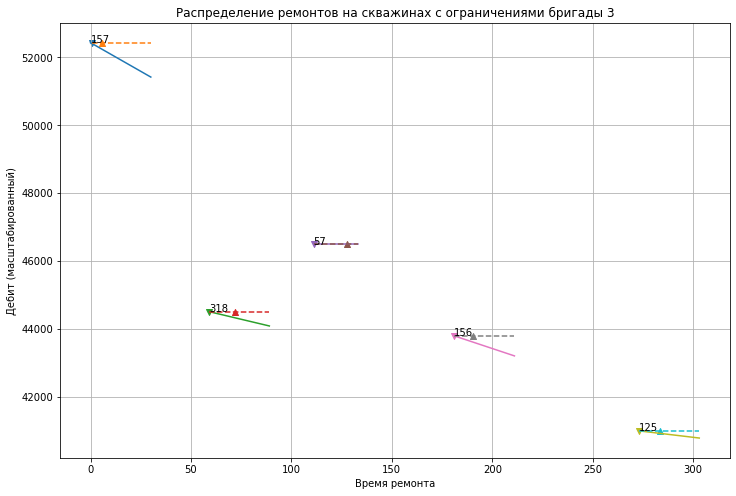

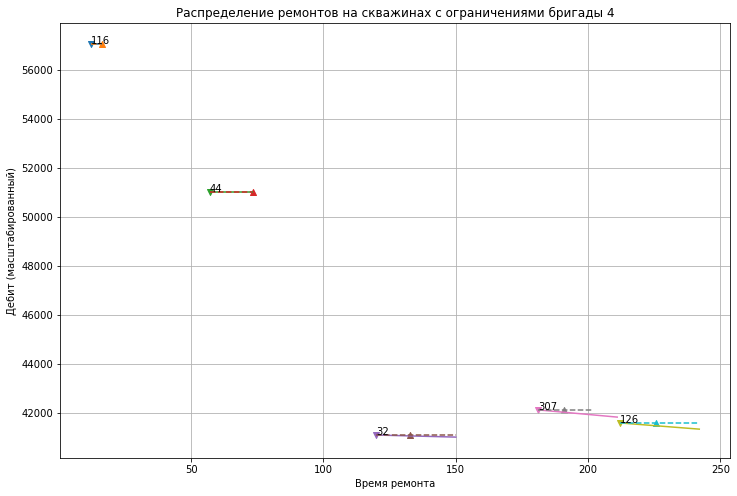

...

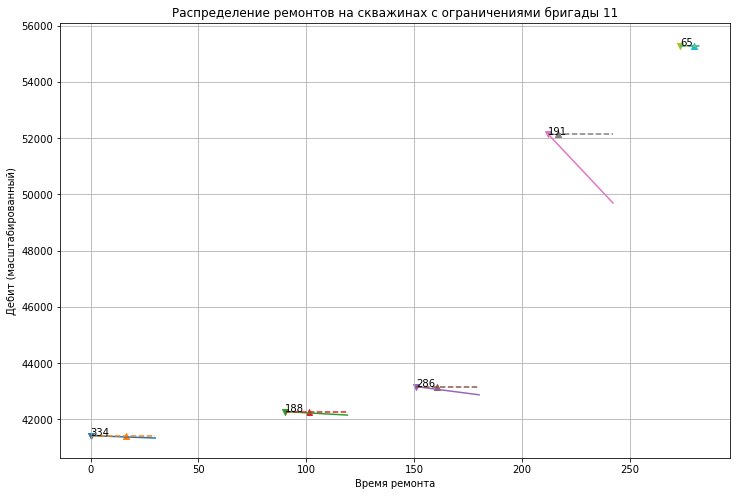

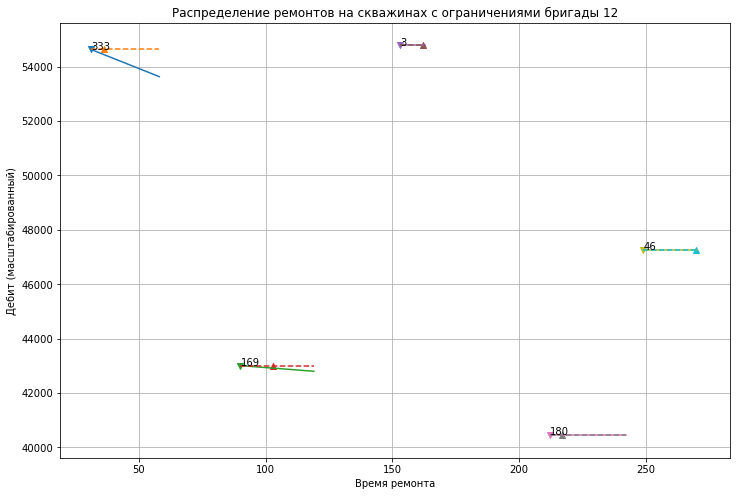

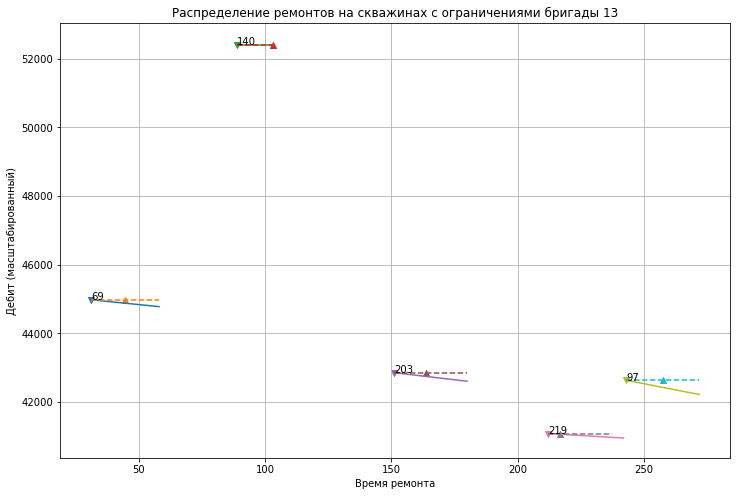

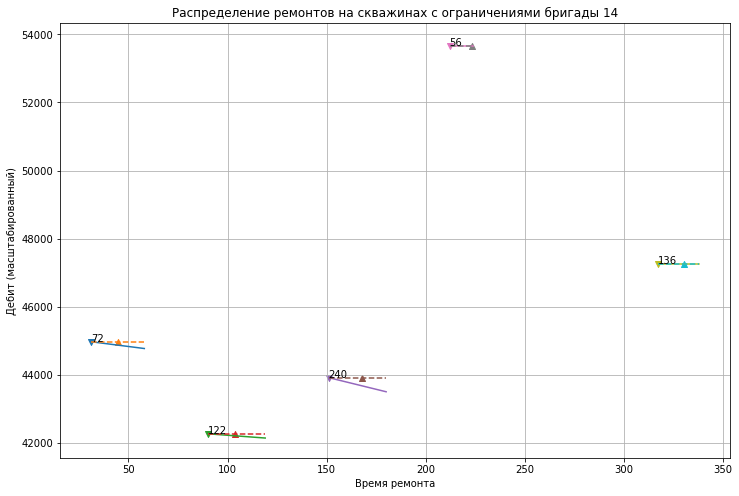

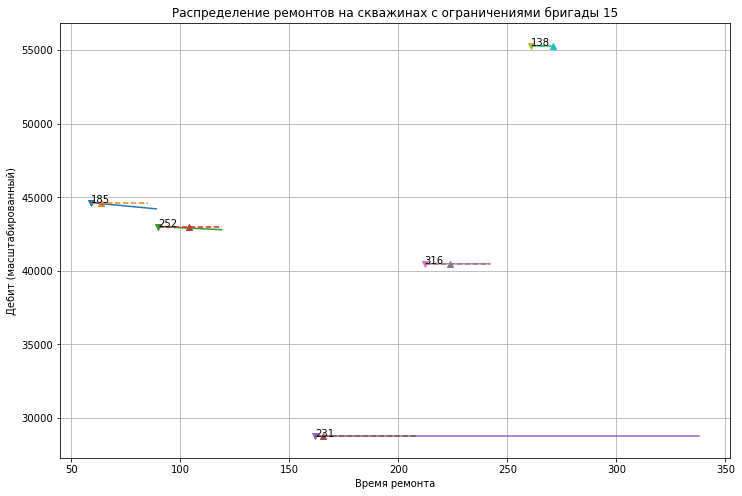

In [133]:
R_=R
D_=D
T_=T
gamma=0.001
#k=1
#mask=~np.isnan(D[:,k])
for k in np.arange(R_.shape[1]):
    plt.figure(figsize=(12,8))
#график интеграла функции дебита для каждой скважины
    for s,i in enumerate(R_[:,k]):
        if i<0: 
            break
        order=O[s,k]
        # order>0:
        wsch.update_queue(i,order)
        fun=wsch.debit_functions[i]
        x=fun.supp
        t1_=D_[s,k]
        t2_=T_[s,k]
        if s<R_.shape[0]-1:
            target=R_[s+1,k]
            if target<0:
                t3_=np.inf
                ts_=np.inf
            else:                               
                t3_=D_[s+1,k]
                ts_=ts1[R_[s,k],R_[s+1,k]]
        else:
            t3_=np.inf
            ts_=np.inf
        #if fun.cs:
        delta=osh.get_delta(t1_,t2_,t3_,ts=ts_,bound=wsch.debit_functions[R_[s,k]].supp[1])
        if delta<0:
            print(i,t1_,t2_,t3_,ts_,wsch.debit_functions[R_[s,k]].supp[1])
        
        y=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in x]
        t1=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in [D_[:,k][s]] if ~np.isnan(w)]
        t2=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in [T_[:,k][s]] if ~np.isnan(w)]
        plt.plot(x,y)
        tilda=(wsch.f6(t1_,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2))
        #print(tilda,i)
        plt.plot([t1_,t1_+delta],[tilda,tilda],linestyle='dashed')
        if len(t1)>0:
            plt.scatter(D_[:,k][s],t1,marker='v')
            plt.scatter(T_[:,k][s],t1,marker='^')
        plt.annotate(str(i),xy=(fun.supp[0],(wsch.f6(fun.supp[0],fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2))))
        
    #if np.fmod(i,2)==0:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    #else:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    plt.title('Распределение ремонтов на скважинах с ограничениями бригады '+str(k))
    plt.xlabel('Время ремонта')
    plt.ylabel('Дебит (масштабированный)')    #обозначение номера скважины, для которой построена интегральная функция
    plt.grid(True)
    plt.savefig(path+'distributions_group '+str(k)+'.png')
    plt.show()

In [608]:
otm_group=np.load(subpath+'groups.npy')
otm['Бригада']=np.nan
otm['Начало работ']=np.nan
otm['Окончание работ']=np.nan
otm['t1']=np.nan
otm['t2']=np.nan
otm['_t1']=np.nan
otm['_t2']=np.nan
date=pd.to_datetime('01-01-2017')
for j in np.arange(R.shape[1]):
    iname=otm_group[j]
    name=otm.iloc[iname]['group_place']
    for i in np.arange(R.shape[0]):
        #Номер скважены для бригады j
        g=R[i,j]
        if g>=0:
            s=D[i,j]
            e=T[i,j]
            otm['Бригада'].iloc[g]=name
            if (~np.isnan(s))&(~np.isnan(e)):
                otm['t1'].iloc[g]=s
                otm['t2'].iloc[g]=e
                sd=adddays(date,s)
                ed=adddays(date,e)
                otm['Начало работ'].iloc[g]=sd
                otm['Окончание работ'].iloc[g]=ed
                fun=wsch.debit_functions[g]
            if fun.prohibits.shape[0]>0:
                pin=fun.prohibits[0]            
                pfun=wsch.debit_functions[pin]
                otm['_t1'].iloc[g]=pfun.t1
                otm['_t2'].iloc[g]=pfun.t2


                

In [609]:
#R_=R
#T_=T
#D_=D
group=np.load(path+'task\\groups.npy')
cdata['Бригада']=np.nan
cdata['Начало работ']=np.nan
cdata['Окончание работ']=np.nan
cdata['t1']=np.nan
cdata['t2']=np.nan
date=pd.to_datetime('01-01-2017')
for j in np.arange(R_.shape[1]):
    iname=group[j]
    name=cdata.iloc[iname]['Начальное положение бригад на конец 2016 года ']
    for i in np.arange(R_.shape[0]):
        #Номер скважены для бригады j
        g=R_[i,j]
        if g>=0:
            s=D_[i,j]
            e=T_[i,j]
            cdata['Бригада'].iloc[g]=name
            cdata['t1'].iloc[g]=s
            cdata['t2'].iloc[g]=e
            sd=adddays(date,s)
            ed=adddays(date,e)
            cdata['Начало работ'].iloc[g]=sd
            cdata['Окончание работ'].iloc[g]=ed
        #date+pd.DateOffset(days=e)
        
        

In [610]:
otm['t1_service']=np.nan
otm['t2_service']=np.nan
otm['service']=np.nan
for i in otm.index:
    well=otm.loc[i,'Well']
    try:
        otm.loc[i,'t1_service']=cdata.loc[well,'t1']
        otm.loc[i,'t2_service']=cdata.loc[well,'t2']
        otm.loc[i,'service']=cdata.loc[well,'вид ремонта ']
    except KeyError:
        print(well)

US-637
US-637


In [614]:
otm.to_excel(path+'otm_v5.xlsx')

In [613]:
mask=otm['interseption']==True
display(otm[mask])

,Pad,Well,Start date,End date,Период проведеняи,"Duration, hrs",Process group,Веерное отключение,Признак остановки,quarter,...,Начало работ,Окончание работ,t1,t2,_t1,_t2,t1_service,t2_service,service,interseption
46,PAD_63_SVA,SVA-53311,2017-01-01 00:00:00,2017-03-31 00:00:00,I квартал,9.300000,"Flowline, manifolds, valves etc inc gas lift d...",NaN,NaN,1.0,...,2017-01-23 17:48:59.994507,2017-01-24 03:06:59.994507,22.742361,23.129861,NaN,NaN,20.395000,25.520000,ТРС,True
81,PAD_218_WS,WS-7014,2017-01-01 00:00:00,2017-03-31 00:00:00,I квартал,8.216667,"Flowline, manifolds, valves etc inc gas lift d...",NaN,NaN,1.0,...,2017-01-01 21:05:00,2017-01-02 05:18:00,0.878472,1.220833,NaN,NaN,0.250000,5.771000,КРС,True
102,PAD_7_WS,WS-1245,2017-01-01 00:00:00,2017-03-31 00:00:00,I квартал,16.383333,"Flowline, manifolds, valves etc inc gas lift d...",NaN,NaN,1.0,...,2017-01-15 09:00:00,2017-01-16 01:23:00,14.375000,15.057639,NaN,NaN,14.646000,21.646000,КРС,True
120,PAD_2_US,US-351,2017-04-01 00:00:00,2017-06-30 00:00:00,II квартал,20.416667,"Flowline, manifolds, valves etc inc gas lift d...",NaN,NaN,2.0,...,2017-04-16 09:00:00,2017-04-17 05:25:00,105.375000,106.225694,NaN,NaN,103.417000,117.250000,КРС,True
123,PAD_2_US,US-2119,2017-04-01 00:00:00,2017-06-30 00:00:00,II квартал,0.833333,"Flowline, manifolds, valves etc inc gas lift d...",NaN,NaN,2.0,...,2017-04-02 21:58:00,2017-04-02 22:48:00,91.915278,91.950000,NaN,NaN,86.022003,93.230003,ТРС,True
190,PAD_20_WS,WS-1271,2017-05-27 07:03:00,2017-05-27 13:15:00,NaN,6.200000,Power Generation/Supply,NaN,Требует остановки,NaN,...,2017-05-27 09:00:00,2017-05-27 15:12:00,146.375000,146.633333,NaN,NaN,135.751007,147.147003,КРС,True
193,PAD_12_WS,WS-1556,2017-05-29 07:03:00,2017-05-29 13:10:00,NaN,6.116667,Power Generation/Supply,Веерное отключение,Требует остановки,NaN,...,2017-05-29 09:00:00,2017-05-29 15:07:00,148.375000,148.629861,NaN,NaN,144.709000,152.126007,КРС,True
355,PAD_5_US,US-202,2017-09-06 10:28:00,2017-09-07 02:00:00,NaN,15.533333,Power Generation/Supply,NaN,Требует остановки,NaN,...,2017-09-06 10:28:00.029297,2017-09-07 02:00:00.029297,248.436111,249.083334,NaN,NaN,243.000000,257.666992,КРС,True
373,PAD_5_US,US-202,2017-09-06 10:28:00,2017-09-12 20:40:00,NaN,18.666667,Power Generation/Supply,NaN,Требует остановки,NaN,...,2017-09-07 09:00:00,2017-09-08 03:40:00,249.375000,250.152778,NaN,NaN,243.000000,257.666992,КРС,True


In [611]:
otm['interseption']=np.nan

In [612]:
mask=~np.isnan(otm['t1'])
otm.loc[mask,'interseption']=otm.loc[mask].apply(lambda x: isinterseption(np.array([x[17],x[18]]),np.array([x[21],x[22]])),axis=1)
#otm.loc[mask,'interseption']=otm.loc[mask].apply(lambda x: x.shape,axis=1)

In [18]:
joined['Well'].value_counts()

WS-7494      25
WS-7617      25
WS-7457      24
WS-5640      12
WS-7615      11
             ..
SVA-53325     1
WS-1461       1
SVA-53319     1
WS-1498       1
SVA-1008      1
Name: Well, Length: 340, dtype: int64

In [31]:
group

,Well,вид ремонта,Stop oil rate,Start oil rate,t1,t2,Продолжительность ремонта
290,WS-7494,КРС,11.495699,12.0,69.458,76.125,6.667
619,WS-7494,Power Generation/Supply,11.495699,11.495699,274.97779,275.650012,16.133333
662,WS-7494,Power Generation/Supply,11.495699,11.495699,275.650012,276.398623,17.966667
703,WS-7494,Power Generation/Supply,11.495699,11.495699,282.934026,283.52986,14.3
730,WS-7494,Power Generation/Supply,11.495699,11.495699,292.798607,293.486107,16.5


In [112]:
mask1=otm['Q0'].isnull()
print(mask1[mask1==True].shape)

(81,)


In [27]:
OR.index=OR['Well']

In [411]:
otm[['Q0','Q1']]=np.nan
for i in otm.index:
    well=otm.loc[i,'Well']
    try:
        q0=OR.loc[well,'Дебит по скважинам']
        if np.isnan(q0):            
                q0=cdata.loc[well,'Stop oil rate']
        otm.loc[i,['Q0','Q1']]=q0
    except KeyError:
        try:
            q0=cdata.loc[well,'Stop oil rate']
            otm.loc[i,['Q0','Q1']]=q0
        except KeyError:
            continue
                       
            
        
    

In [412]:
cdata['Well']=cdata.index
c2=['Well','Process group','Q0', 'Q1','Start', 'End','t1', 't2','Duration, hrs']
c1=['Well','вид ремонта ','Stop oil rate','Start oil rate','Start', 'End','t1', 't2','Продолжительность ремонта']
mask=~otm['Признак остановки'].isnull()
array=np.vstack((cdata[c1].values,otm[mask][c2].values))
joined=pd.DataFrame(array,columns=c1)
mask=joined['Stop oil rate'].isnull()
joined.loc[mask,'Stop oil rate']=0.

In [166]:
a=np.array([0,5])
b=np.array([5,6])
c=np.array([6,7])
L=np.array([a,b,c])
ml.residual(a,a,shape=2)

array([], dtype=float64)

In [413]:
mask=joined['Stop oil rate'].isnull()
print(mask[mask==True].shape)

(0,)


In [515]:
group

,Well,вид ремонта,Stop oil rate,Start oil rate,Start,End,t1,t2,Продолжительность ремонта
90,US-178,КРС,7.0,13.0,59.0,89.0,64.25,78.667,14.417
343,US-178,Reservoir,7.0,7.0,0.0,89.0,36.375,37.368056,23.833333
344,US-178,Reservoir,7.0,7.0,0.0,89.0,41.375,42.375,24.0
345,US-178,Reservoir,7.0,7.0,0.0,89.0,40.375,41.375,24.0
347,US-178,Reservoir,7.0,7.0,0.0,89.0,42.375,43.375,24.0
350,US-178,Reservoir,7.0,7.0,0.0,89.0,39.375,40.375,24.0
353,US-178,Reservoir,7.0,7.0,0.0,89.0,38.375,39.375,24.0
356,US-178,Reservoir,7.0,7.0,0.0,89.0,37.375,38.375,24.0
359,US-178,Reservoir,7.0,7.0,0.0,89.0,43.375,44.375,24.0
361,US-178,Reservoir,7.0,7.0,0.0,89.0,35.375,36.260417,21.25


In [414]:
joined.to_csv(path+'joined.csv',index_label=False)

In [4]:
joined=pd.read_csv(path+'joined.csv')

In [514]:
mask=joined['Well']=='US-178'
group=joined[mask]
mask1=~group['t1'].isnull()
group=group[mask1]

In [76]:
group=group.loc[group.index[1:]]

In [507]:
group

,Well,вид ремонта,Stop oil rate,Start oil rate,Start,End,t1,t2,Продолжительность ремонта
497,US-24039,Reservoir,29.0,29.0,90.0,180.0,111.375,112.375,24.0
501,US-24039,Reservoir,29.0,29.0,90.0,180.0,112.375,113.375,24.0
503,US-24039,Reservoir,29.0,29.0,90.0,180.0,113.375,114.375,24.0
504,US-24039,Reservoir,29.0,29.0,90.0,180.0,110.5625,111.135417,13.75


In [126]:
reload(ml)

<module 'ml' from 'd:\\Python\\NVIDA\\ml.py'>

In [69]:
group.loc[290,['t1','t2']]=np.array([274.,290.])

In [450]:
group

,Well,вид ремонта,Stop oil rate,Start oil rate,Start,End,t1,t2,Продолжительность ремонта
1,SVA-1015,КРС,7.0,7.0,-20.0,44.0,NaN,NaN,34.833
426,SVA-1015,Power Generation/Supply,7.0,7.0,129.393056,129.48125,129.393051,129.481246,2.116667
507,SVA-1015,Power Generation/Supply,7.0,7.0,187.45625,187.850694,187.645139,188.039583,9.466667
537,SVA-1015,Power Generation/Supply,7.0,7.0,206.476389,206.965278,206.476395,206.965284,11.733333


In [115]:
values

array([[69.45800018310547, 76.125, 11.495698868682842, 12.0],
       [274.977789984809, 275.65001220703124, 12.0, 12.0],
       [275.65001220703124, 276.39862331814237, 12.0, 12.0],
       [282.934026421441, 283.52985975477435, 12.0, 12.0],
       [292.79860704210074, 293.48610704210074, 12.0, 12.0]], dtype=object)

In [143]:
fun=debit_int(values[0][[0,1]],values[0][[2,3]])
fun(76,77)

10.5

In [324]:
group=joined_.loc[index]

In [416]:
y1.shape

(327, 356)

In [480]:
y_=y.sum(axis=0)
y1_=y1.sum(axis=0)
y2_=y2.sum(axis=0)

In [469]:
y.shape

(2, 356)

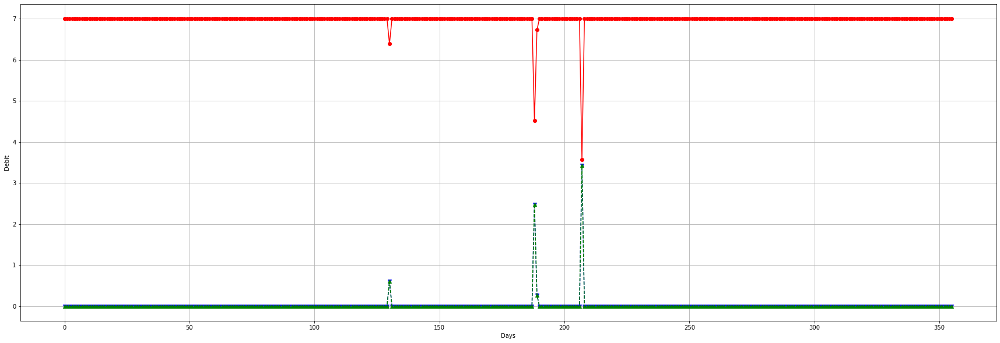

In [477]:
plt.figure(figsize=(30,10))
i=1
plt.plot(x,y[i],marker='o',color='red')
plt.plot(x,y1[i],marker='v',color='blue',linestyle='--')
plt.plot(x,y2[i],marker='^',color='green',linestyle='--')
    
plt.xlabel('Days')
plt.ylabel('Debit')
plt.grid()
plt.show()

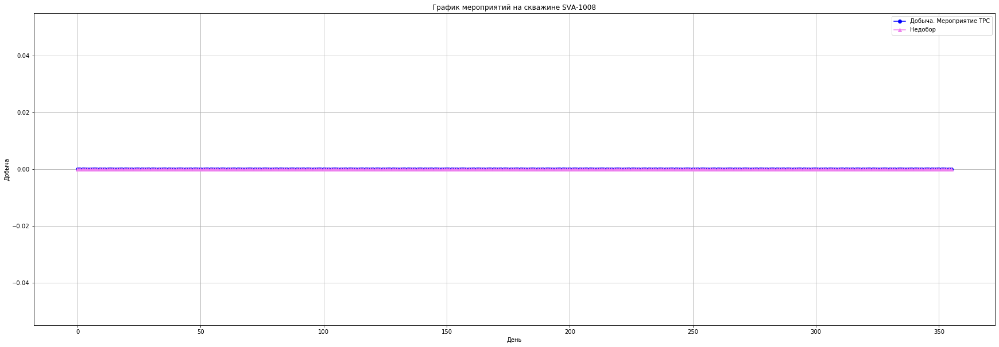

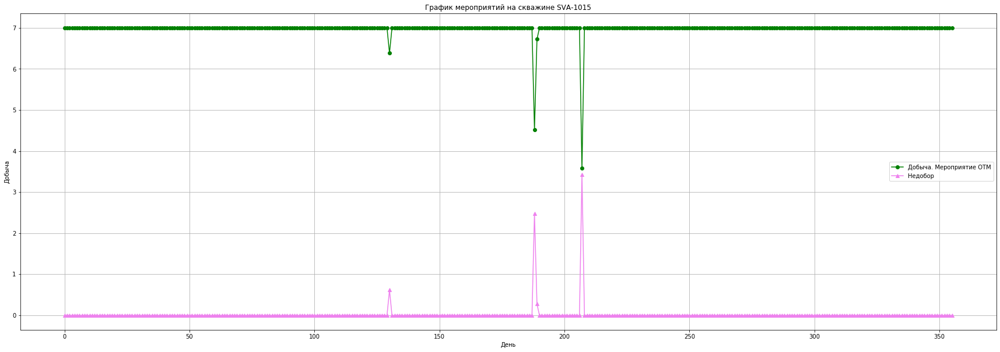

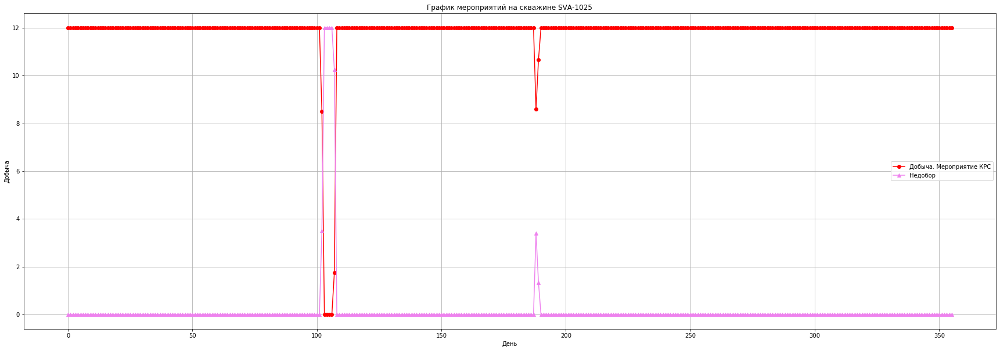

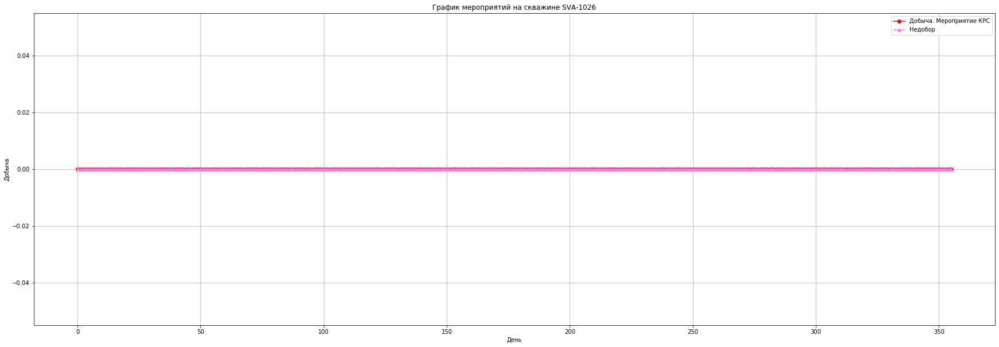

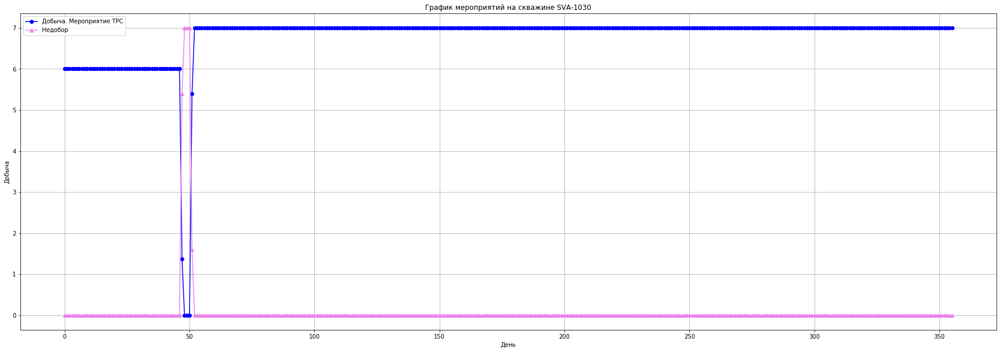

...

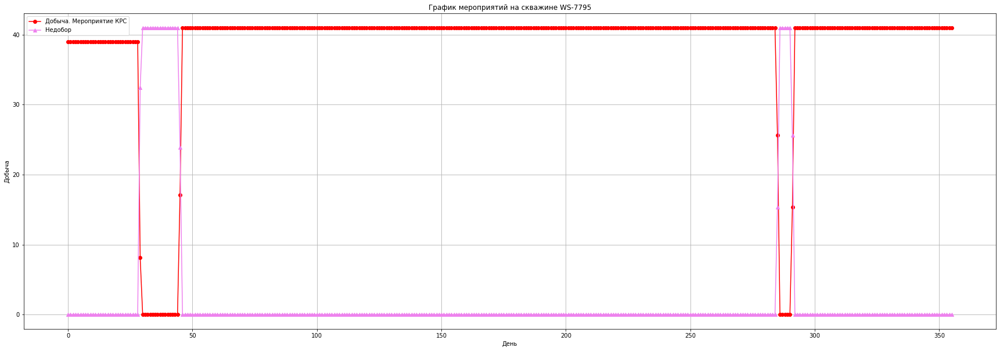

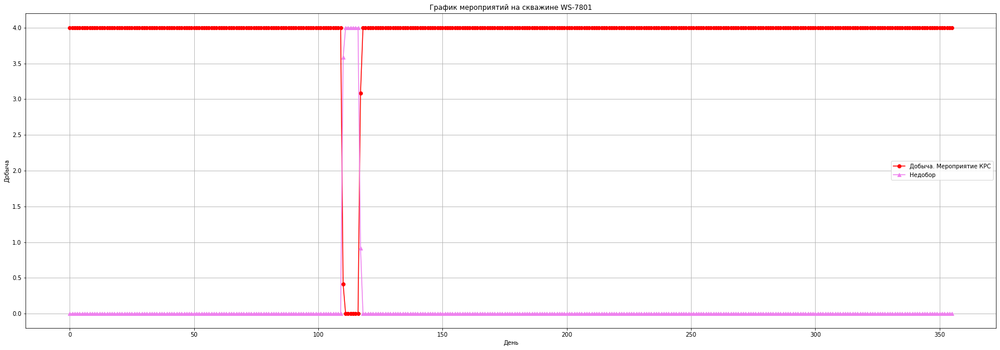

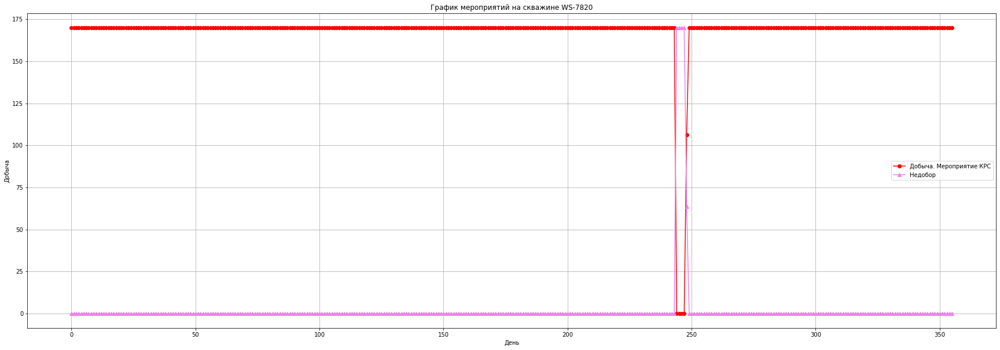

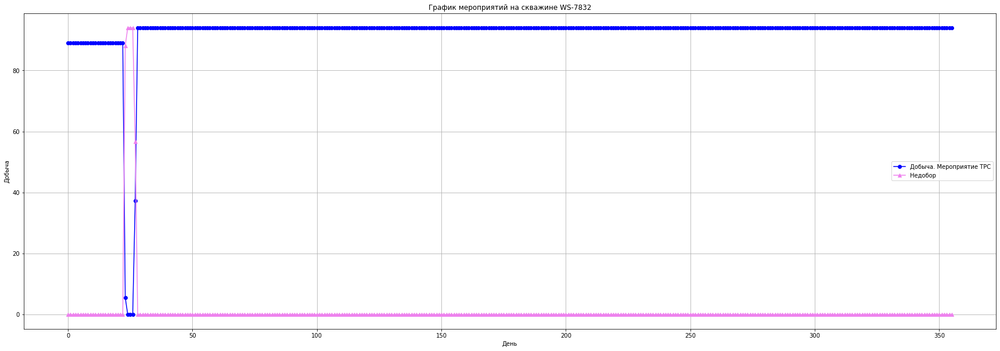

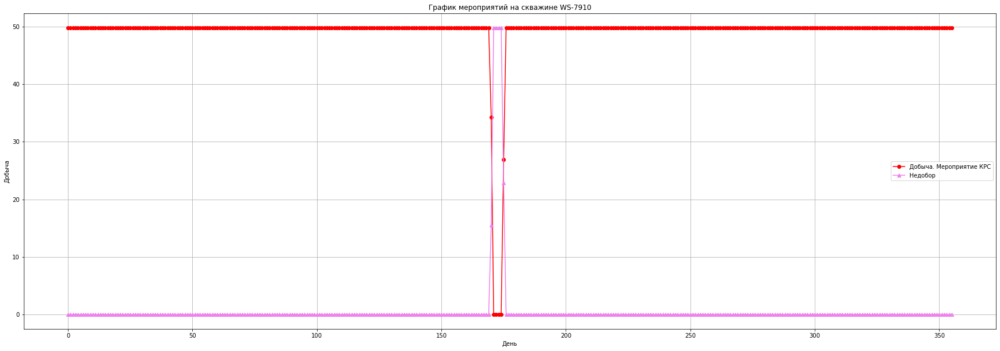

In [505]:
subpath='D:\\ранжирование скважин\\Распределения\\wells\\'
mask=~joined['t1'].isnull()
joined_=joined[mask]
joined_.sort_values(by='t1',inplace=True)
n=int(joined_['t1'].max())+1
x=np.arange(n)
Y=[]
Y1=[]
Y2=[]
agg=joined_.groupby('Well')
for j,group in enumerate(agg):
    y=[]
    y1=[]
    y2=[]
    index=group[1].index
    values=merge(data=joined_,index=index)
    #print(values)
    #print(values.shape)
    fun=get_values(values).value
    values1=values.copy()
    values1[:,1]=values1[:,0]
    fun1=get_values(values1).value
    values2=values.copy()
    values2[:,0]=values2[:,1]
    fun2=get_values(values2).value
    for i in x:
        w=fun(i)
        y.append(w)
        w1=fun1(i)
        w2=fun2(i)
        y1.append(w1-w)
        y2.append(w2-w)
    y=np.array(y)
    y1=np.array(y1)
    y2=np.array(y2)
    mask=group[1]['вид ремонта ']=='КРС'
    mask1=group[1]['вид ремонта ']=='ТРС'
    color='green'
    kind='ОТМ'
    if mask[mask==True].shape[0]>0:
        color='red'
        kind='КРС'
    if mask1[mask1==True].shape[0]>0:
        color='blue'
        kind='ТРС'
    
    
    #plt.ioff()
    plt.figure(figsize=(30,10))
    legend1,=plt.plot(x,y,marker='o',color=color)
    legend2,=plt.plot(x,y1,marker='^',color='violet')
    plt.legend((legend1,legend2),('Добыча. Мероприятие '+str(kind),'Недобор'))
    plt.title('График мероприятий на скважине '+str(group[0]))
    plt.xlabel('День')
    plt.ylabel('Добыча')
    plt.grid()
    plt.savefig(subpath+str(group[0])+'.png')

    

    


    
    Y.append(y)
    Y1.append(y1)
    Y2.append(y2)
    #if j==0:
        #print(group[0])
        #break
            
y=np.array(Y)
y1=np.array(Y1)
y2=np.array(Y2)            
    
    
    

In [491]:
group[1].columns

Index(['Well', 'вид ремонта ', 'Stop oil rate', 'Start oil rate', 'Start',
       'End', 't1', 't2', 'Продолжительность ремонта'],
      dtype='object')

[[129.39305114746094 129.48124559190538 7.0 7.0]
 [187.64513888888888 188.03958333333333 7.0 7.0]
 [206.4763946533203 206.9652835422092 7.0 7.0]]


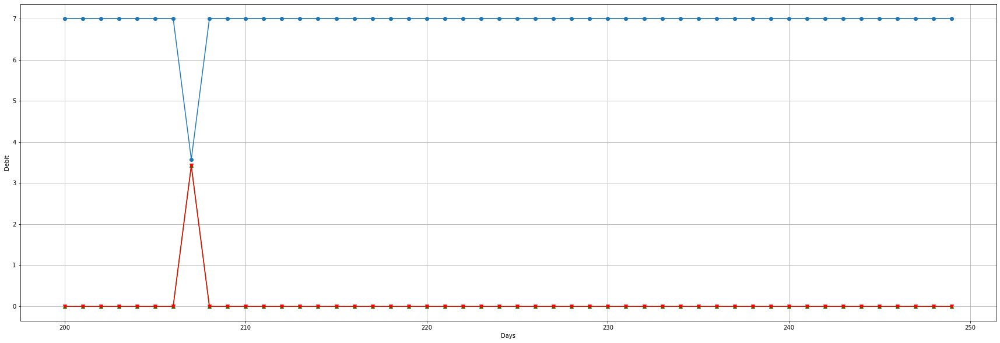

In [464]:
#group=group[1]  
plt.figure(figsize=(30,10))
n=50
x=np.arange(n)+200
j=0
y=[]
y1=[]
y2=[]
values=merge(data=joined,index=group.index)
print(values)
fun=get_values(values).value
values1=values.copy()
values1[:,1]=values1[:,0]
fun1=get_values(values1).value

values2=values.copy()
values2[:,0]=values2[:,1]
fun2=get_values(values2).value
#v=values[j]
#fun=debit_int(v[[0,1]],v[[2,3]])
#fun,v=get_fun(values,j)
for i in x:
    y.append(fun(i))
    y1.append(fun1(i))
    y2.append(fun2(i))

            
y=np.array(y)
y1=np.array(y1)
y2=np.array(y2)
#y_=y[1:]-y[:-1]
#y_=y[:-1]-y[1:]        
plt.plot(x,y,marker='o')
plt.plot(x,y1-y,marker='^',color='green')
plt.plot(x,y2-y,marker='v',color='red')
    #t1=v[[0,1]][0]
    #t2=v[[0,1]][1]
    #tau1=values[:,[2,3]].max()
    #tau2=0
    #plt.plot([t1,t1],[tau1,tau2],linestyle='--',color='gray',linewidth=1.5)
    #plt.plot([t2,t2],[tau1,tau2],linestyle='--',color='gray',linewidth=1.5)
    #plt.annotate('{:03.2f}'.format(t1),xy=(t1,0),verticalalignment='top', horizontalalignment='right')
    #plt.annotate('{:03.2f}'.format(t2),xy=(t2,0),verticalalignment='bottom', horizontalalignment='left')
    
plt.xlabel('Days')
plt.ylabel('Debit')
plt.grid()
#plt.savefig(path+'example.png')
plt.show()

In [461]:
group[1]

,Well,вид ремонта,Stop oil rate,Start oil rate,Start,End,t1,t2,Продолжительность ремонта
426,SVA-1015,Power Generation/Supply,7.0,7.0,129.393056,129.48125,129.393051,129.481246,2.116667
507,SVA-1015,Power Generation/Supply,7.0,7.0,187.45625,187.850694,187.645139,188.039583,9.466667
537,SVA-1015,Power Generation/Supply,7.0,7.0,206.476389,206.965278,206.476395,206.965284,11.733333


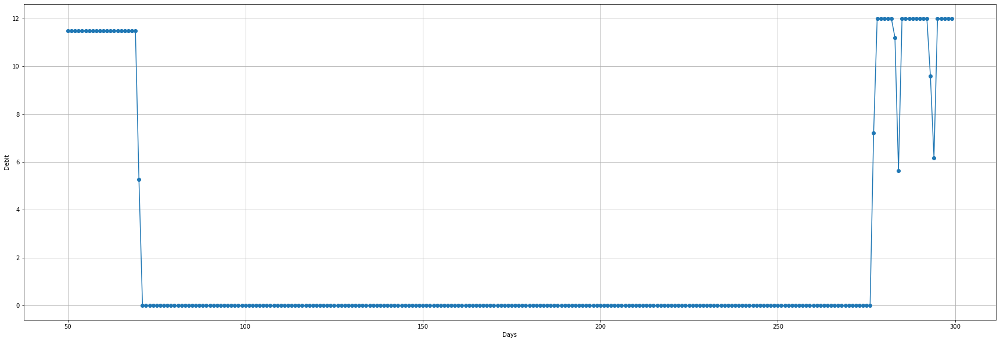

In [292]:

def get_fun(values=np.array([]),j=0):
    v=values[j]
    fun=debit_int(v[[0,1]],v[[2,3]])
    return fun,v[[0,1]]
    
plt.figure(figsize=(30,10))
n=250
x=np.arange(n)+50
j=0
y=[]
#v=values[j]
#fun=debit_int(v[[0,1]],v[[2,3]])
fun,v=get_fun(values,j)
for i in x:
    if i-1<=v[1]:
        y.append(fun(i-1,i))
    else:
        j+=1
        if j<values.shape[0]:            
            fun,v=get_fun(values,j)
            #print(v)
        y.append(fun(i-1,i))
            

        
plt.plot(x,y,marker='o')
    #t1=v[[0,1]][0]
    #t2=v[[0,1]][1]
    #tau1=values[:,[2,3]].max()
    #tau2=0
    #plt.plot([t1,t1],[tau1,tau2],linestyle='--',color='gray',linewidth=1.5)
    #plt.plot([t2,t2],[tau1,tau2],linestyle='--',color='gray',linewidth=1.5)
    #plt.annotate('{:03.2f}'.format(t1),xy=(t1,0),verticalalignment='top', horizontalalignment='right')
    #plt.annotate('{:03.2f}'.format(t2),xy=(t2,0),verticalalignment='bottom', horizontalalignment='left')
    
plt.xlabel('Days')
plt.ylabel('Debit')
plt.grid()
plt.show()

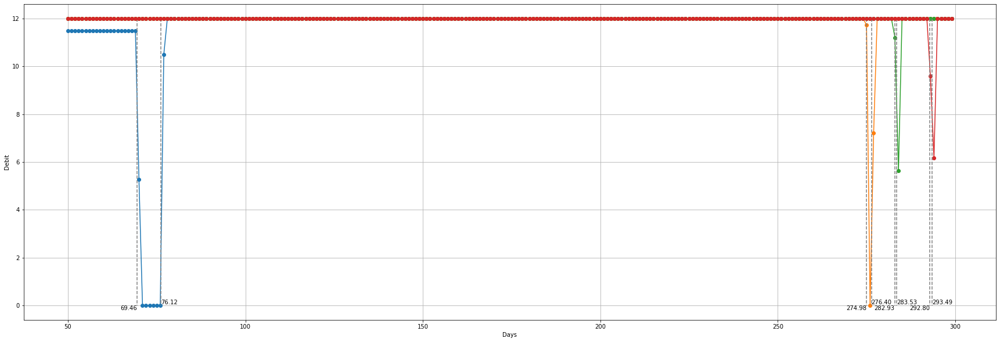

In [118]:
plt.figure(figsize=(30,10))
n=250
x=np.arange(n)+50
for v in values:
    y=[]
    fun=debit_int(v[[0,1]],v[[2,3]])
    for i in x:
        y.append(fun(i-1,i))
    plt.plot(x,y,marker='o')
    t1=v[[0,1]][0]
    t2=v[[0,1]][1]
    tau1=values[:,[2,3]].max()
    tau2=0
    plt.plot([t1,t1],[tau1,tau2],linestyle='--',color='gray',linewidth=1.5)
    plt.plot([t2,t2],[tau1,tau2],linestyle='--',color='gray',linewidth=1.5)
    plt.annotate('{:03.2f}'.format(t1),xy=(t1,0),verticalalignment='top', horizontalalignment='right')
    plt.annotate('{:03.2f}'.format(t2),xy=(t2,0),verticalalignment='bottom', horizontalalignment='left')
    
plt.xlabel('Days')
plt.ylabel('Debit')
plt.grid()
plt.show()

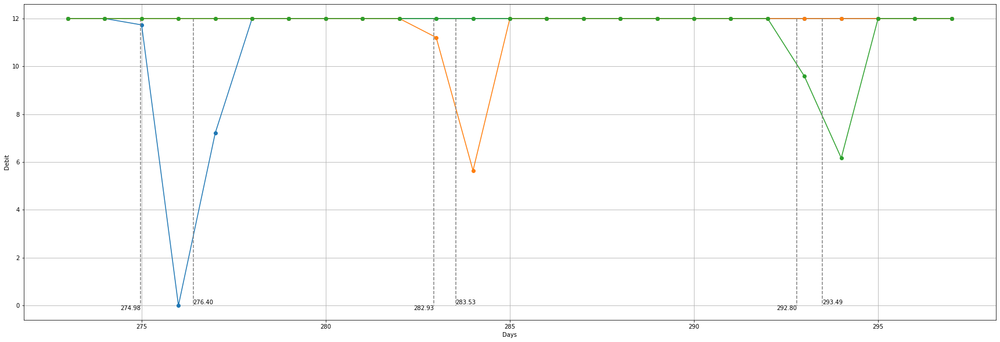

In [119]:
plt.figure(figsize=(30,10))
n=25
x=np.arange(n)+273
for v in values[1:]:
    y=[]
    fun=debit_int(v[[0,1]],v[[2,3]])
    for i in x:
        y.append(fun(i-1,i))
    plt.plot(x,y,marker='o')
    t1=v[[0,1]][0]
    t2=v[[0,1]][1]
    tau1=values[:,[2,3]].max()
    tau2=0
    plt.plot([t1,t1],[tau1,tau2],linestyle='--',color='gray',linewidth=1.5)
    plt.plot([t2,t2],[tau1,tau2],linestyle='--',color='gray',linewidth=1.5)
    plt.annotate('{:03.2f}'.format(t1),xy=(t1,0),verticalalignment='top', horizontalalignment='right')
    plt.annotate('{:03.2f}'.format(t2),xy=(t2,0),verticalalignment='bottom', horizontalalignment='left')
    
plt.xlabel('Days')
plt.ylabel('Debit')
plt.grid()
plt.show()

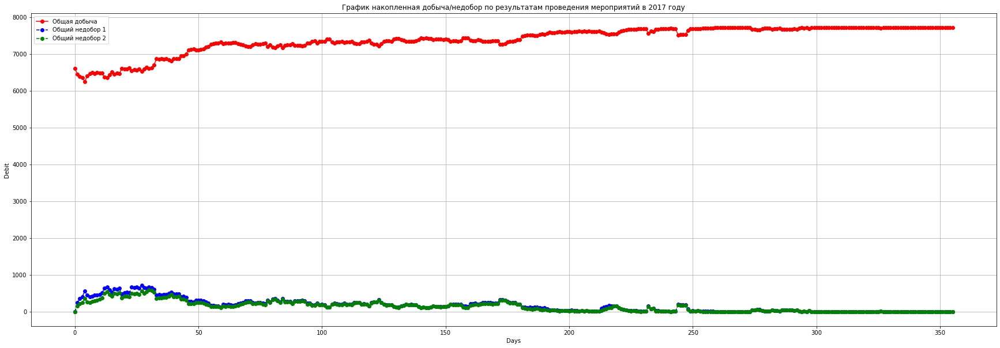

In [483]:
plt.figure(figsize=(30,10))
leg1,=plt.plot(x,y_,marker='o',color='red')
leg2,=plt.plot(x,y1_,marker='o',color='blue',linestyle='--')
leg3,=plt.plot(x,y2_,marker='o',color='green',linestyle='--')
plt.legend((leg1,leg2,leg3),['Общая добыча','Общий недобор 1','Общий недобор 2'])
    
plt.xlabel('Days')
plt.ylabel('Debit')
plt.title('График накопленная добыча/недобор по результатам проведения мероприятий в 2017 году')
plt.grid()
plt.savefig(path+'all.png')
plt.show()

In [484]:
y.shape

(327, 356)

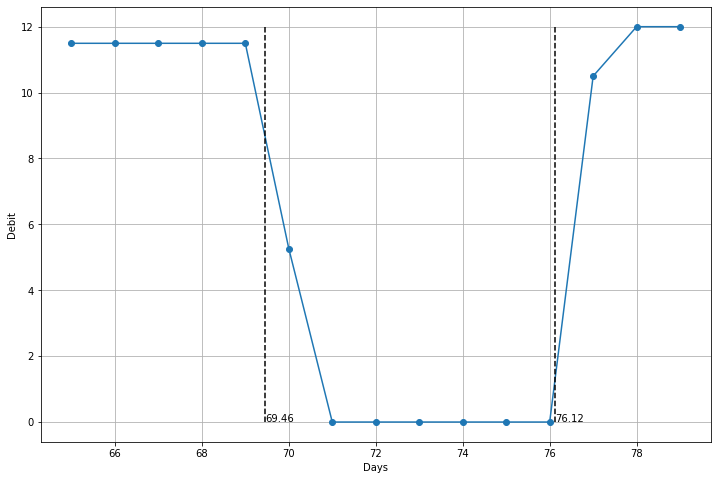

In [165]:
plt.figure(figsize=(12,8))
n=360
x=[]
y=[]
i=65
while i<80:
    fun=debit_int(values[0][[0,1]],values[0][[2,3]])
    x.append(i)
    y.append(fun(i-1,i))
    i+=1
plt.plot(x,y,marker='o')
t1=values[0][0]
t2=values[0][1]
tau1=values[0][[2,3]].max()
tau2=0
plt.plot([t1,t1],[tau1,tau2],linestyle='--',color='black')
plt.plot([t2,t2],[tau1,tau2],linestyle='--',color='black')
plt.annotate('{:03.2f}'.format(t1),xy=(t1,0))
plt.annotate('{:03.2f}'.format(t2),xy=(t2,0))
plt.xlabel('Days')
plt.ylabel('Debit')
plt.grid()
plt.show()


In [313]:
def debit_fun(t=np.array([]),q=np.array([])):
    def value(x=0):
        cq=q[0]
        #print(t[1])
        if x>=t[1]:
            cq=q[1]
        f,v=np.modf(x)
        c=f
        if c==0:
            c=1
        return cq*c
    return value

def debit_int(t=np.array([]),q=np.array([])):
    def value(x1=0,x2=0):
        dt_=x2-x1
        if x2<=t[0]:
            return q[0]*dt_
        if x1>=t[1]:
            return q[1]*dt_
            
        interval=np.array([x1,x2])
        residual=ml.residual(interval,t,shape=2).reshape(-1,2)
        #print(residual)
        s=0
        if residual.shape[0]==0:
            return 0
        elif residual.shape[0]==2:
            i=0
            while i<residual.shape[0]:
                r=residual[i]
                
                dt=r[1]-r[0]
                
                sum_=q[i]*dt
                #print(dt,sum_)
                s+=sum_
                i+=1            
            return s
        else:
            residual=residual.reshape(2)
            dt=residual[1]-residual[0]
            if (x1<residual[0])&(t[0]<=residual[0]):
                return q[1]*dt
            else:
                return q[0]*dt
    return value

       
        
def merge(data, index):
    #mask=data['Well']==well    
    #index=data[mask].index
    group=data.loc[index]
    if group.shape[0]==0:
        return np.array([])
    t=group[['t1','t2']]
    q=group[['Stop oil rate', 'Start oil rate']]
    #print(q)
    kind=group['вид ремонта ']
    sub=(kind=='КРС')|(kind=='TРС')
    kr=kind[sub].index
    other=kind[~sub].index
    disjoint=ml.get_merged_sets(t.values)

    Q=np.empty(shape=disjoint.shape)
    qmax=0
    for i,tau in enumerate(disjoint):
        #Q0=0
        #Q1=0
        maxdq=0
        t0=tau[0]
        t1=tau[1]
        for j, tau_ in enumerate(t.values):
            #print(j)
            if (tau_[0]<=t0)&(tau_[1]>=t0)|(tau_[0]<=t1)&(tau_[1]>=t1):
                q0=q['Stop oil rate'].iloc[j]
                q1=q['Start oil rate'].iloc[j]              
                dq=q1-q0
                if dq>maxdq:
                    maxdq=dq
                    #print(maxdq,i)
                if q0>qmax:
                    qmax=q0
                
        Q[i,0]=qmax
        Q[i,1]=qmax+maxdq
        qmax=qmax+maxdq
        
    return np.hstack((disjoint,Q))                
            
                
            
class get_values:

    def __init__(self,values,delta=1):
        self.j=0        
        self.values=values
        self.delta=delta
        self.fun,self.v=self.get_fun()
        
    def get_fun(self):
        v=self.values[self.j]
        fun=debit_int(v[[0,1]],v[[2,3]])
        return fun,v[[0,1]]

    
    def value(self,x=0):
        if x-self.delta<=self.v[1]:
            return self.fun(x-self.delta,x)
        else:
            self.j+=1
            if self.j<self.values.shape[0]:
                self.fun,self.v=self.get_fun()
            return self.fun(x-self.delta,x)
                
            
            
        
        


    

    
    

In [509]:
values=merge(group,group.index)

In [281]:
fun=get_values(values)

In [511]:
group

,Well,вид ремонта,Stop oil rate,Start oil rate,Start,End,t1,t2,Продолжительность ремонта
497,US-24039,Reservoir,29.0,29.0,90.0,180.0,111.375,112.375,24.0
501,US-24039,Reservoir,29.0,29.0,90.0,180.0,112.375,113.375,24.0
503,US-24039,Reservoir,29.0,29.0,90.0,180.0,113.375,114.375,24.0
504,US-24039,Reservoir,29.0,29.0,90.0,180.0,110.5625,111.135417,13.75


In [510]:
values

array([[110.5625, 111.13541666666667, 29.0, 29.0],
       [111.375, 114.375, 29.0, 29.0]], dtype=object)

In [289]:
group.loc[290,'t2']=275.

In [284]:
group

,Well,вид ремонта,Stop oil rate,Start oil rate,Start,End,t1,t2,Продолжительность ремонта
290,WS-7494,КРС,11.495699,12.000000,NaN,NaN,69.458000,250.000000,6.667000
619,WS-7494,Power Generation/Supply,11.495699,11.495699,274.411111,275.083333,274.977790,275.650012,16.133333
662,WS-7494,Power Generation/Supply,11.495699,11.495699,274.411111,281.831944,275.650012,276.398623,17.966667
703,WS-7494,Power Generation/Supply,11.495699,11.495699,282.371528,290.679167,282.934026,283.529860,14.300000
730,WS-7494,Power Generation/Supply,11.495699,11.495699,291.384028,296.770833,292.798607,293.486107,16.500000


In [70]:
ml.merge(np.array([1,2]),np.array([3,4]))

array([[1, 2],
       [3, 4]])

In [86]:
si=np.argsort(dj[:,0])
sdj=dj[si]

In [91]:
a=np.array([[0,5],[1,2],[6,8],[7,9],[10,12],[10,11]])
b=np.array([6,7])

In [85]:
dj=ml.get_disjoint_sets(a,shape=2)

In [38]:
ml.interseption(a,b,shape=2)

array([1., 5.])

In [28]:
values

array([[ 69.45800018,  76.125     ,  13.51290339,  14.01720453],
       [274.97778998, 275.65001221,  14.52150566,  14.52150566],
       [275.65001221, 276.39862332,  14.52150566,  14.52150566],
       [282.93402642, 283.52985975,  14.52150566,  14.52150566],
       [292.79860704, 293.48610704,  14.52150566,  14.52150566]])

In [24]:
group

,Well,вид ремонта,Stop oil rate,Start oil rate,Start,End,t1,t2,Продолжительность ремонта
290,WS-7494,КРС,11.495699,12.000000,NaN,NaN,69.458000,76.125000,6.667000
619,WS-7494,Power Generation/Supply,11.495699,11.495699,274.411111,275.083333,274.977790,275.650012,16.133333
662,WS-7494,Power Generation/Supply,11.495699,11.495699,274.411111,281.831944,275.650012,276.398623,17.966667
703,WS-7494,Power Generation/Supply,11.495699,11.495699,282.371528,290.679167,282.934026,283.529860,14.300000
730,WS-7494,Power Generation/Supply,11.495699,11.495699,291.384028,296.770833,292.798607,293.486107,16.500000


In [90]:
index1=cdata.index
index2=otm['Well'].value_counts().keys()
index=np.append(index1,index2)
columns1=cdata['вид ремонта '].value_counts().keys()
mask=~otm['Признак остановки'].isnull()
columns2=otm[mask]['Process group'].value_counts().keys()
columns3=pd.Index(['Q0','Q1','t1','t2','tau'])
columns=np.hstack((columns1,columns2,columns3))



In [94]:
OR[[columns]]=np.nan

In [95]:
OR.columns

Index(['Field', 'Pad', 'Well', 'Дебит по скважинам', 'КРС', 'ТРС',
       'Power Generation/Supply', 'Reservoir ', 'Q0', 'Q1', 't1', 't2', 'tau'],
      dtype='object')

In [78]:
cdata.columns

Index(['Месторождение', 'ID', 'Куст', 'Порядок для одинаковых', 'вид ремонта ',
       'Well type after WO', 'Start date', 'End date', 'Stop oil rate',
       'Start oil rate', 'Oil gain', 'Продолжительность ремонта',
       'Оборудование', 'Фиксация на месяц проведения', 'Начатые операции',
       'Месяц проведения', 'Начальное положение бригад на конец 2016 года ',
       'Start', 'End', 'used', 'services', 'equipment', 'Бригада',
       'Начало работ', 'Окончание работ', 't1', 't2'],
      dtype='object')

In [352]:
isinterseption(np.array([2,4]),np.array([4,4]))

False

In [52]:
cdata.to_excel(path+'result_v10.xlsx')

In [37]:
mask=~cdata['Start date'].isnull()

In [16]:
wsch=osh.wells_schedule()
wsch.t=360
wsch.tracing=True
#wsch.t=t
wsch.fit(ts1,tr,Q0,Q1,group,support=support,used=used)
wsch.stop=group.shape[0]
wsch.fun=wsch.f13
mask=np.isin(wsch.free,wsch.supported)
wsch.free=wsch.free[mask]
#usd=wsch.used
#mask=np.isin(wsch.supported,usd)
#
#wsch.free=wsch.supported


In [64]:
np.save(path+'task\\ts.npy',ts1)

In [44]:
np.save(path+'task\\R.npy',R)
np.save(path+'task\\T.npy',T)
np.save(path+'task\\D.npy',D)

In [79]:
T[7,14]

154.0

In [80]:
D[7,14]

144.0

In [7]:
wsch=osh.wells_schedule()
#wsch.t=(tr.sum()/16)*1.1
wsch.t=360
wsch.tracing=False
wsch.fit(ts1,tr,Q0,Q1,group,support=support,used=used)
wsch.stop=Q0.shape[0]
wsch.fun=wsch.f6
trace=wsch.get_routes_v1(tracing=False)
R_,T_,D_,O=osh.get_rout_time(trace)

In [30]:
used=np.load(path+'task\\used.npy')
support=np.load(path+'task\\support.npy')
group=np.load(path+'task\\group.npy')
Q1=np.load(path+'task\\Q1.npy')
Q0=np.load(path+'task\\Q0.npy')
tr=np.load(path+'task\\tr.npy')
ts1=np.load(path+'task\\ts.npy')
#queue=np.load(path+'task\\queue.npy',allow_pickle=True)[()]
#R=np.load(path+'task\\R.npy')
#T=np.load(path+'task\\T.npy')
#D=np.load(path+'task\\D.npy')
#R_=np.load(path+'task\\R_.npy')
#T_=np.load(path+'task\\T_.npy')
#D_=np.load(path+'task\\D_.npy')

In [115]:
wsch.routes=R
wsch.start=D
wsch.end=T

In [29]:
a=np.arange(5)
b=np.arange(5)+10
c=np.vstack((a,b))

In [10]:
reload(osh)

<module 'osh' from 'd:\\Python\\NVIDA\\osh.py'>

In [20]:
wsch=osh.wells_schedule()
wsch.t=360
wsch.tracing=True
stop=group.shape[0]*2
wsch.fun=wsch.f13
#wsch.t=t
wsch.fit(ts1,tr,Q0,Q1,group,support=support,used=used,stop=stop)
mask=np.isin(wsch.free,wsch.supported)
wsch.free=wsch.free[mask]
trace=wsch.get_routes_v1(tracing=True)
R,T,D=osh.get_rout_time(trace)

In [59]:
trace=wsch.get_routes_v1(tracing=True)
R,T,D=osh.get_rout_time(trace)


In [47]:
reload(osh)

<module 'osh' from 'd:\\Python\\NVIDA\\osh.py'>

In [5]:
support=np.empty(shape=(Q0.shape[0],2))
support.fill(np.nan)

In [11]:
used=np.load(path+'task\\used.npy')
support=np.load(path+'task\\support.npy')
group=np.load(path+'task\\groups.npy')
Q0=np.load(path+'task\\Q0.npy')
Q1=np.load(path+'task\\Q1.npy')
tr=np.load(path+'task\\tr.npy')
ts1=np.load(path+'task\\ts.npy')

In [166]:
wsch=osh.wells_schedule()
#wsch.t=(tr.sum()/16)*1.1
wsch.t=360
wsch.fit(ts1,tr,Q0,Q1,group,support=support,used=used)
wsch.stop=Q0.shape[0]
wsch.fun=wsch.f6

In [111]:
reload(osh)

<module 'osh' from 'd:\\Python\\NVIDA\\osh.py'>

In [139]:
R[:,12]

array([-1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1, -1])

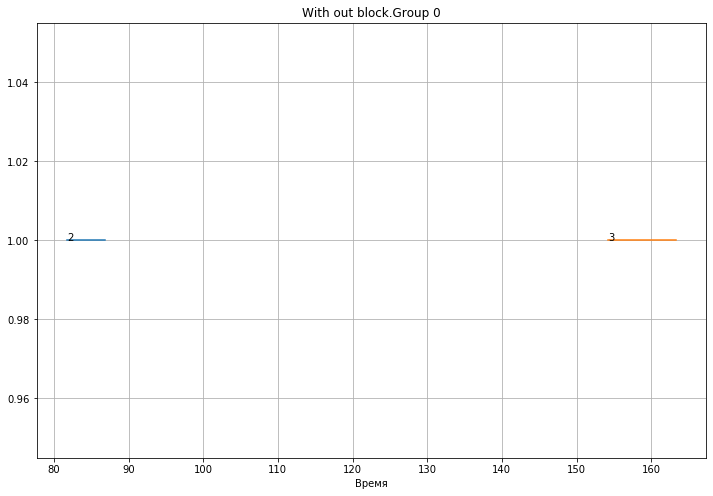

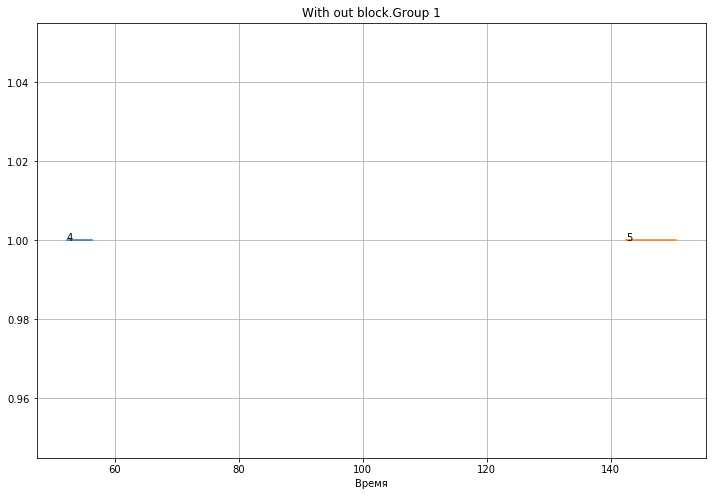

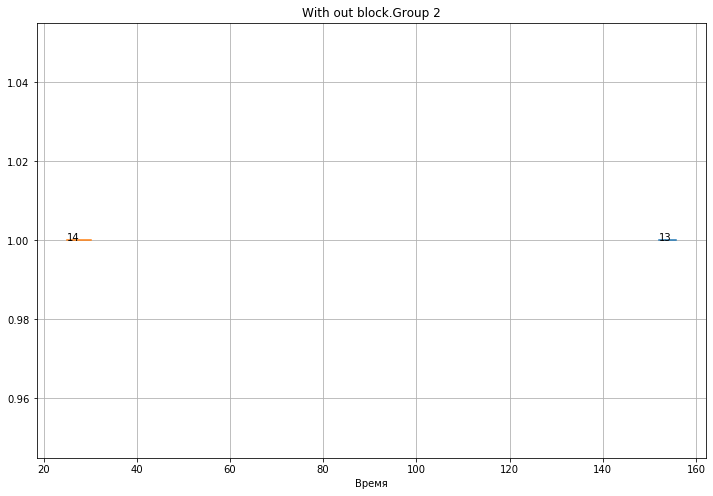

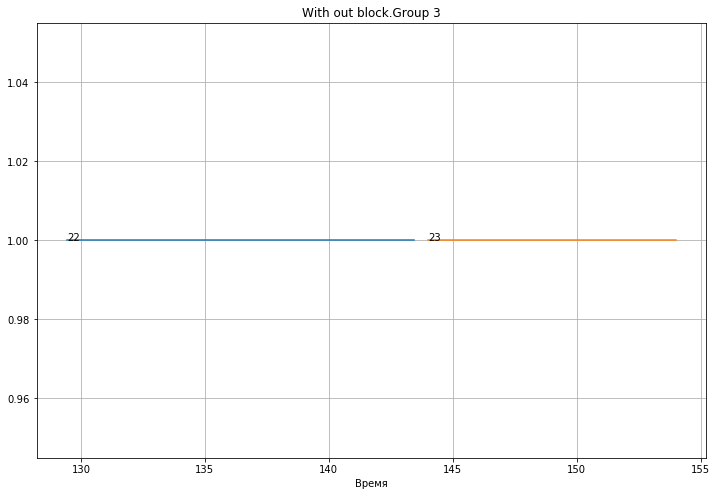

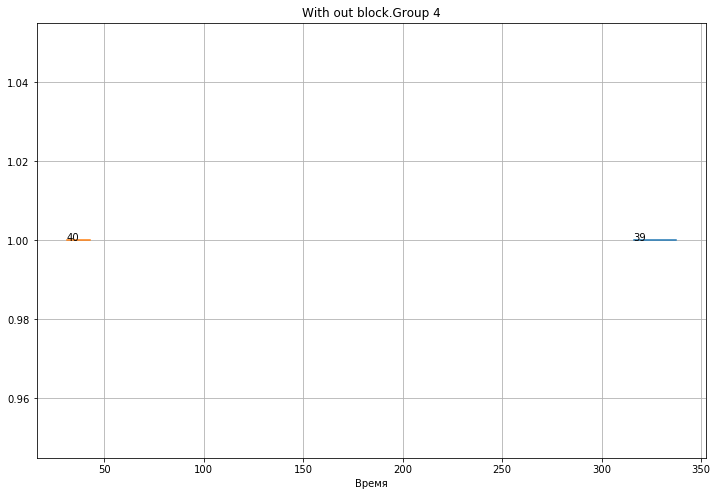

...

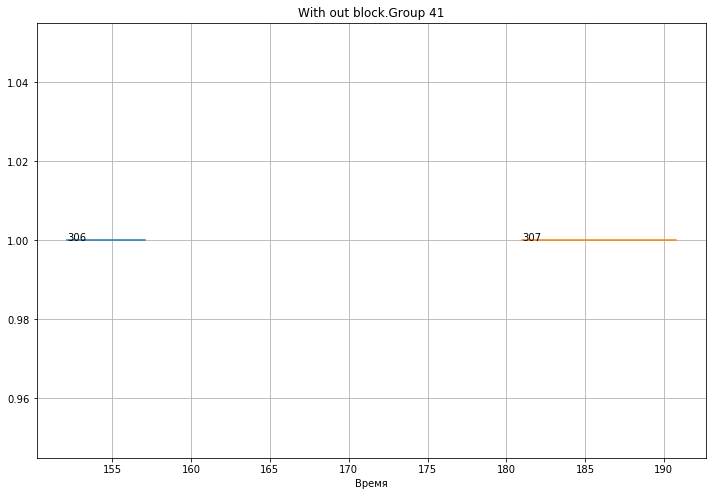

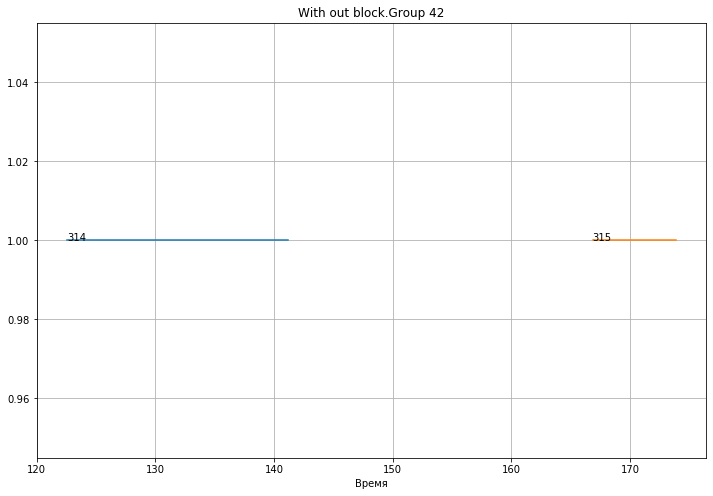

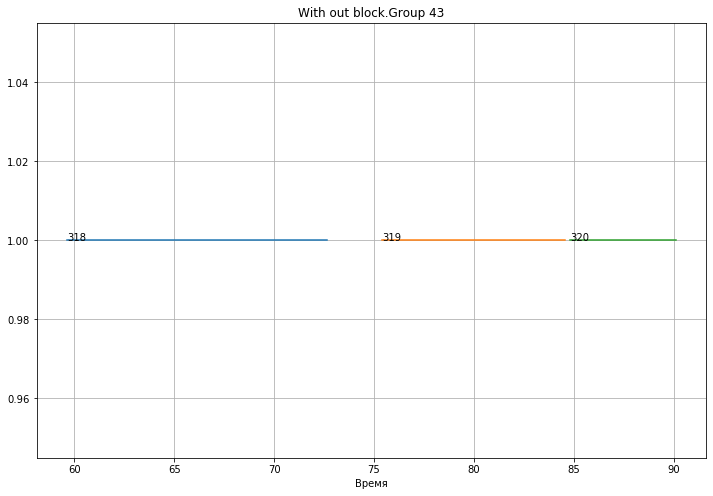

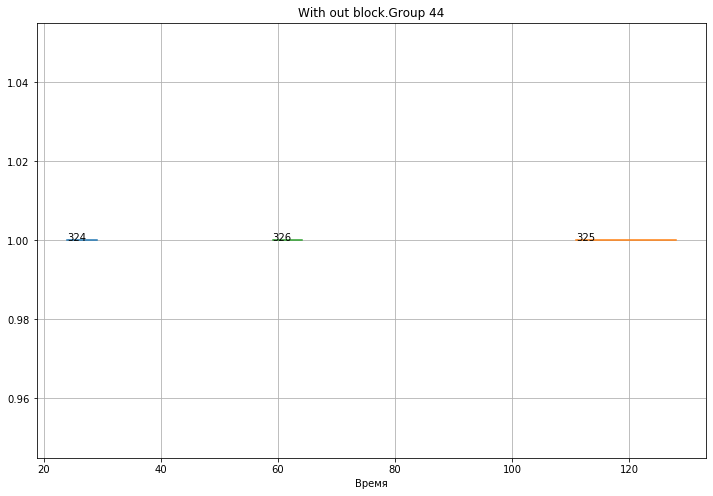

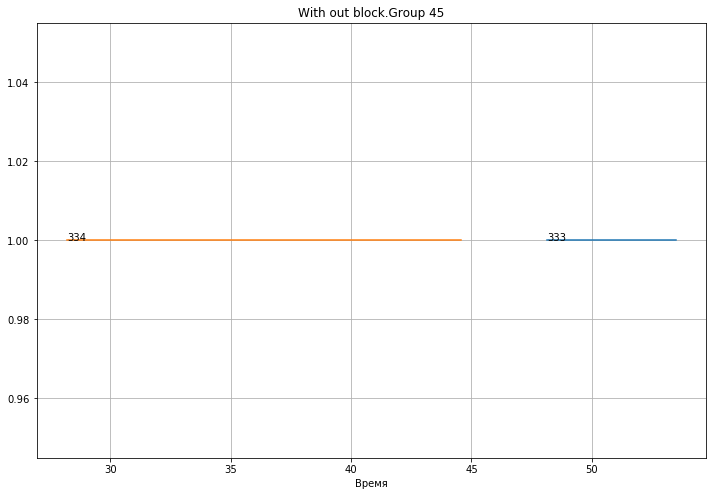

In [21]:
for k in wsch.prohib_dict.keys():
    plt.figure(figsize=(12,8))
    #x=[]
    #y=[]
    for i in wsch.prohib_dict[k]:
        try:
            t1=wsch.debit_functions[i].t1
            t2=wsch.debit_functions[i].t2
            plt.plot([t1,t2],[1,1])
            plt.annotate(str(i),(t1,1))
        except KeyError:
            print()
            
    plt.title('With out block.Group '+str(k))
    plt.xlabel('Время')
    plt.grid(True)
    plt.savefig(path+'group '+str(k)+'.png')
    plt.show()
        #x
        
    
    

In [603]:
np.save(path+'task\\otm\\R_.npy',R_)
np.save(path+'task\\otm\\T_.npy',T_)
np.save(path+'task\\otm\\D_.npy',D_)

In [200]:
reload(osh)

<module 'osh' from 'd:\\Python\\NVIDA\\osh.py'>

In [77]:
used=np.load(path+'task\\used.npy')
support=np.load(path+'task\\support.npy')
group=np.load(path+'task\\groups.npy')
Q0=np.load(path+'task\\Q0.npy')
Q1=np.load(path+'task\\Q1.npy')
tr=np.load(path+'task\\tr.npy')
ts1=np.load(path+'task\\ts.npy')
#R=np.load(path+'task\\R.npy')
#T=np.load(path+'task\\T.npy')
#D=np.load(path+'task\\D.npy')

In [148]:
used=np.load(path+'task\\used.npy')
support=np.load(path+'task\\support.npy')
group=np.load(path+'task\\groups.npy')
Q0=np.load(path+'task\\Q0.npy')
Q1=np.load(path+'task\\Q1.npy')
tr=np.load(path+'task\\tr.npy')
ts1=np.load(path+'task\\ts.npy')
#queue=np.load(path+'task\\queue.npy',allow_pickle=True)[()]


R=np.load(path+'task\\R.npy')
T=np.load(path+'task\\T.npy')
D=np.load(path+'task\\D.npy')

In [149]:
wsch=osh.wells_schedule()
wsch.t=360
wsch.tracing=False
wsch.fun=wsch.f6
stop=Q0.shape[0]
wsch.fit(ts1,tr,Q0,Q1,group,support=support,used=used,stop=stop,epsilon=tr.mean())
wsch.routes=R
wsch.start=D
wsch.end=T
#mask=np.isin(wsch.free,wsch.supported)
#wsch.free=wsch.free[mask]

trace=wsch.get_routes_v1(tracing=False)
R_,T_,D_,O_=osh.get_rout_time(trace)

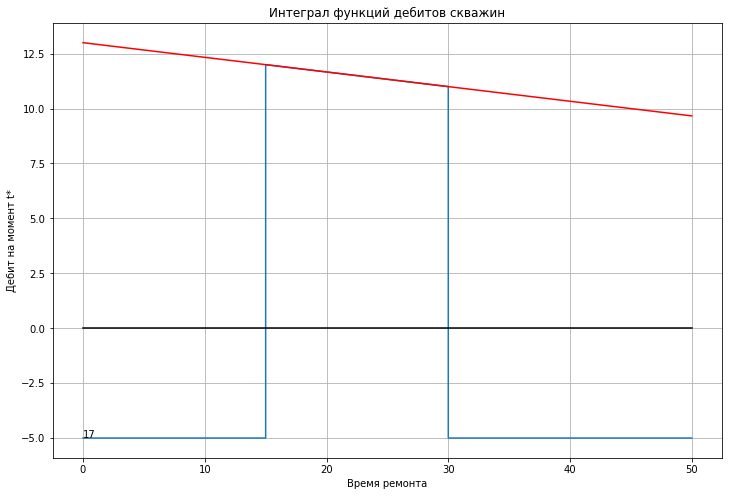

In [24]:
w=np.linspace(0,50,50) #множество возможных значений времени начала ремонта
plt.figure(figsize=(12,8))
        
#график интеграла функции дебита для каждой скважины
#for i in wsch.debit_functions.keys():
for i in np.array([17],dtype=int):
    x=[0,15,15,30,30,50]
    y=[-5,-5,12,11,-5,-5]
    z=[12-(t-15)/15 for t in w]
    #fun=wsch.debit_functions[i]
    #y=[wsch.f6(w,fun) for w in x]
    #q=repairs.loc[i,'дебит до']
    #qi=repairs.loc[i,'дебит после']
    
    #tau=repairs.loc[i,'t ремонта']
    #y=[qi*(t-tau)-(qi-q)*w for w in x]# интеграл функции дебита в зависимости от времени проведения ремонта
    plt.plot(x,y)
    plt.plot([0,50],[0,0],c='black')
    plt.plot(w,z,c='red')
    plt.title('Интеграл функций дебитов скважин')
    plt.xlabel('Время ремонта')
    plt.ylabel('Дебит на момент t*')
    if np.fmod(i,2)==0:
        plt.annotate(str(i),xy=(x[0],y[0]))
    else:
        plt.annotate(str(i),xy=(x[0],y[0]))
    #обозначение номера скважины, для которой построена интегральная функция
plt.grid(True)
#plt.savefig(path+'wells_debit.png')
plt.show()

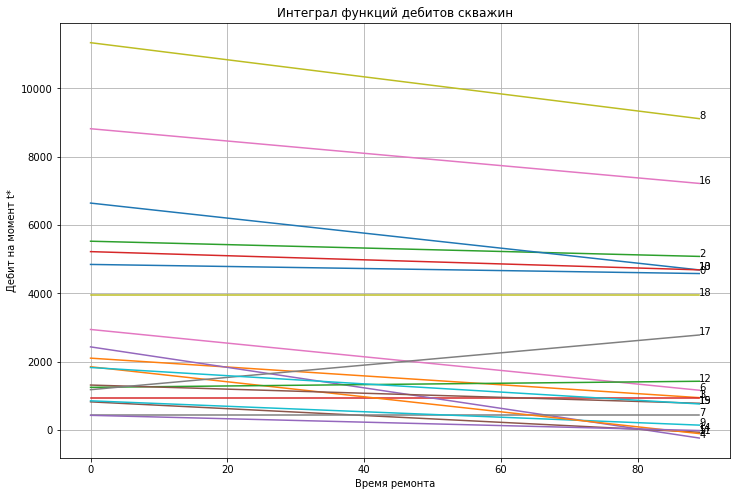

In [7]:
x=np.linspace(0,wsch.t,50) #множество возможных значений времени начала ремонта
plt.figure(figsize=(12,8))
#график интеграла функции дебита для каждой скважины
for i in wsch.debit_functions.keys():
#for i in np.array([17],dtype=int):
    y=[wsch.debit_functions[i].value(w) for w in x]
    #q=repairs.loc[i,'дебит до']
    #qi=repairs.loc[i,'дебит после']
    
    #tau=repairs.loc[i,'t ремонта']
    #y=[qi*(t-tau)-(qi-q)*w for w in x]# интеграл функции дебита в зависимости от времени проведения ремонта
    plt.plot(x,y)
    plt.title('Интеграл функций дебитов скважин')
    plt.xlabel('Время ремонта')
    plt.ylabel('Дебит на момент t*')
    if np.fmod(i,2)==0:
        plt.annotate(str(i),xy=(x[-1],y[-1]))
    else:
        plt.annotate(str(i),xy=(x[-1],y[-1]))
    #обозначение номера скважины, для которой построена интегральная функция
plt.grid(True)
#plt.savefig(path+'wells_debit.png')
plt.show()

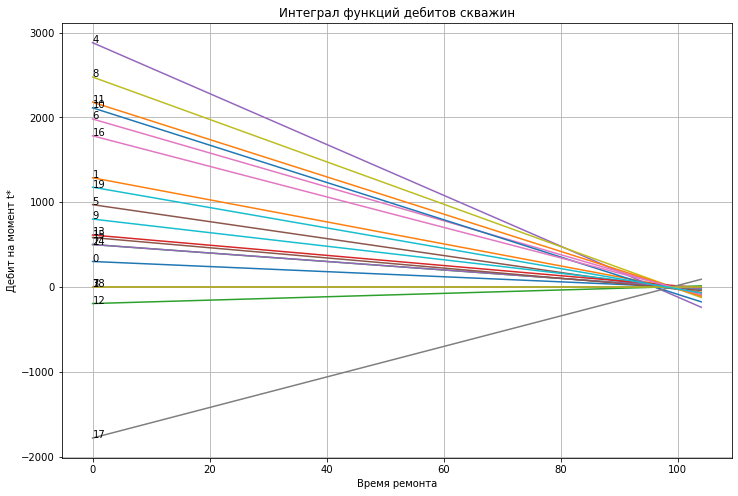

In [25]:
x=np.linspace(0,wsch.t,50) #множество возможных значений времени начала ремонта
plt.figure(figsize=(12,8))
#график интеграла функции дебита для каждой скважины
for i in wsch.debit_functions.keys():
#for i in np.array([17],dtype=int):
    fun=wsch.debit_functions[i]
    y=[wsch.f6(w,fun) for w in x]
    #q=repairs.loc[i,'дебит до']
    #qi=repairs.loc[i,'дебит после']
    
    #tau=repairs.loc[i,'t ремонта']
    #y=[qi*(t-tau)-(qi-q)*w for w in x]# интеграл функции дебита в зависимости от времени проведения ремонта
    plt.plot(x,y)
    plt.title('Интеграл функций дебитов скважин')
    plt.xlabel('Время ремонта')
    plt.ylabel('Дебит на момент t*')
    if np.fmod(i,2)==0:
        plt.annotate(str(i),xy=(x[0],y[0]))
    else:
        plt.annotate(str(i),xy=(x[0],y[0]))
    #обозначение номера скважины, для которой построена интегральная функция
plt.grid(True)
#plt.savefig(path+'wells_debit.png')
plt.show()

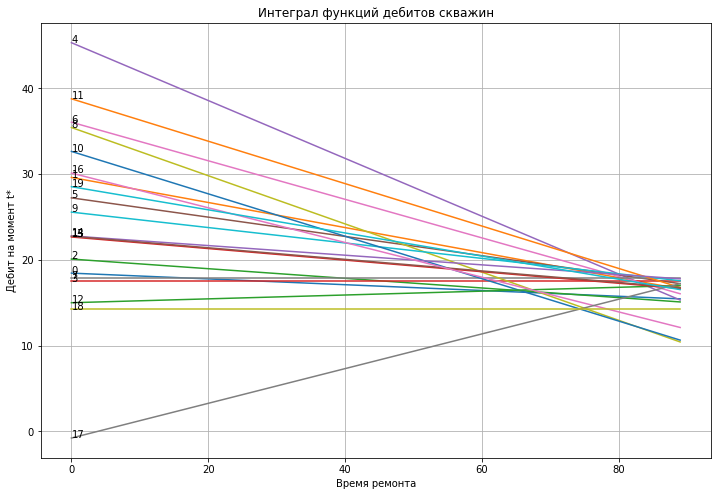

In [123]:
x=np.linspace(0,wsch.t,50) #множество возможных значений времени начала ремонта
plt.figure(figsize=(12,8))
#график интеграла функции дебита для каждой скважины
for i in wsch.debit_functions.keys():
#for i in np.array([17],dtype=int):
    fun=wsch.debit_functions[i]
    y=[wsch.f2(w,fun) for w in x]
    #q=repairs.loc[i,'дебит до']
    #qi=repairs.loc[i,'дебит после']
    
    #tau=repairs.loc[i,'t ремонта']
    #y=[qi*(t-tau)-(qi-q)*w for w in x]# интеграл функции дебита в зависимости от времени проведения ремонта
    plt.plot(x,y)
    plt.title('Интеграл функций дебитов скважин')
    plt.xlabel('Время ремонта')
    plt.ylabel('Дебит на момент t*')
    if np.fmod(i,2)==0:
        plt.annotate(str(i),xy=(x[0],y[0]))
    else:
        plt.annotate(str(i),xy=(x[0],y[0]))
    #обозначение номера скважины, для которой построена интегральная функция
plt.grid(True)
#plt.savefig(path+'wells_debit.png')
plt.show()

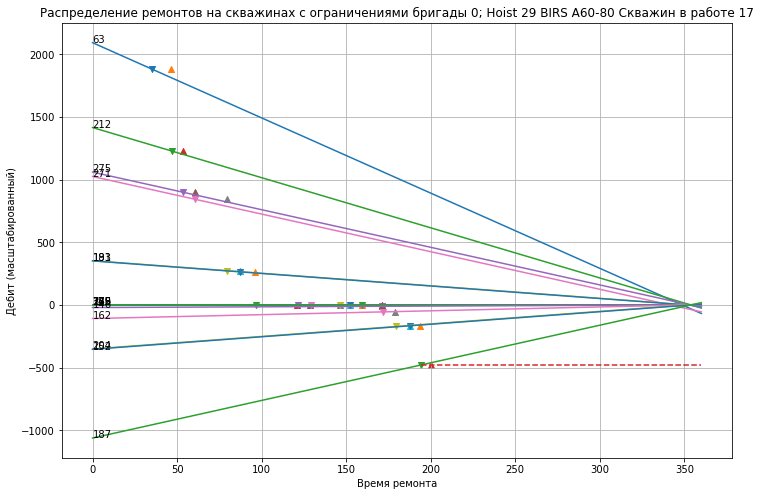

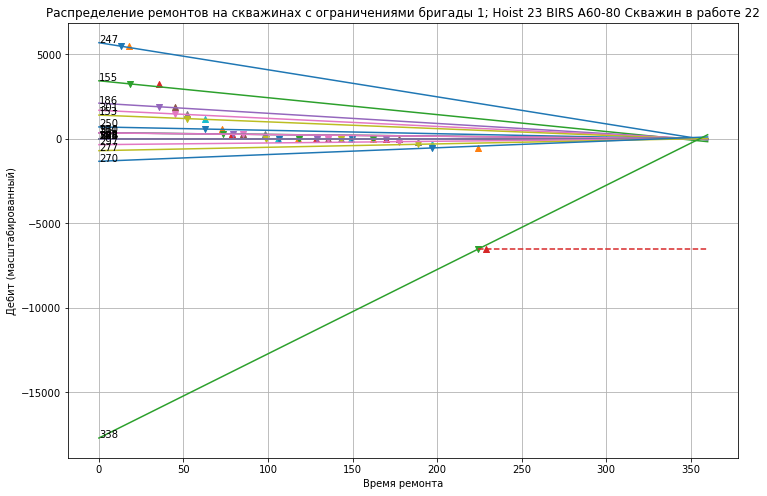

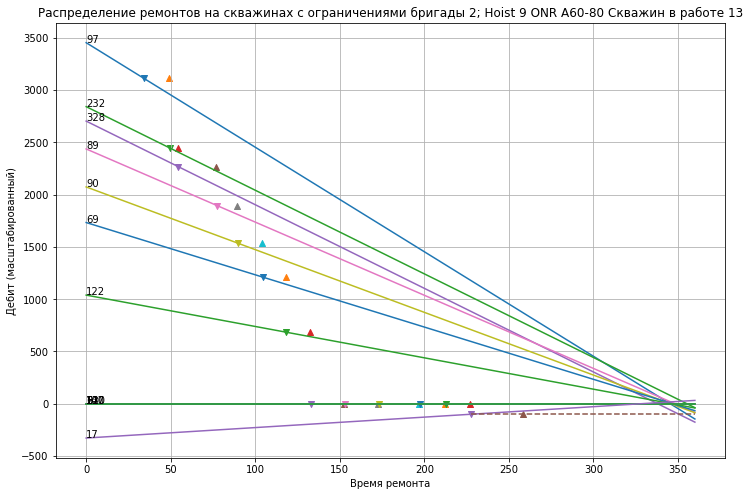

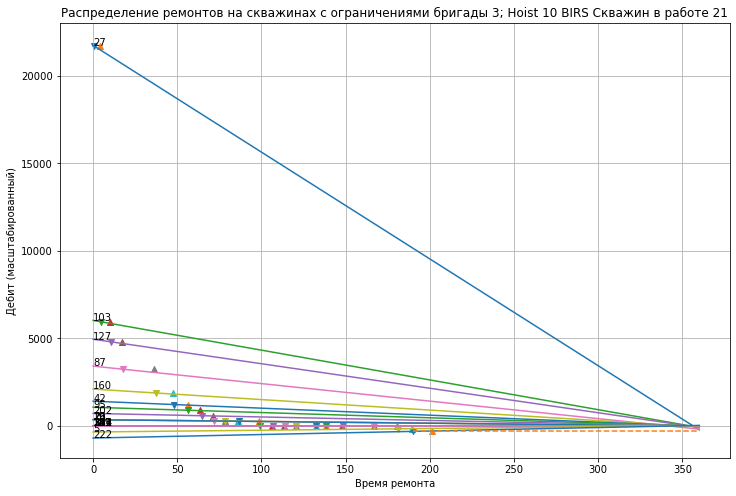

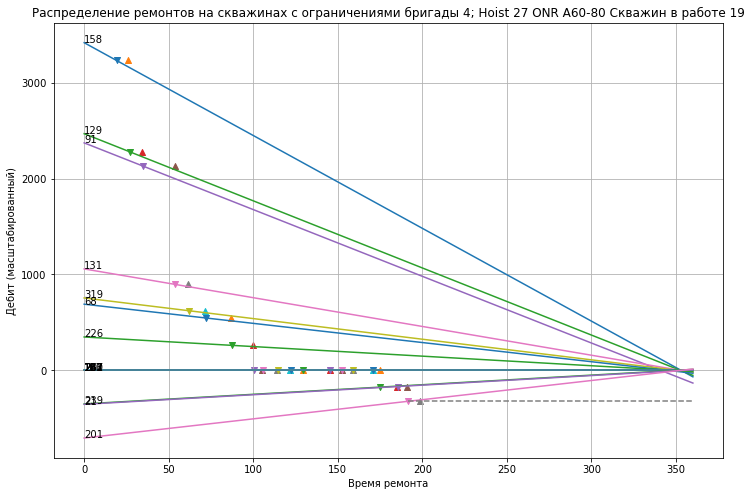

...

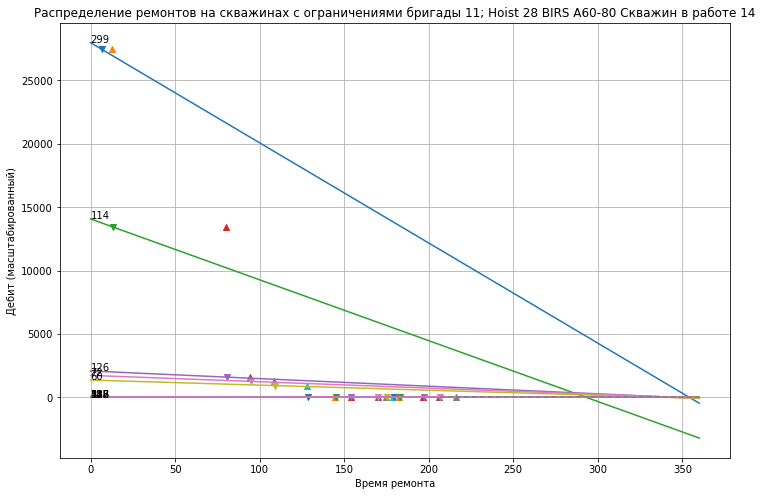

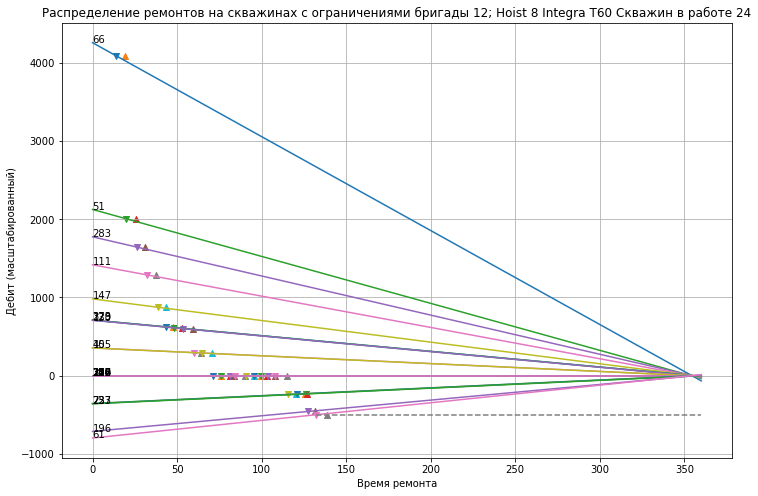

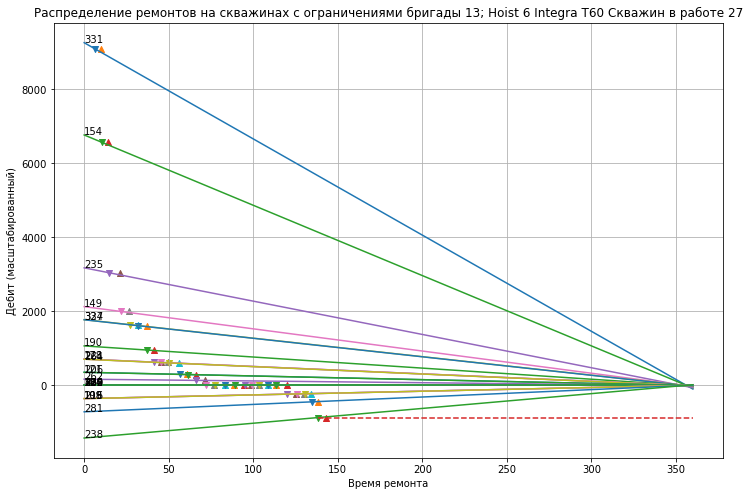

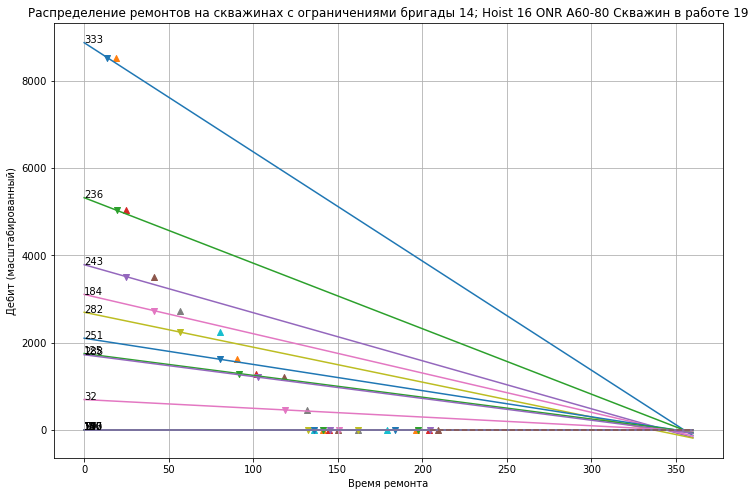

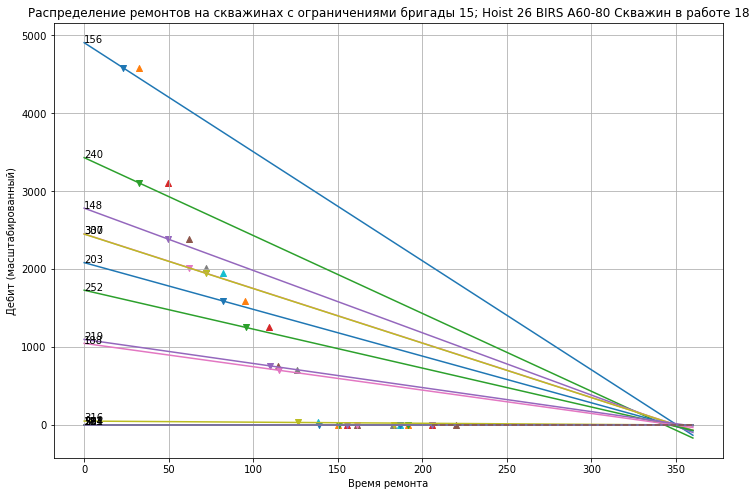

In [11]:
#R_=R
#=D
#T_=T
gamma=0.001
#k=1
#mask=~np.isnan(D[:,k])
for k in np.arange(R_.shape[1]):
    plt.figure(figsize=(12,8))
    mask=R_[:,k]>=0
    count=mask[mask==True].shape[0]
    
#график интеграла функции дебита для каждой скважины
    for s,i in enumerate(R_[:,k]):
        #if i<0: 
            #break
        if i>0:
            order=O[s,k]
            fun=wsch.debit_functions[i]
            x=fun.supp
            t1_=D_[s,k]
            t2_=T_[s,k]
            if s<R_.shape[0]-1:
                target=R_[s+1,k]
                if target<0:
                    t3_=np.inf
                    ts_=np.inf
                else:                               
                    t3_=D_[s+1,k]
                    ts_=ts1[R_[s,k],R_[s+1,k]]
            else:
                t3_=np.inf
                ts_=np.inf
            delta=osh.get_delta(t1_,t2_,t3_,ts=ts_,bound=wsch.debit_functions[R_[s,k]].supp[1])
            if delta<0:
                print(i,t1_,t2_,t3_,ts_,wsch.debit_functions[R_[s,k]].supp[1])        
            y=[(wsch.f6(w,fun)) for w in x]
            t1=[(wsch.f6(w,fun)) for w in [D_[:,k][s]] if ~np.isnan(w)]
            t2=[(wsch.f6(w,fun)) for w in [T_[:,k][s]] if ~np.isnan(w)]
            plt.plot(x,y)
            tilda=(wsch.f6(t1_,fun))
            plt.plot([t1_,t1_+delta],[tilda,tilda],linestyle='dashed')
            if len(t1)>0:
                plt.scatter(D_[:,k][s],t1,marker='v')
                plt.scatter(T_[:,k][s],t1,marker='^')
            plt.annotate(str(i),xy=(fun.supp[0],wsch.f6(fun.supp[0],fun)))
        
    #if np.fmod(i,2)==0:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    #else:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    name=group[k]
    gname=cdata['Начальное положение бригад на конец 2016 года '].iloc[name]
    plt.title('Распределение ремонтов на скважинах с ограничениями бригады '+str(k)+'; '+gname+' Скважин в работе '+str(count))
    plt.xlabel('Время ремонта')
    plt.ylabel('Дебит (масштабированный)')    #обозначение номера скважины, для которой построена интегральная функция
    plt.grid(True)
    plt.savefig(path+'distributions_group '+str(k)+'.png')
    plt.show()

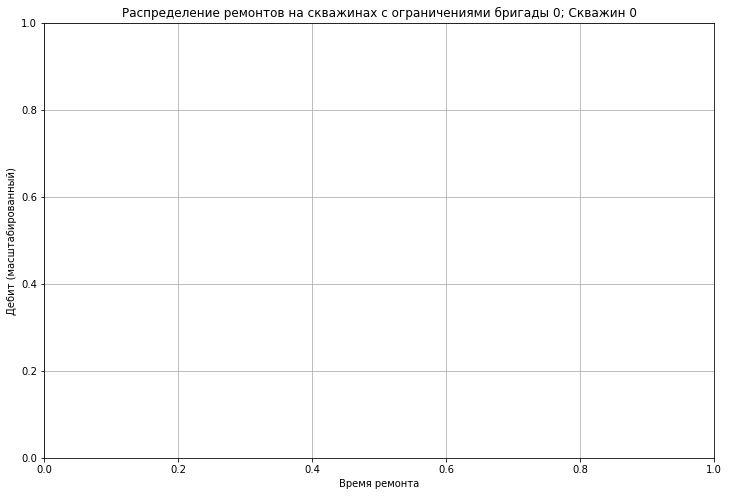

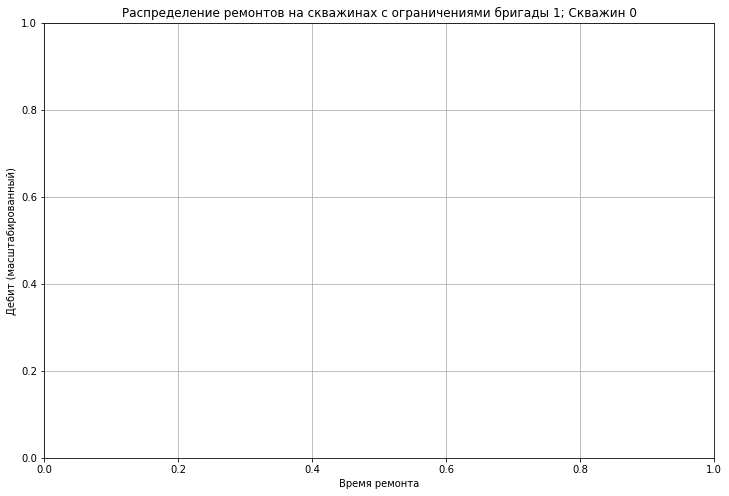

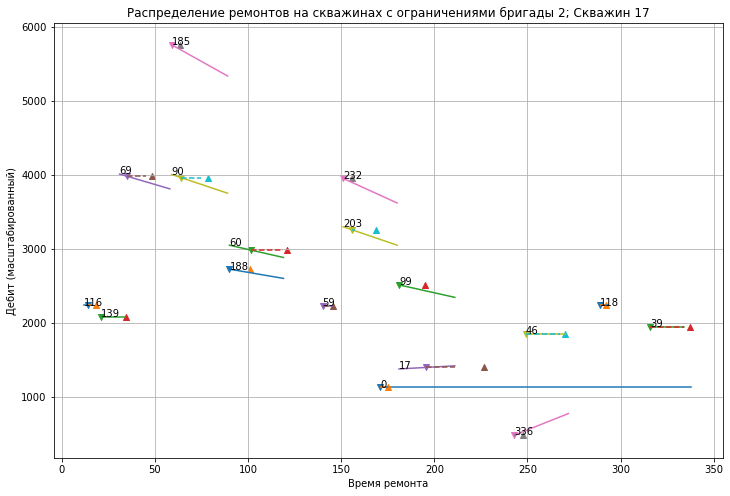

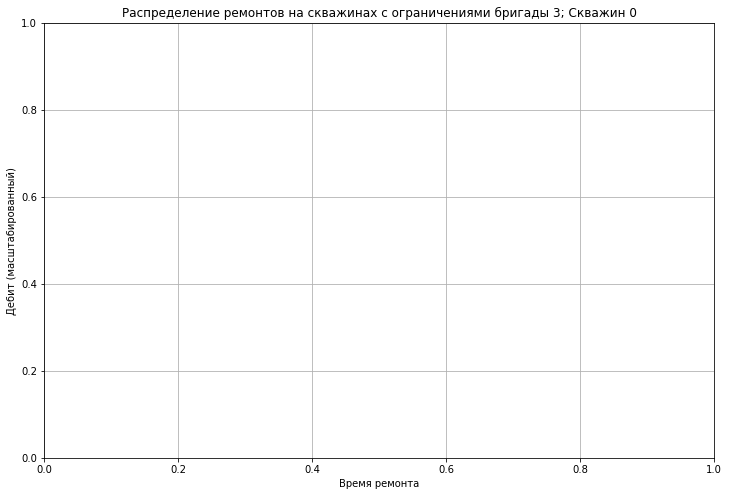

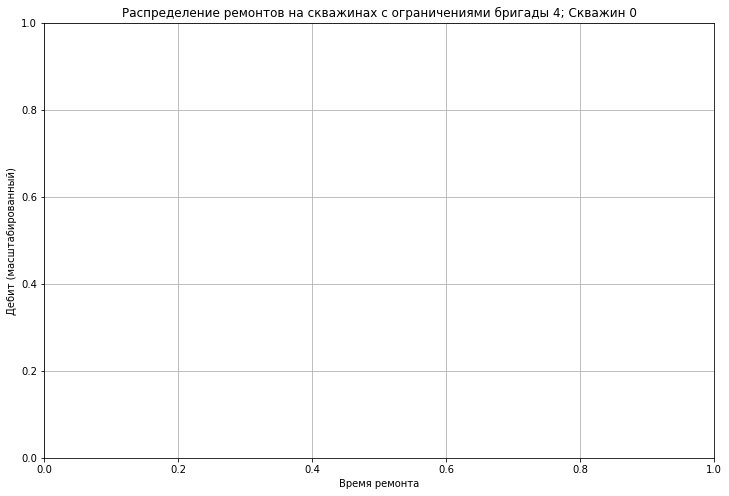

...

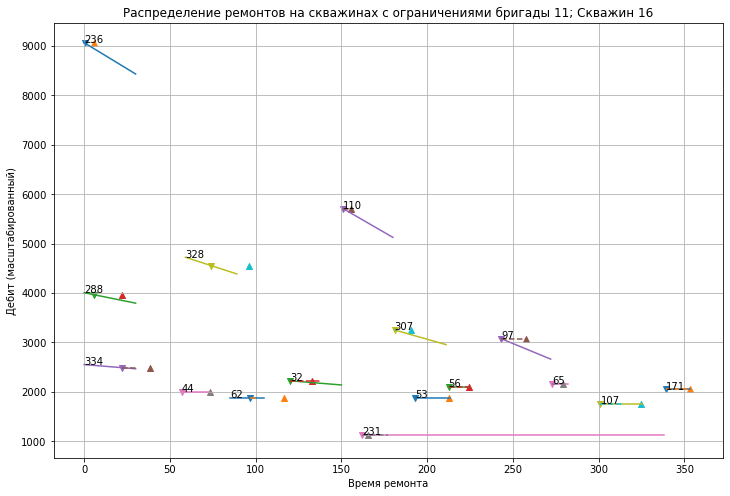

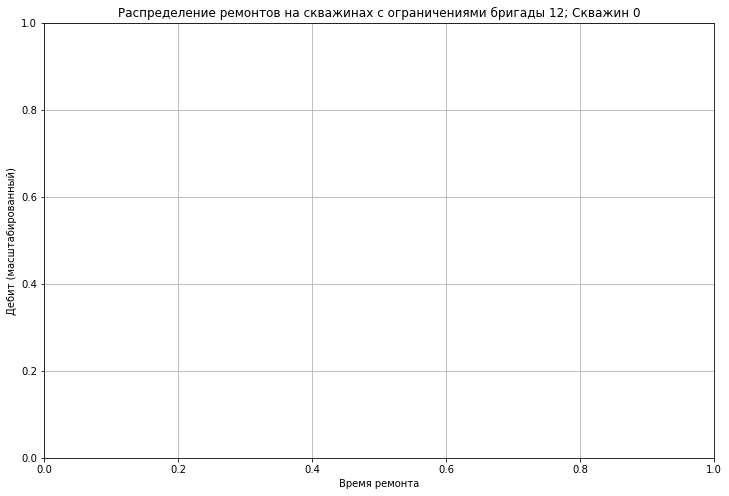

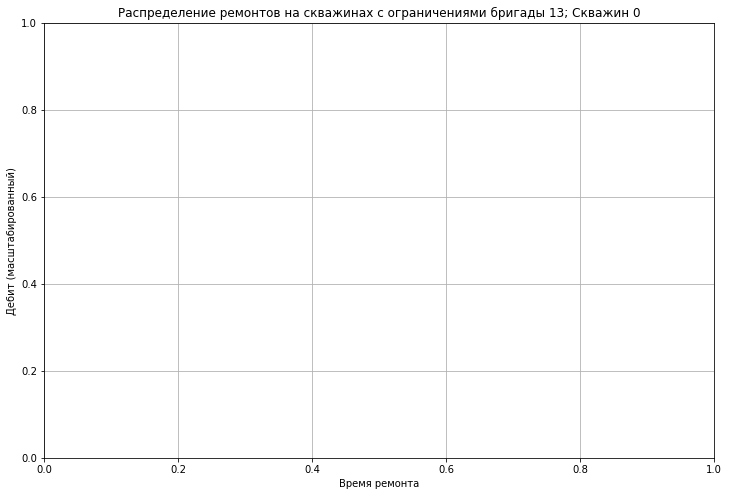

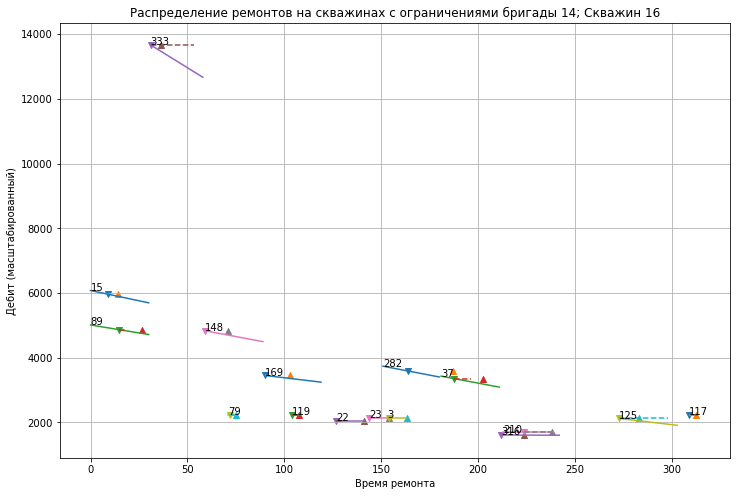

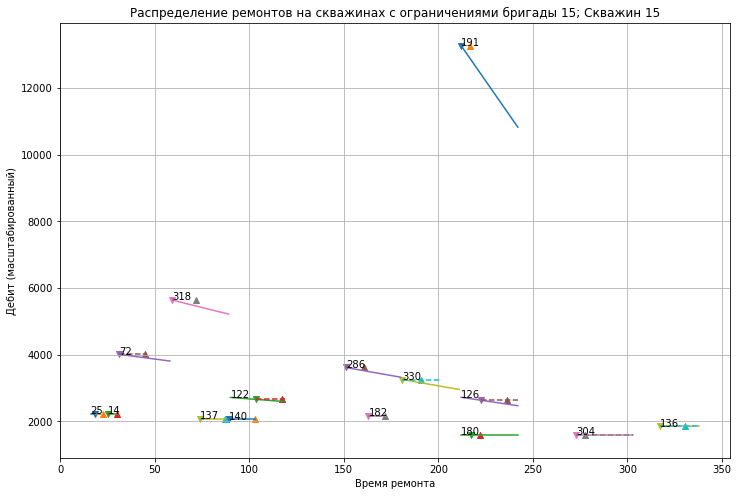

In [38]:
R_=R
D_=D
T_=T
gamma=0.001
#k=1
#mask=~np.isnan(D[:,k])
for k in np.arange(R_.shape[1]):
    plt.figure(figsize=(12,8))
    mask=R_[:,k]>=0
    count=mask[mask==True].shape[0]
#график интеграла функции дебита для каждой скважины
    for s,i in enumerate(R_[:,k]):
        if i<0: 
            break
        order=O[s,k]
        # order>0:
        wsch.update_queue(i,order)
        fun=wsch.debit_functions[i]
        x=fun.supp
        t1_=D_[s,k]
        t2_=T_[s,k]
        if s<R_.shape[0]-1:
            target=R_[s+1,k]
            if target<0:
                t3_=np.inf
                ts_=np.inf
            else:                               
                t3_=D_[s+1,k]
                ts_=ts1[R_[s,k],R_[s+1,k]]
        else:
            t3_=np.inf
            ts_=np.inf
        #if fun.cs:
        delta=osh.get_delta(t1_,t2_,t3_,ts=ts_,bound=wsch.debit_functions[R_[s,k]].supp[1])
        if delta<0:
            print(i,t1_,t2_,t3_,ts_,wsch.debit_functions[R_[s,k]].supp[1])
        
        y=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in x]
        t1=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in [D_[:,k][s]] if ~np.isnan(w)]
        t2=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in [T_[:,k][s]] if ~np.isnan(w)]
        plt.plot(x,y)
        tilda=(wsch.f6(t1_,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2))
        #print(tilda,i)
        plt.plot([t1_,t1_+delta],[tilda,tilda],linestyle='dashed')
        if len(t1)>0:
            plt.scatter(D_[:,k][s],t1,marker='v')
            plt.scatter(T_[:,k][s],t1,marker='^')
        plt.annotate(str(i),xy=(fun.supp[0],(wsch.f6(fun.supp[0],fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2))))
        
    #if np.fmod(i,2)==0:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    #else:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    plt.title('Распределение ремонтов на скважинах с ограничениями бригады '+str(k)+'; Скважин '+str(count))
    plt.xlabel('Время ремонта')
    plt.ylabel('Дебит (масштабированный)')    #обозначение номера скважины, для которой построена интегральная функция
    plt.grid(True)
    plt.savefig(path+'distributions_group '+str(k)+'.png')
    plt.show()

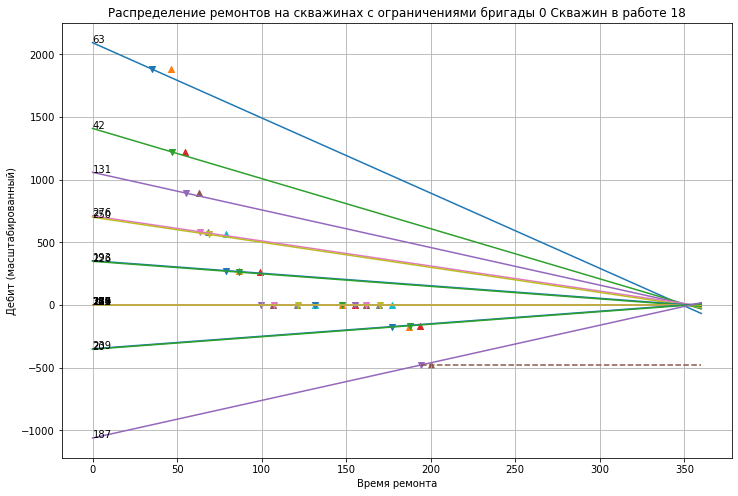

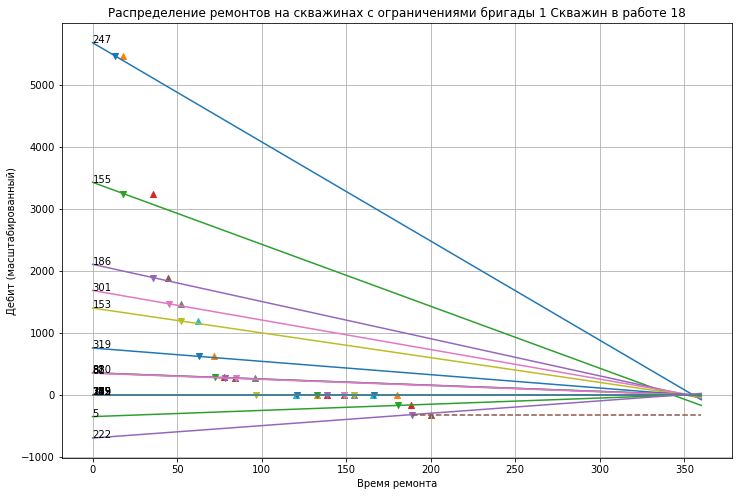

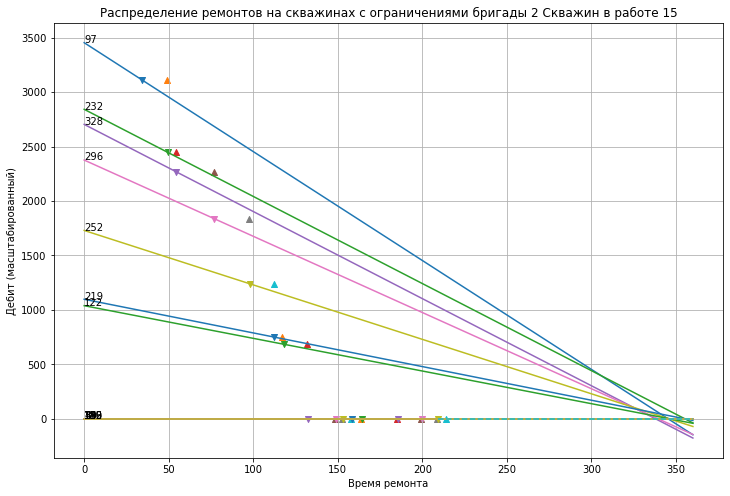

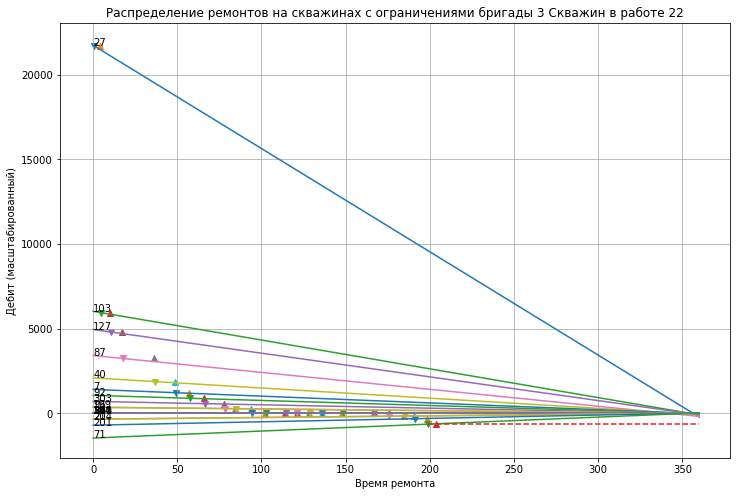

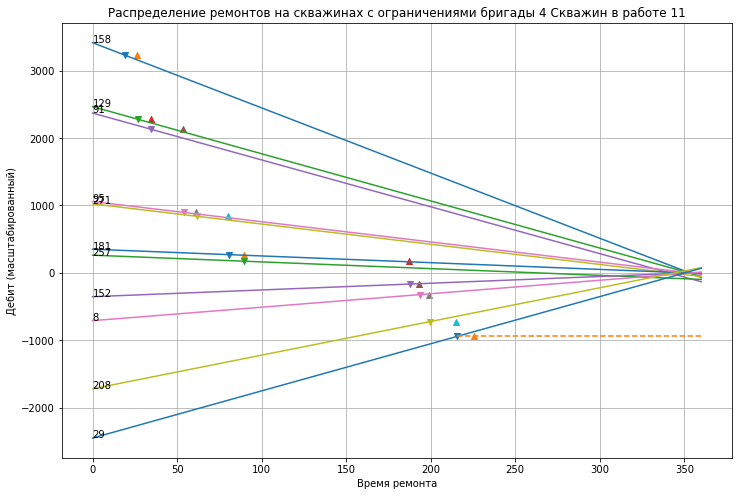

...

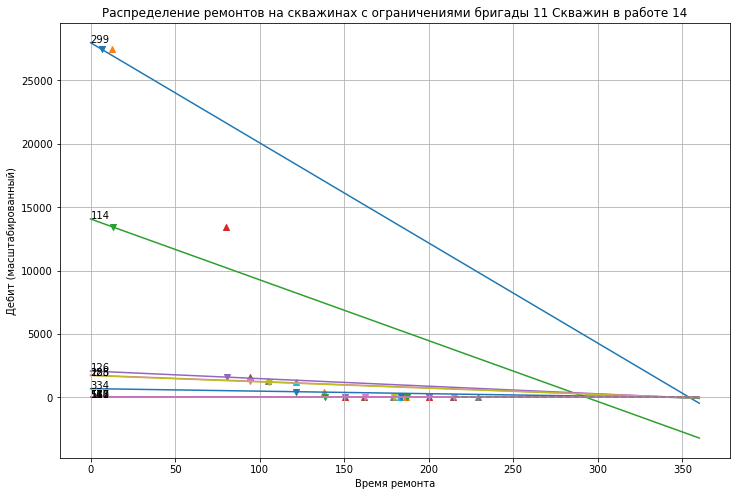

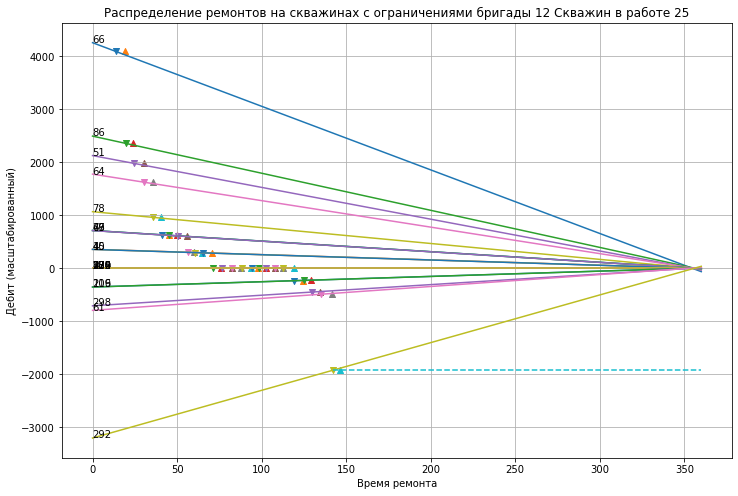

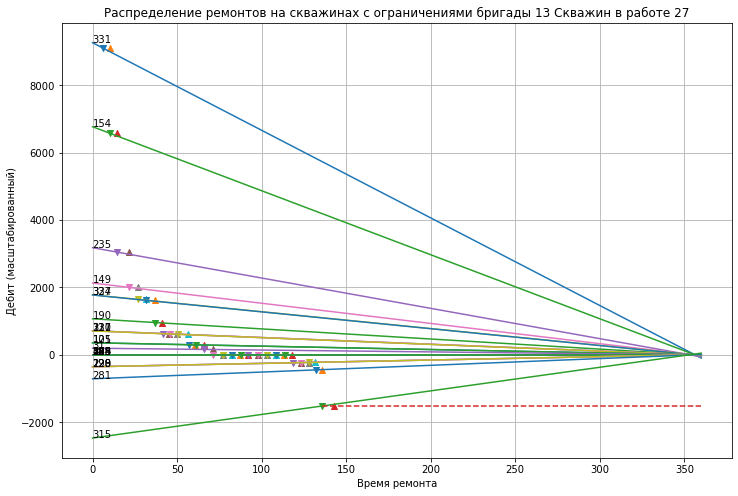

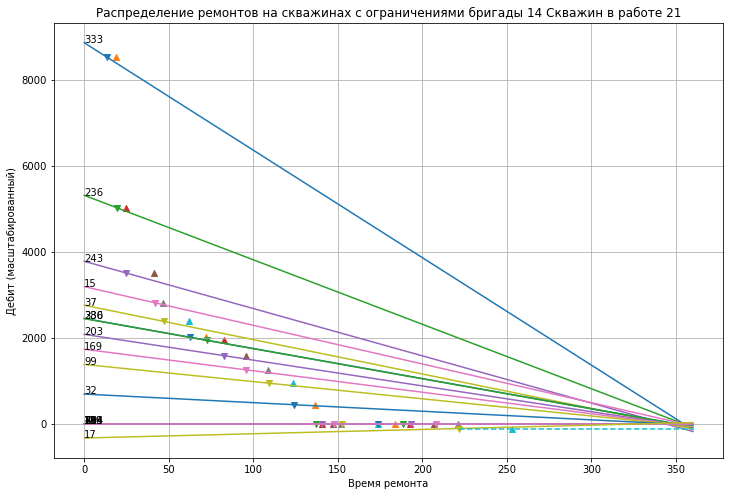

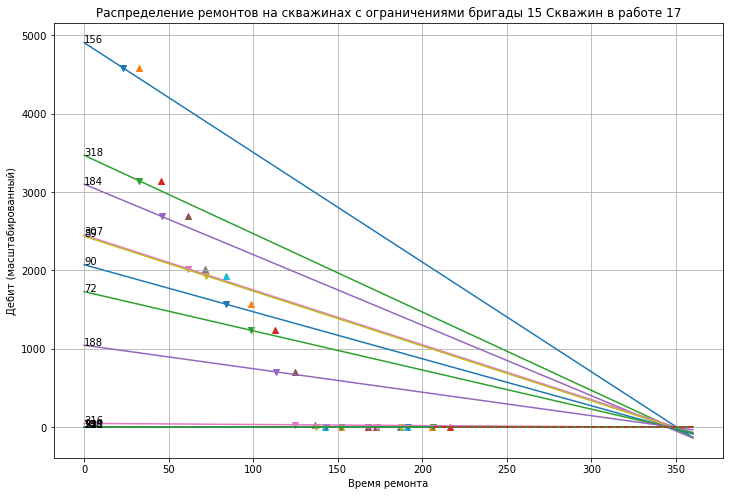

In [8]:
#R_=R
#=D
#T_=T
gamma=0.001
#k=1
#mask=~np.isnan(D[:,k])
for k in np.arange(R_.shape[1]):
    plt.figure(figsize=(12,8))
    mask=R_[:,k]>=0
    count=mask[mask==True].shape[0]
    
#график интеграла функции дебита для каждой скважины
    for s,i in enumerate(R_[:,k]):
        #if i<0: 
            #break
        if i>0:
            order=O[s,k]
            fun=wsch.debit_functions[i]
            x=fun.supp
            t1_=D_[s,k]
            t2_=T_[s,k]
            if s<R_.shape[0]-1:
                target=R_[s+1,k]
                if target<0:
                    t3_=np.inf
                    ts_=np.inf
                else:                               
                    t3_=D_[s+1,k]
                    ts_=ts1[R_[s,k],R_[s+1,k]]
            else:
                t3_=np.inf
                ts_=np.inf
            delta=osh.get_delta(t1_,t2_,t3_,ts=ts_,bound=wsch.debit_functions[R_[s,k]].supp[1])
            if delta<0:
                print(i,t1_,t2_,t3_,ts_,wsch.debit_functions[R_[s,k]].supp[1])        
            y=[(wsch.f6(w,fun)) for w in x]
            t1=[(wsch.f6(w,fun)) for w in [D_[:,k][s]] if ~np.isnan(w)]
            t2=[(wsch.f6(w,fun)) for w in [T_[:,k][s]] if ~np.isnan(w)]
            plt.plot(x,y)
            tilda=(wsch.f6(t1_,fun))
            plt.plot([t1_,t1_+delta],[tilda,tilda],linestyle='dashed')
            if len(t1)>0:
                plt.scatter(D_[:,k][s],t1,marker='v')
                plt.scatter(T_[:,k][s],t1,marker='^')
            plt.annotate(str(i),xy=(fun.supp[0],wsch.f6(fun.supp[0],fun)))
        
    #if np.fmod(i,2)==0:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    #else:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    plt.title('Распределение ремонтов на скважинах с ограничениями бригады '+str(k)+' Скважин в работе '+str(count))
    plt.xlabel('Время ремонта')
    plt.ylabel('Дебит (масштабированный)')    #обозначение номера скважины, для которой построена интегральная функция
    plt.grid(True)
    plt.savefig(path+'distributions_group '+str(k)+'.png')
    plt.show()

In [58]:
group=np.load(path+'task\\groups.npy')

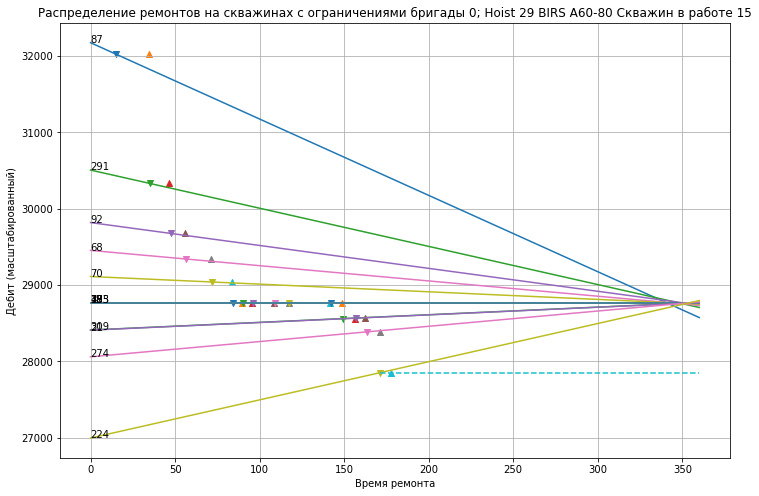

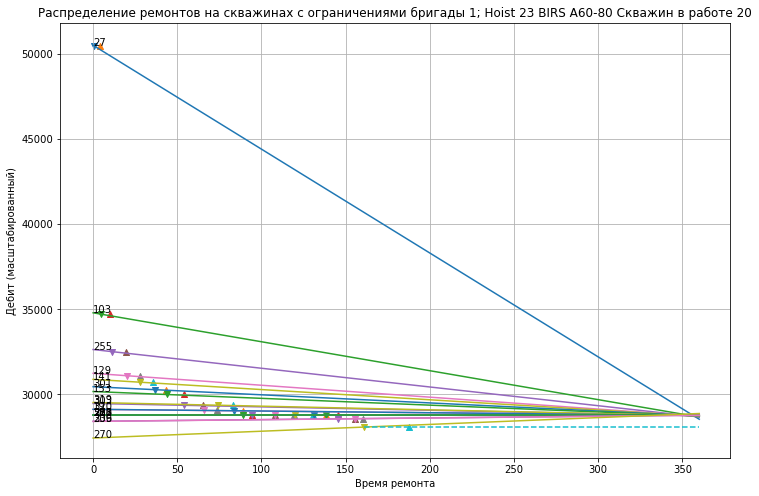

112 18.854000091552734 25.937000274658203 21.0 0.25 360.0


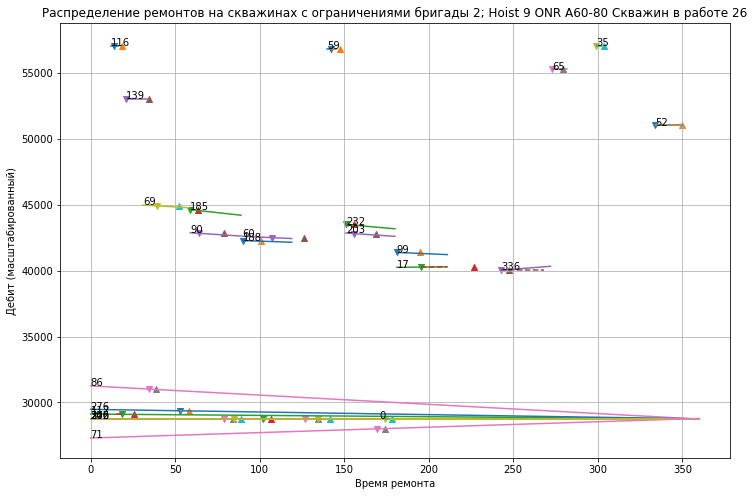

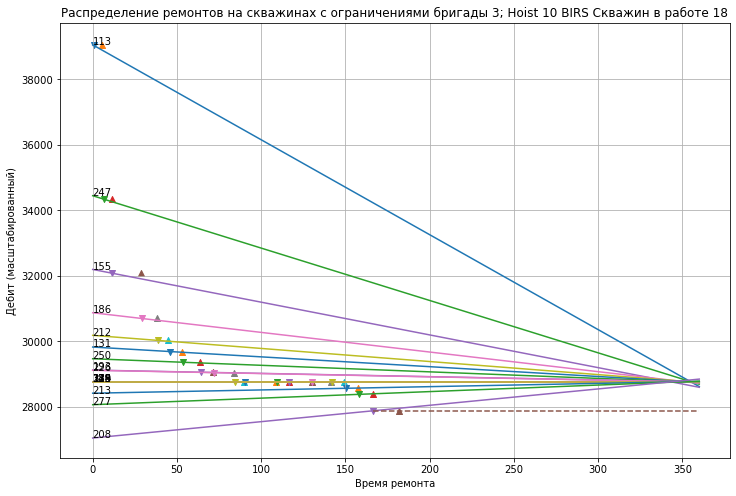

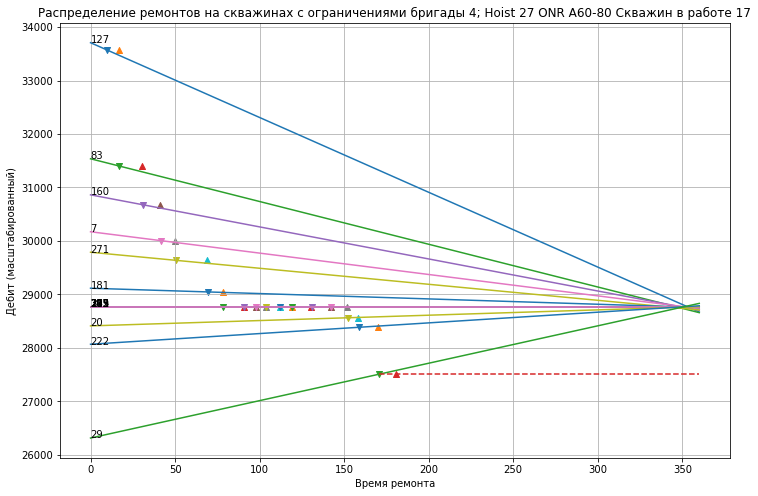

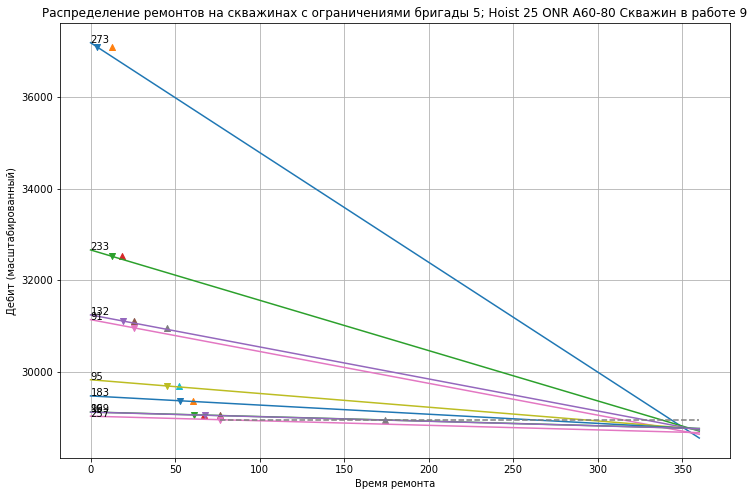

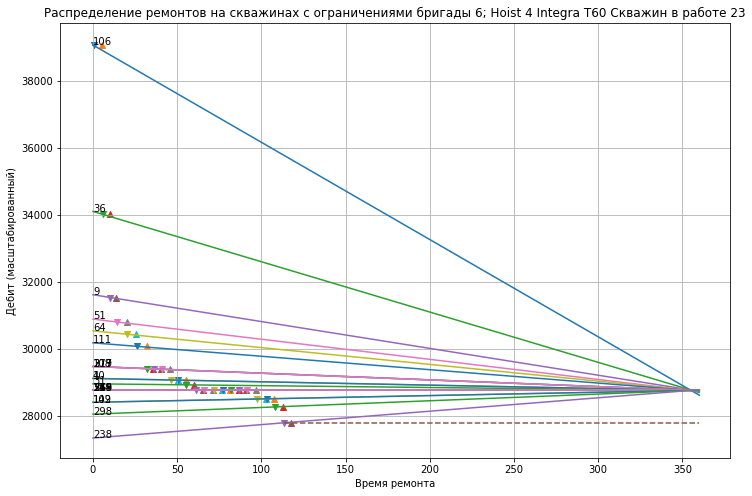

...

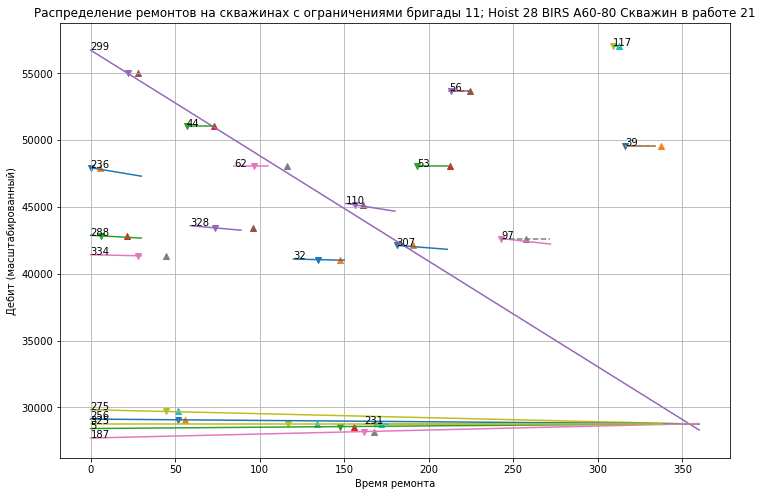

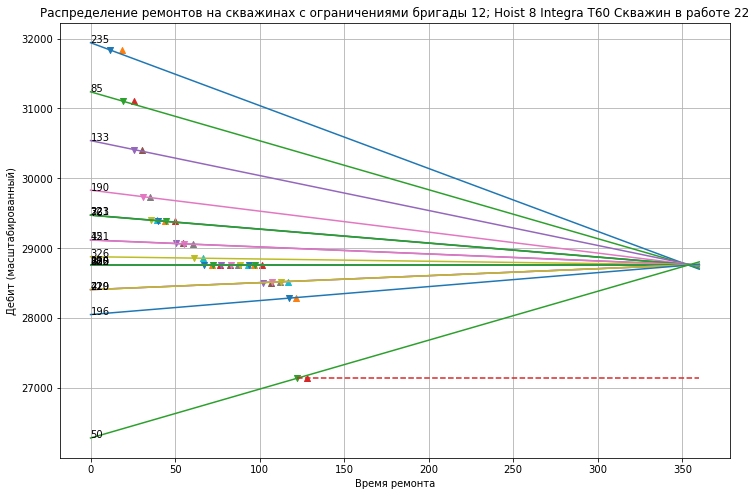

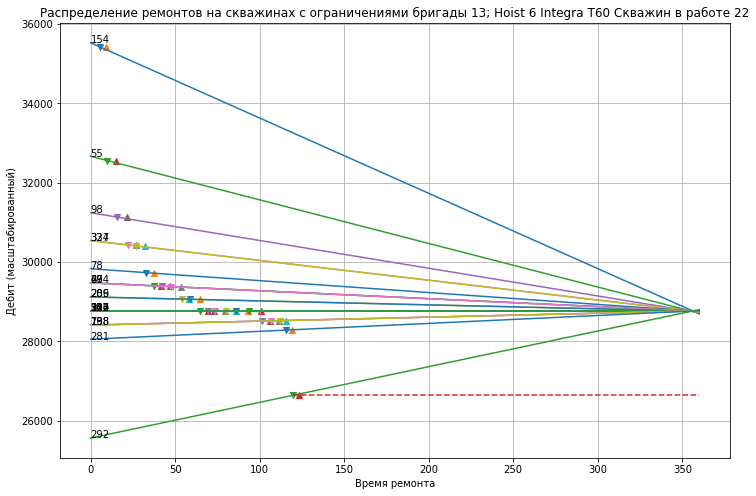

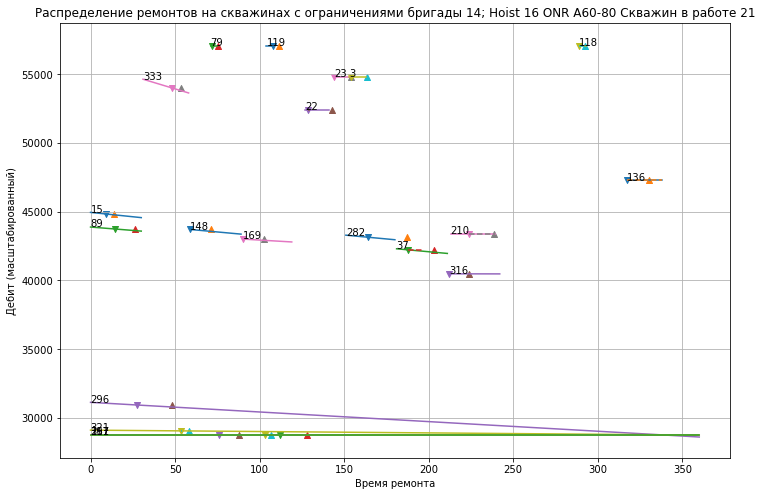

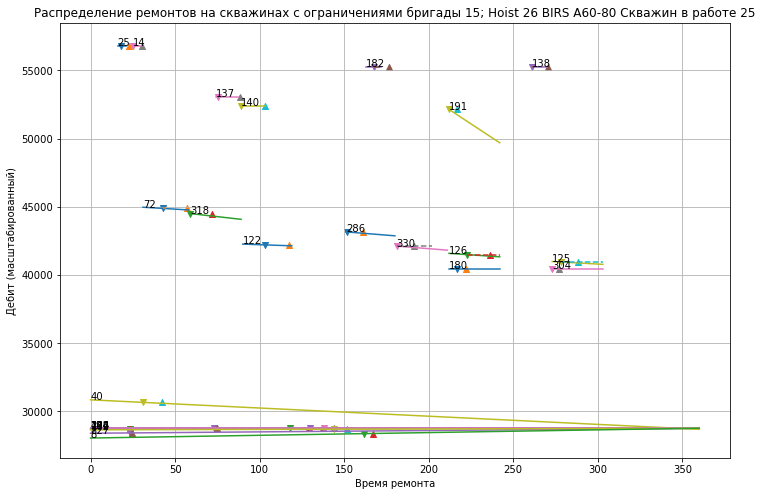

In [59]:
gamma=0.001
#k=1
#mask=~np.isnan(D[:,k])
for k in np.arange(R_.shape[1]):
    plt.figure(figsize=(12,8))
    mask=R_[:,k]>=0
    count=mask[mask==True].shape[0]
#график интеграла функции дебита для каждой скважины
    for s,i in enumerate(R_[:,k]):
        if i<0: 
            break
        fun=wsch.debit_functions[i]
        x=fun.supp
        t1_=D_[s,k]
        t2_=T_[s,k]
        if s<R_.shape[0]-1:
            target=R_[s+1,k]
            if target<0:
                t3_=np.inf
                ts_=np.inf
            else:                               
                t3_=D_[s+1,k]
                ts_=ts1[R_[s,k],R_[s+1,k]]
        else:
            t3_=np.inf
            ts_=np.inf
        #if fun.cs:
        delta=osh.get_delta(t1_,t2_,t3_,ts=ts_,bound=wsch.debit_functions[R_[s,k]].supp[1])
        if delta<0:
            print(i,t1_,t2_,t3_,ts_,wsch.debit_functions[R_[s,k]].supp[1])
        
        y=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in x]
        t1=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in [D_[:,k][s]] if ~np.isnan(w)]
        t2=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in [T_[:,k][s]] if ~np.isnan(w)]
        plt.plot(x,y)
        tilda=(wsch.f6(t1_,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2))
        #print(tilda,i)
        plt.plot([t1_,t1_+delta],[tilda,tilda],linestyle='dashed')
        if len(t1)>0:
            plt.scatter(D_[:,k][s],t1,marker='v')
            plt.scatter(T_[:,k][s],t1,marker='^')
        plt.annotate(str(i),xy=(fun.supp[0],(wsch.f6(fun.supp[0],fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2))))

    #if np.fmod(i,2)==0:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    #else:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    name=group[k]
    gname=cdata['Начальное положение бригад на конец 2016 года '].iloc[name]
    plt.title('Распределение ремонтов на скважинах с ограничениями бригады '+str(k)+'; '+gname+' Скважин в работе '+str(count))
    plt.xlabel('Время ремонта')
    plt.ylabel('Дебит (масштабированный)')    #обозначение номера скважины, для которой построена интегральная функция
    plt.grid(True)
    plt.savefig(path+'distributions_group '+str(k)+'.png')
    plt.show()

In [ ]:
i=2
osh.get_delta(D[i,0],T[i,0],D[i+1,0],ts=ts1[R[i,0],R[i+1,0]],bound=wsch.debit_functions[R[i,0]].supp[1])

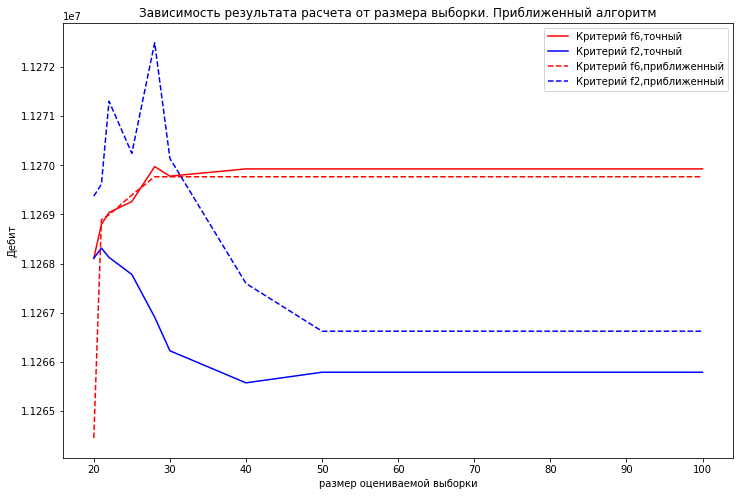

In [109]:
plt.figure(figsize=(12,8))
leg1,=plt.plot(y[:10],s[:10],c='red')
leg2,=plt.plot(y[:10],s1[:10],c='blue')
linestyle='--'
leg3,=plt.plot(y[:10],s_[:10],c='red',linestyle=linestyle)
leg4,=plt.plot(y[:10],s1_[:10],c='blue',linestyle=linestyle)
plt.legend([leg1,leg2,leg3,leg4],['Критерий f6,точный','Критерий f2,точный','Критерий f6,приближенный','Критерий f2,приближенный'])
plt.xlabel('размер оцениваемой выборки')
plt.ylabel('Дебит')
plt.title('Зависимость результата расчета от размера выборки. Приближенный алгоритм')
plt.show()

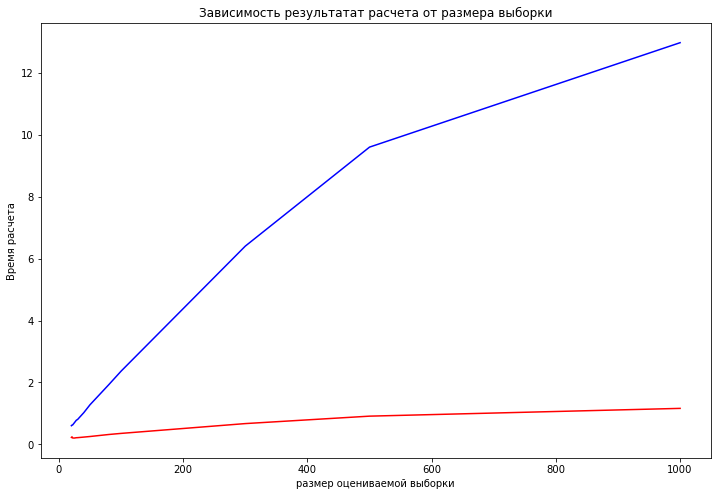

In [17]:
plt.figure(figsize=(12,8))
plt.plot(y,x,color='red')
plt.plot(y,x1,color='blue')
plt.xlabel('размер оцениваемой выборки')
plt.ylabel('Время расчета')
plt.title('Зависимость результатат расчета от размера выборки')
plt.show()

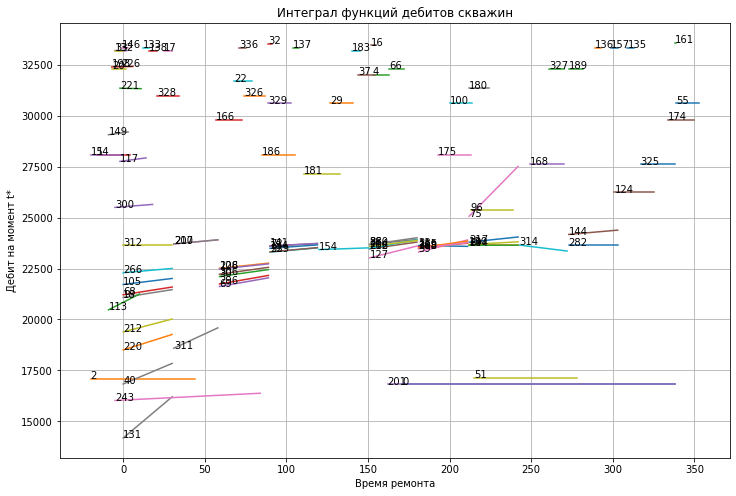

In [75]:
#x=np.linspace(0,wsch.t,500) #множество возможных значений времени начала ремонта
plt.figure(figsize=(12,8))
gamma=0.001
#график интеграла функции дебита для каждой скважины
for i in wsch.debit_functions.keys():
    
#for i in np.array([17],dtype=int):
    fun=wsch.debit_functions[i]
    if fun.cs:
        x=fun.supp
        y=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in x]
        plt.plot(x,y)    
        plt.annotate(str(i),xy=(x[0],y[0]))

plt.title('Интеграл функций дебитов скважин')
plt.xlabel('Время ремонта')
plt.ylabel('Дебит на момент t*')    #обозначение номера скважины, для которой построена интегральная функция
plt.grid(True)
#plt.savefig(path+'wells_debit.png')
plt.show()

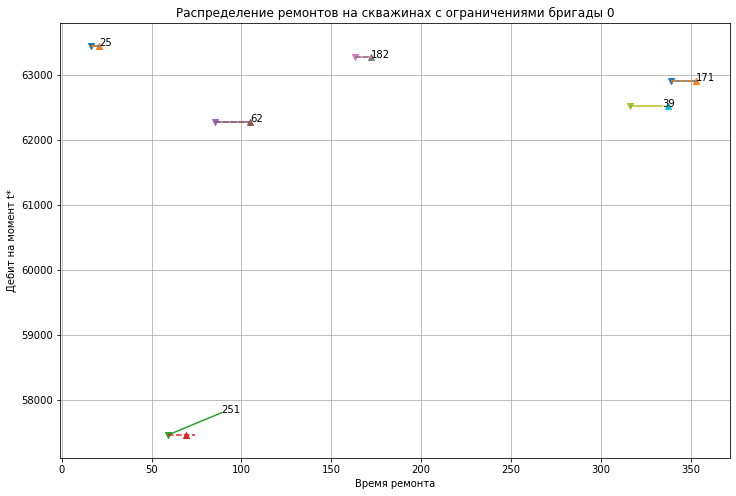

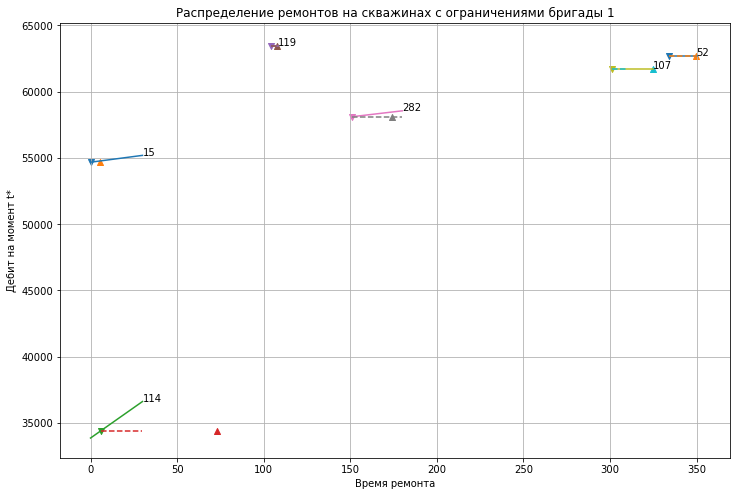

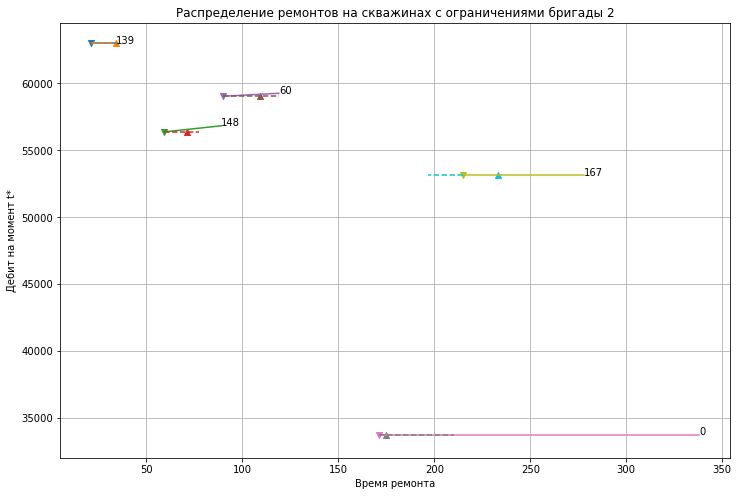

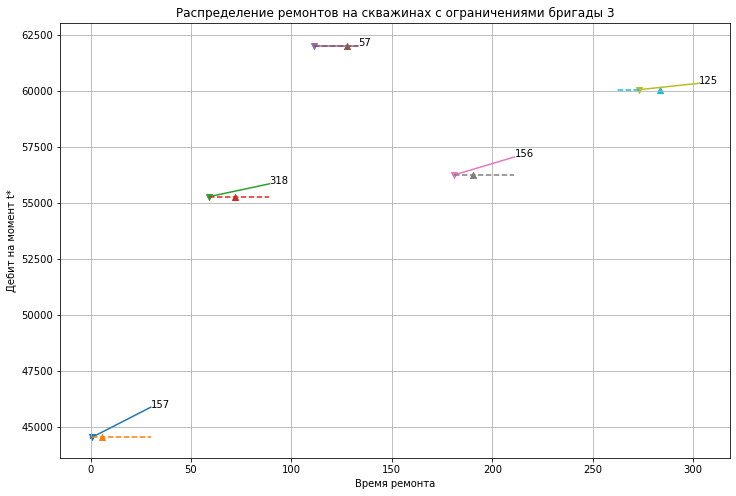

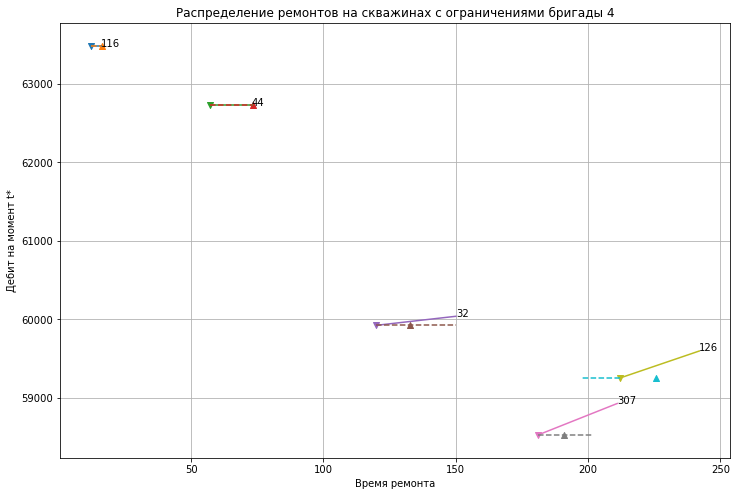

...

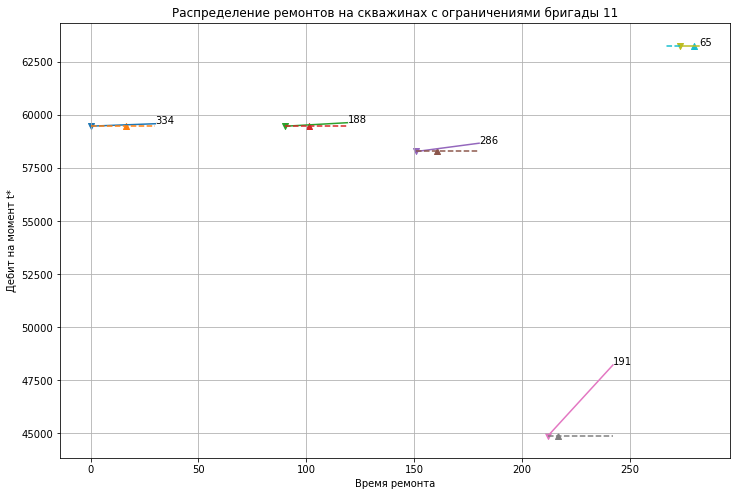

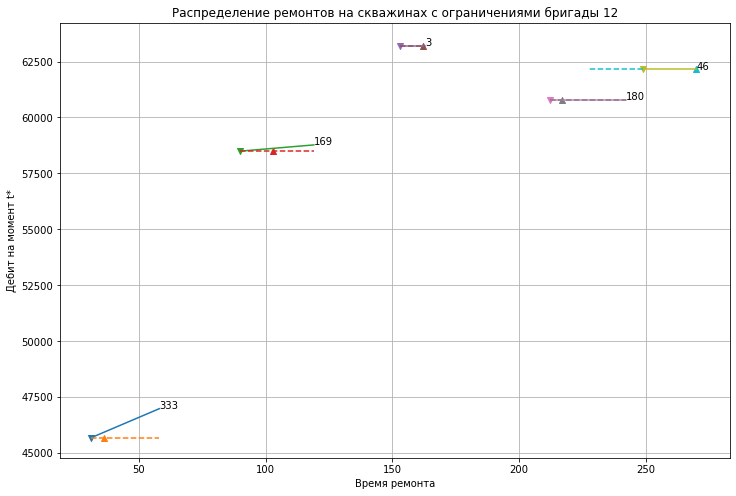

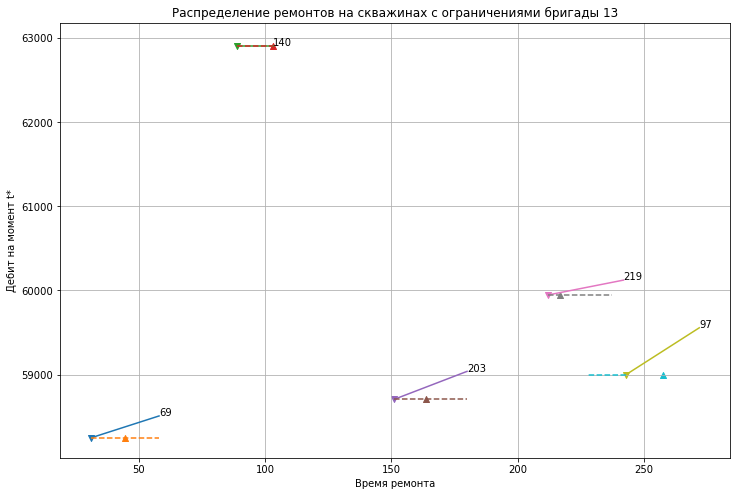

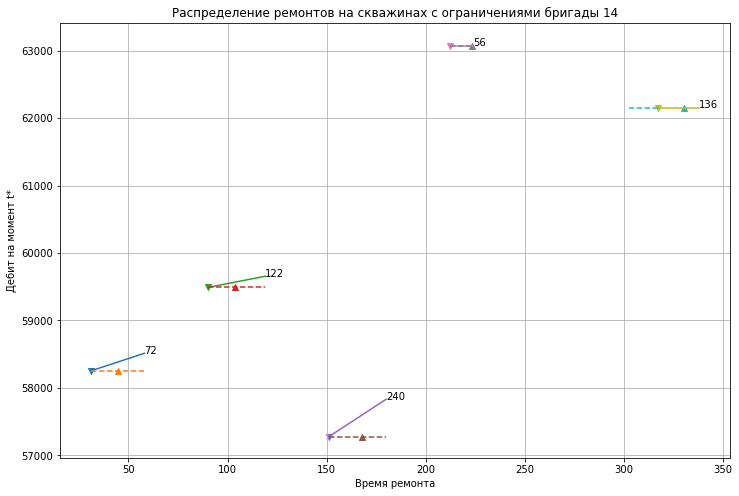

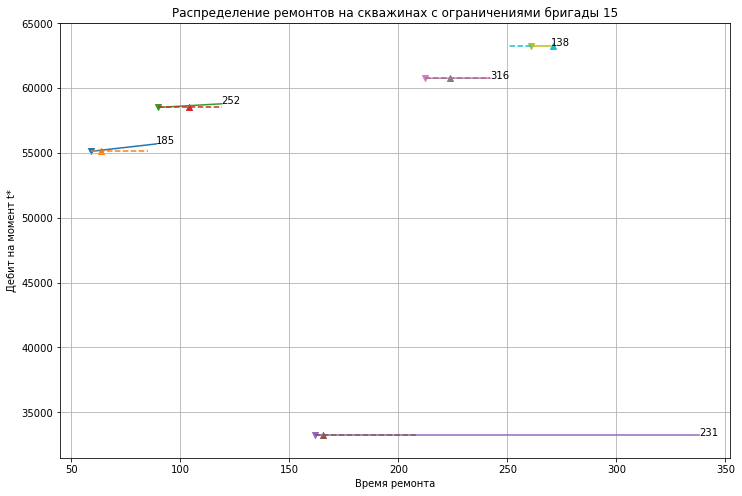

In [198]:
gamma=0.0001
#k=1
#mask=~np.isnan(D[:,k])
for k in np.arange(R.shape[1]):
    plt.figure(figsize=(12,8))
#график интеграла функции дебита для каждой скважины
    for s,i in enumerate(R[:,k]):
        if i<0: 
            break
        fun=wsch.debit_functions[i]
        x=fun.supp
        t1_=D[s,k]
        t2_=T[s,k]
        if s<R.shape[0]-1:
            t3_=D[s+1,k]
            ts_=ts1[R[s,k],R[s+1,k]]
        else:
            t3_=np.inf
            ts_=np.inf
        #if fun.cs:
        delta=osh.get_delta(t1_,t2_,t3_,ts=ts_,bound=wsch.debit_functions[R[s,k]].supp[1])
        
        y=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in x]
        t1=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in [D[:,k][s]] if ~np.isnan(w)]
        t2=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in [T[:,k][s]] if ~np.isnan(w)]
        plt.plot(x,y)
        tilda=(wsch.f6(t1_,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2))
        plt.plot([t1_,t1_+delta],[tilda,tilda],linestyle='dashed')
        if len(t1)>0:
            plt.scatter(D[:,k][s],t1,marker='v')
            plt.scatter(T[:,k][s],t1,marker='^')
        plt.annotate(str(i),xy=(fun.supp[1],(wsch.f6(fun.supp[1],fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2))))

    #if np.fmod(i,2)==0:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    #else:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    plt.title('Распределение ремонтов на скважинах с ограничениями бригады '+str(k))
    plt.xlabel('Время ремонта')
    plt.ylabel('Дебит на момент t*')    #обозначение номера скважины, для которой построена интегральная функция
    plt.grid(True)
#plt.savefig(path+'wells_debit.png')
    plt.show()

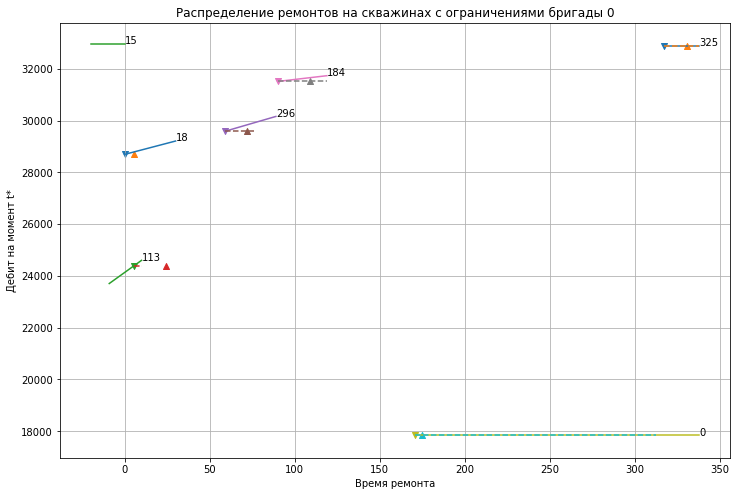

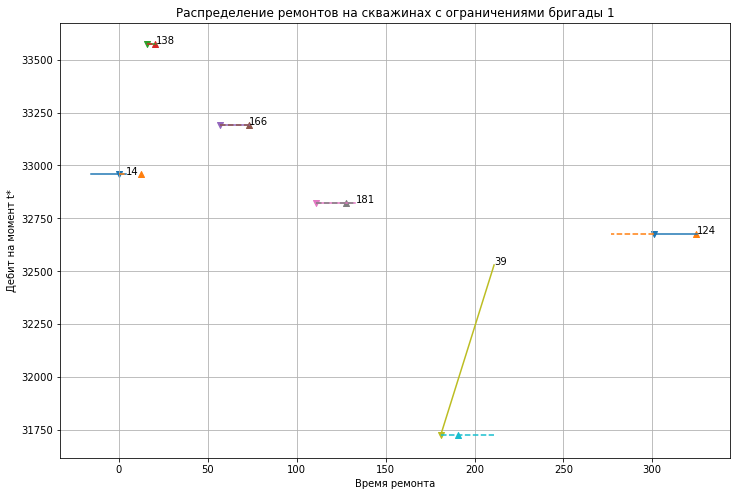

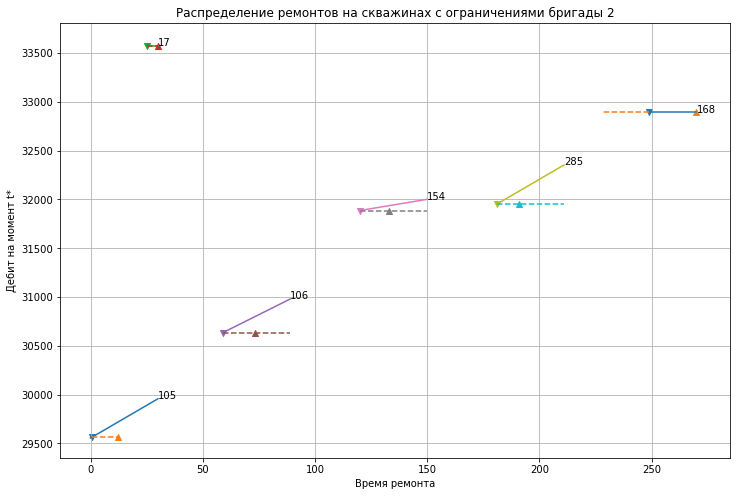

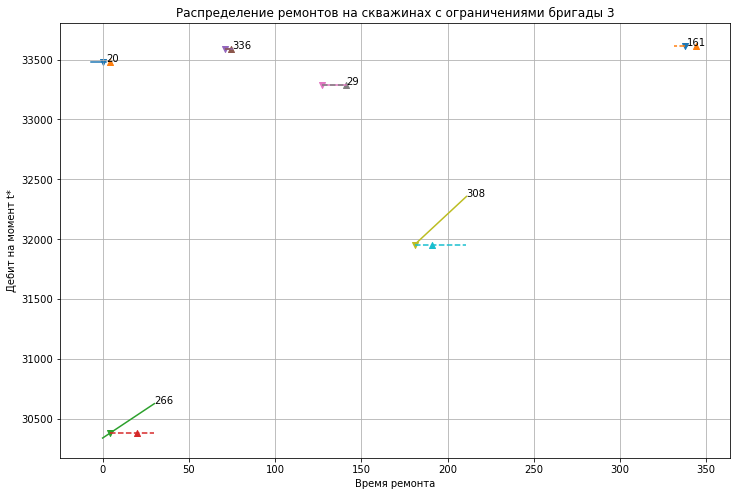

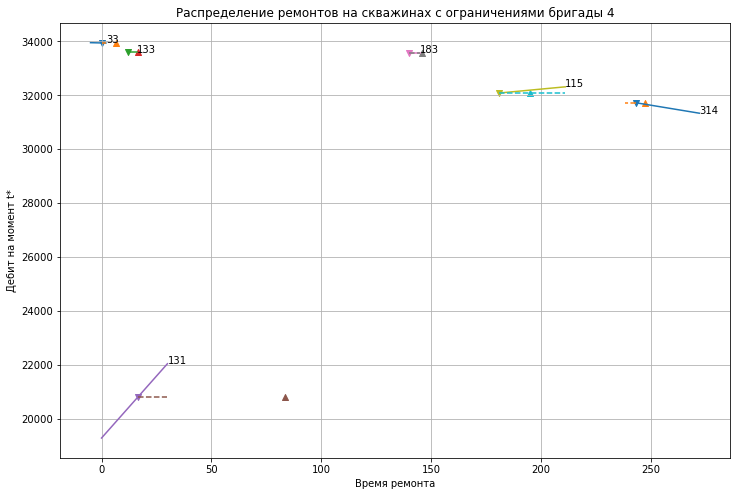

...

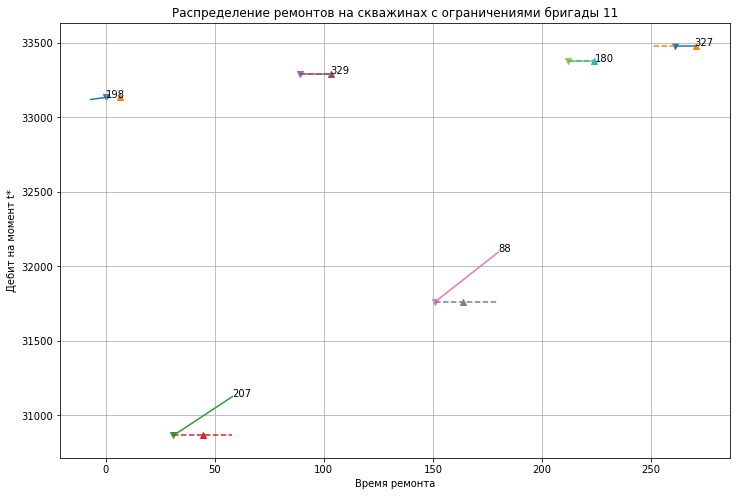

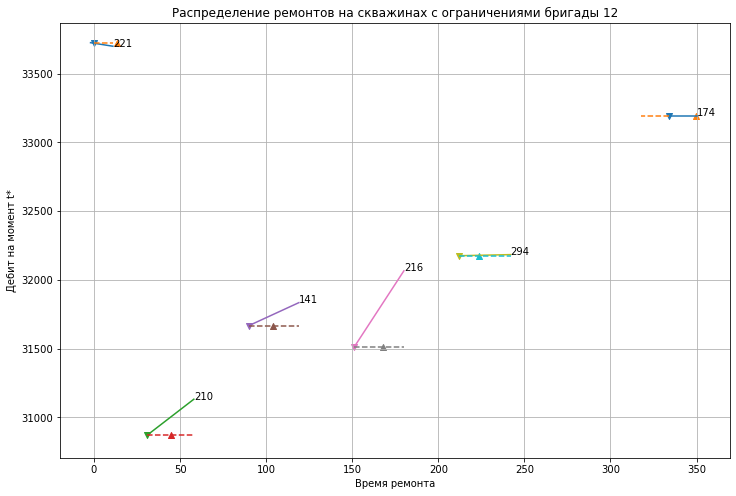

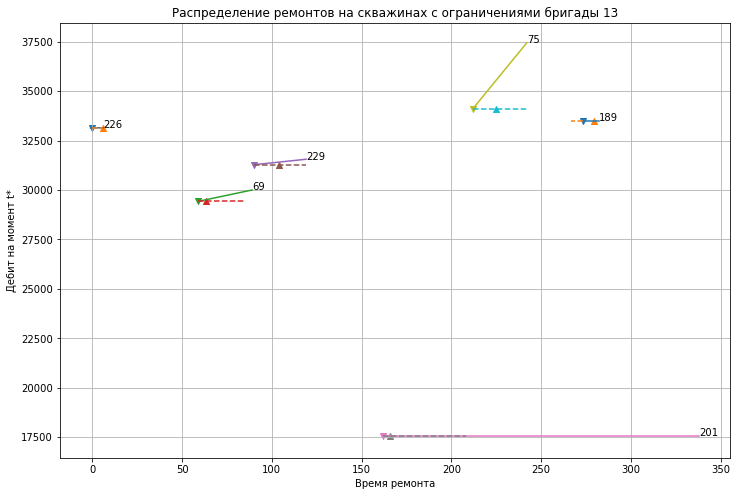

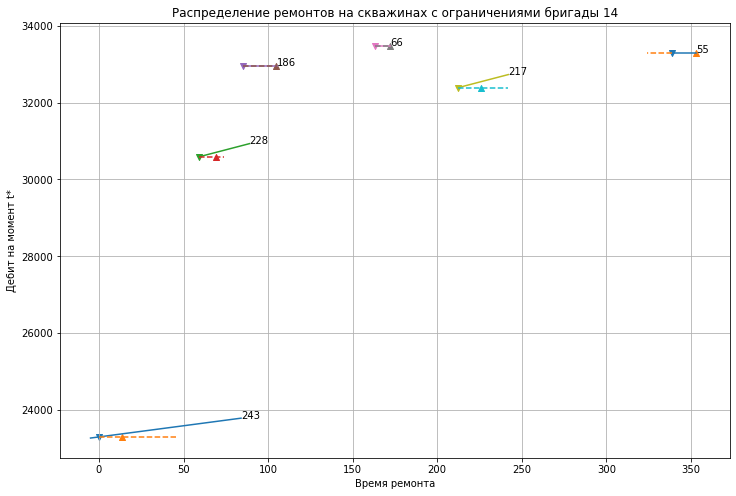

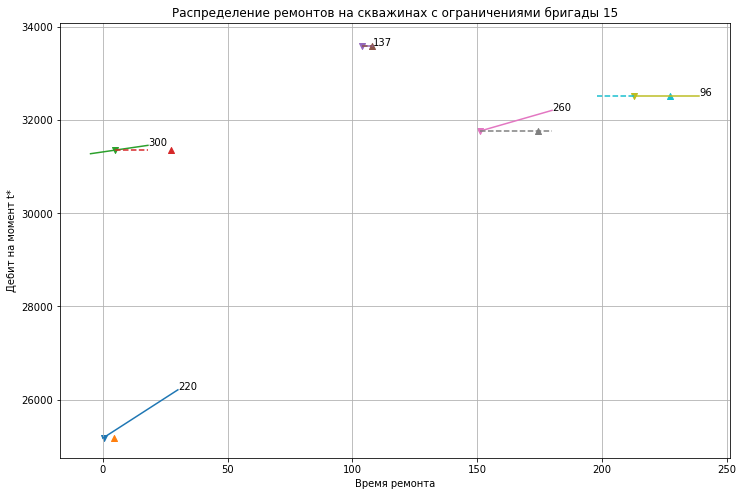

In [24]:
gamma=0.0001
#k=1
#mask=~np.isnan(D[:,k])
for k in np.arange(R.shape[1]):
    plt.figure(figsize=(12,8))
#график интеграла функции дебита для каждой скважины
    for s,i in enumerate(R[:,k]):
        if i<0: 
            break
        fun=wsch.debit_functions[i]
        x=fun.supp
        t1_=D[s,k]
        t2_=T[s,k]
        if s<R.shape[0]-1:
            t3_=D[s+1,k]
            ts_=ts1[R[s,k],R[s+1,k]]
        else:
            t3_=np.inf
            ts_=np.inf
        #if fun.cs:
        delta=osh.get_delta(t1_,t2_,t3_,ts=ts_,bound=wsch.debit_functions[R[s,k]].supp[1])
        
        y=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in x]
        t1=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in [D[:,k][s]] if ~np.isnan(w)]
        t2=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in [T[:,k][s]] if ~np.isnan(w)]
        plt.plot(x,y)
        tilda=(wsch.f6(t1_,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2))
        plt.plot([t1_,t1_+delta],[tilda,tilda],linestyle='dashed')
        if len(t1)>0:
            plt.scatter(D[:,k][s],t1,marker='v')
            plt.scatter(T[:,k][s],t1,marker='^')
        plt.annotate(str(i),xy=(fun.supp[1],(wsch.f6(fun.supp[1],fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2))))

    #if np.fmod(i,2)==0:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    #else:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    plt.title('Распределение ремонтов на скважинах с ограничениями бригады '+str(k))
    plt.xlabel('Время ремонта')
    plt.ylabel('Дебит на момент t*')    #обозначение номера скважины, для которой построена интегральная функция
    plt.grid(True)
#plt.savefig(path+'wells_debit.png')
    plt.show()

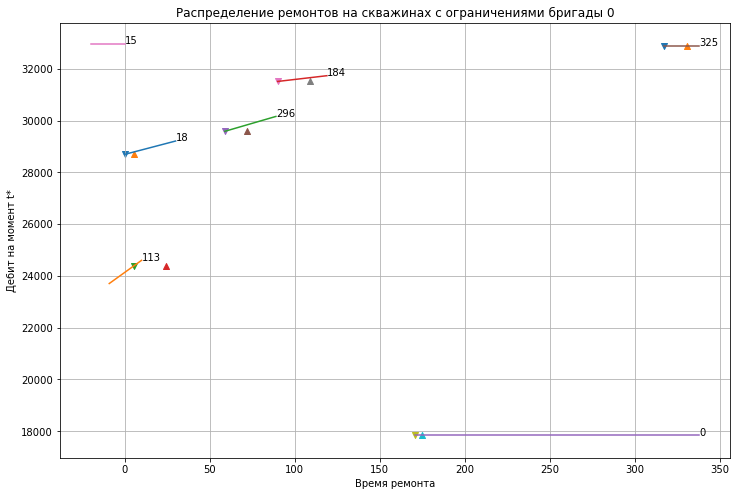

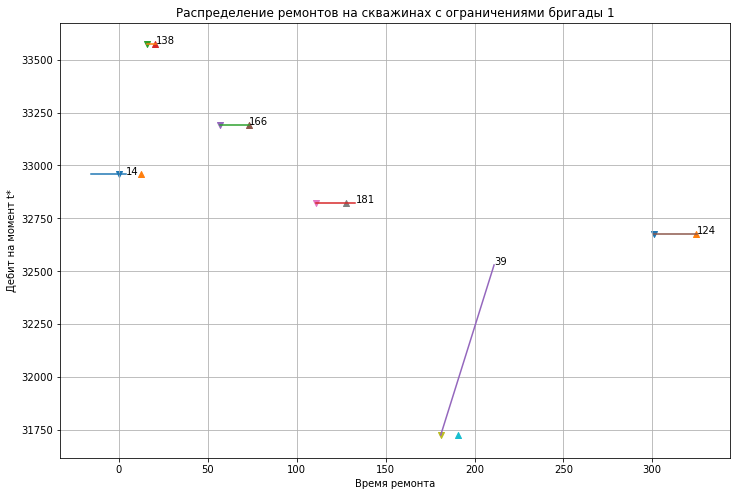

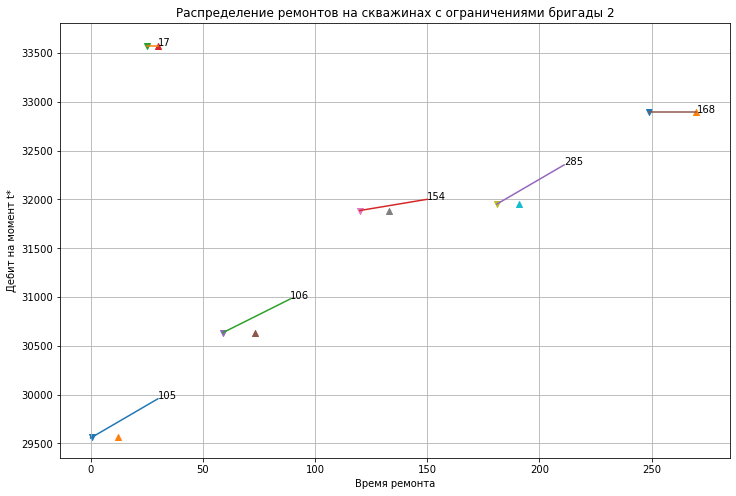

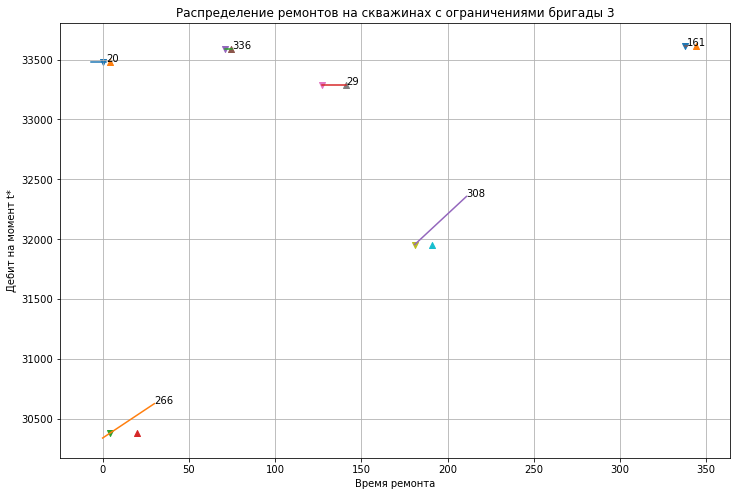

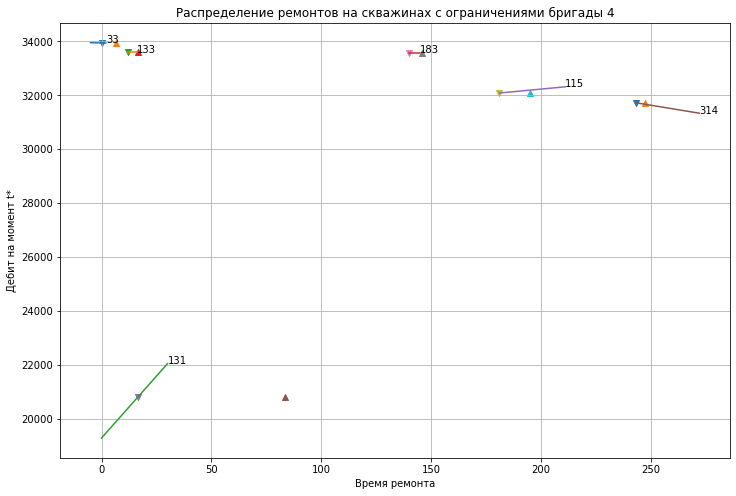

...

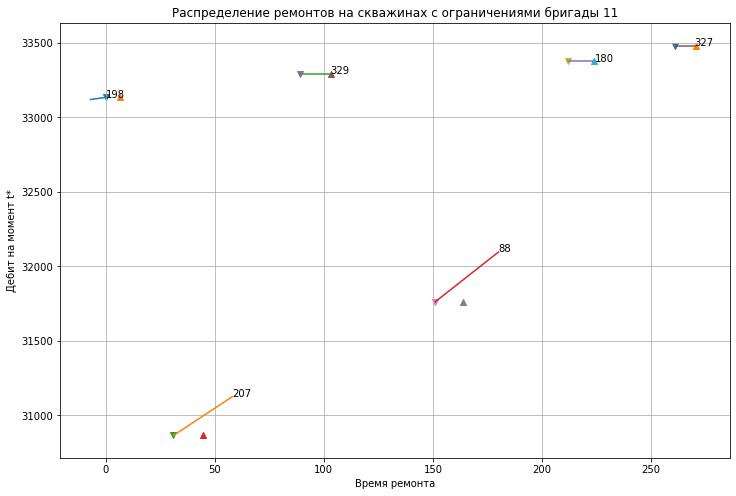

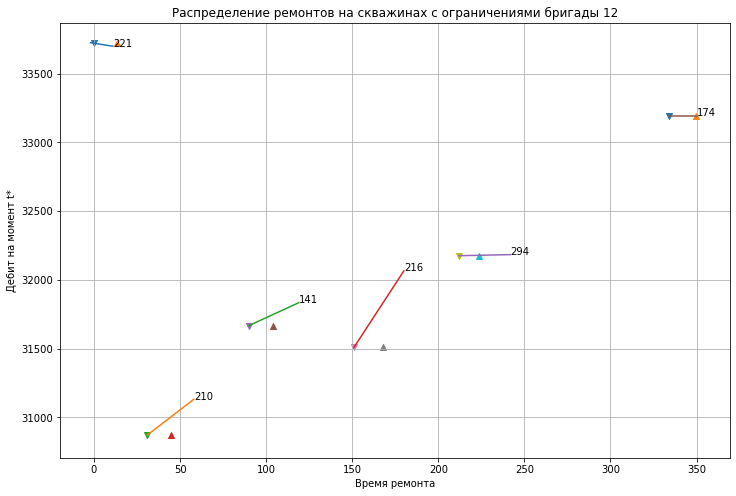

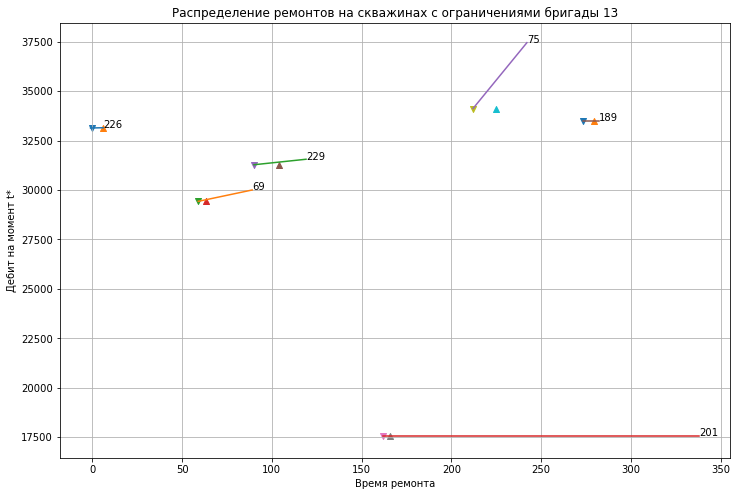

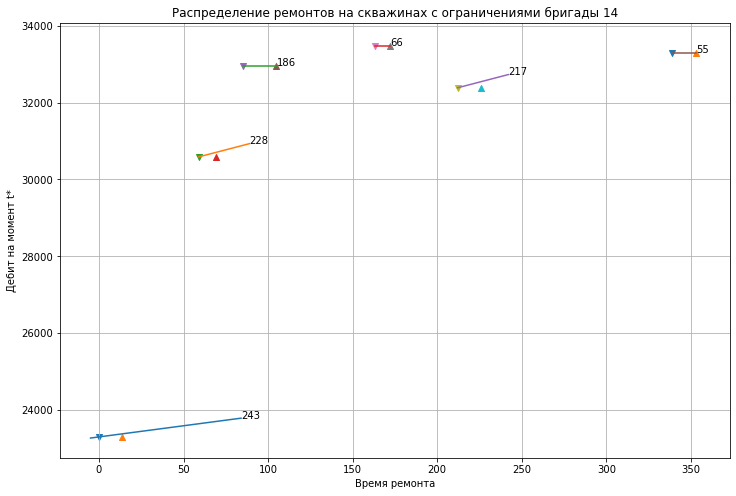

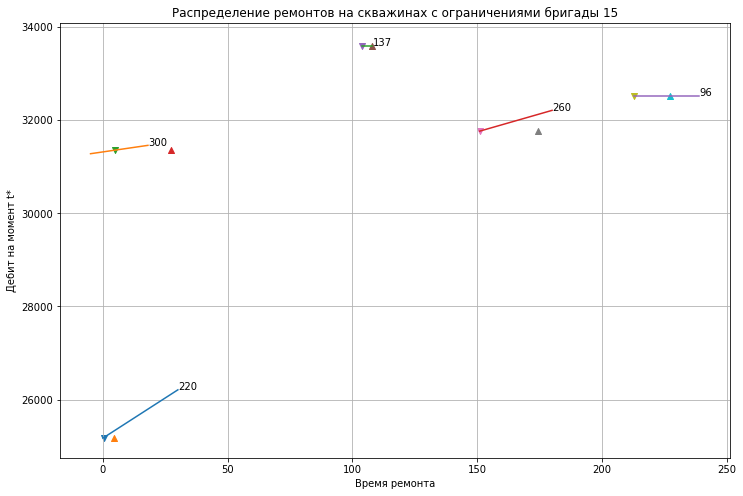

In [71]:
#x=np.linspace(0,wsch.t,500) #множество возможных значений времени начала ремонта

gamma=0.0001
#k=1
mask=~np.isnan(D[:,k])
for k in np.arange(R.shape[1]):
    plt.figure(figsize=(12,8))
#график интеграла функции дебита для каждой скважины
    for s,i in enumerate(R[:,k]):
        if i<0: 
            break
        fun=wsch.debit_functions[i]
        x=fun.supp
        t1_=D[s,k]
        t2_=T[s,k]
        if k<R.shape[0]:
            t3_=D[s+1,k]
            ts_=ts1[R[s,k],R[s+1,k]]
        else:
            t3_=np.inf
            ts_=np.inf
        #if fun.cs:
        delta=osh.get_delta(t1_,t2_,t3_,ts=ts_,bound=wsch.debit_functions[R[s,k]].supp[1])
        
        y=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in x]
        t1=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in [D[:,k][s]] if ~np.isnan(w)]
        t2=[(wsch.f6(w,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in [T[:,k][s]] if ~np.isnan(w)]
        plt.plot(x,y)
        tilda=(wsch.f6(t1_,fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2))
        plt.plot([t1_,t1_+delta],[tilda,tilda],linestyle='dashed')
        if len(t1)>0:
            plt.scatter(D[:,k][s],t1,marker='v')
            plt.scatter(T[:,k][s],t1,marker='^')
        plt.annotate(str(i),xy=(fun.supp[1],(wsch.f6(fun.supp[1],fun)+(wsch.maxcs-wsch.mincs))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2))))

    #if np.fmod(i,2)==0:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    #else:
        #plt.annotate(str(i),xy=(x[0],y[0]))
    plt.title('Распределение ремонтов на скважинах с ограничениями бригады '+str(k))
    plt.xlabel('Время ремонта')
    plt.ylabel('Дебит на момент t*')    #обозначение номера скважины, для которой построена интегральная функция
    plt.grid(True)
#plt.savefig(path+'wells_debit.png')
    plt.show()

In [ ]:
Q0=repairs['дебит до'].values
Q1=repairs['дебит после'].values
dQ=Q1-Q0
tr1=repairs['t ремонта'].values
ti1=tr1/2
groups=np.array([15,0,10,11],dtype=int)
ts1=distances.values/24
t=tr1.sum()

In [27]:
Q0=np.array([1,1.5,0.5])
Q1=np.array([2,2,1])
dQ=Q1-Q0
support=np.array([[1.5,2],[1,2],[0.5,1]])
tr1=np.array([0.1,0.1,0.1])
#ti1=tr1/2
groups=np.array([0],dtype=int)
ts1=np.array([[0,1,1],[1,0,1],[1,1,0]])
t=3

In [8]:
ts1=np.array([[0,1,1],[1,0,1],[1,1,0]])

In [33]:
support.shape

(3, 2)

In [30]:
reload(osh)

<module 'osh' from 'd:\\Python\\NVIDA\\osh.py'>

In [75]:
group[used]

array([  2,  14,  15,  20,  33, 113, 117, 132, 146, 149, 198, 221, 226,
       243, 300])

In [5]:
wsch=osh.wells_schedule()
#wsch.t=(tr.sum()/16)*1.1
wsch.t=400
wsch.fit(ts1,tr,Q0,Q1,group,support=support,used=used)

In [91]:
func=wsch.debit_functions[161]

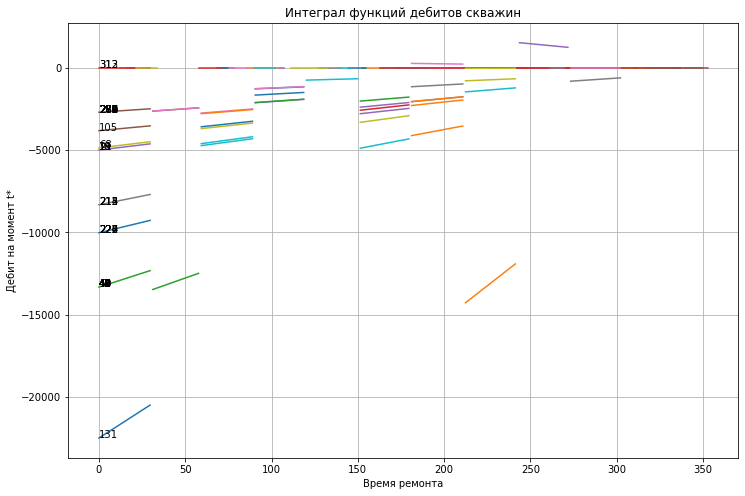

In [6]:
x=np.linspace(0,wsch.t,500) #множество возможных значений времени начала ремонта
plt.figure(figsize=(12,8))
gamma=0.001
#график интеграла функции дебита для каждой скважины
for i in wsch.debit_functions.keys():
    
#for i in np.array([17],dtype=int):
    fun=wsch.debit_functions[i]
    if fun.cs:
        y=[(wsch.f6(w,fun))*(1+np.exp(-gamma*(fun.supp[1]-fun.supp[0])**2)) for w in x]
        plt.plot(x,y)

    if np.fmod(i,2)==0:
        plt.annotate(str(i),xy=(x[0],y[0]))
    else:
        plt.annotate(str(i),xy=(x[0],y[0]))
plt.title('Интеграл функций дебитов скважин')
plt.xlabel('Время ремонта')
plt.ylabel('Дебит на момент t*')    #обозначение номера скважины, для которой построена интегральная функция
plt.grid(True)
#plt.savefig(path+'wells_debit.png')
plt.show()

In [ ]:
wsch=wells_schedule()
wsch.t=t
wsch.fit(ts1,tr1,Q0,Q1,groups)
wsch.fun=wsch.f6
wsch.stop=4
routes=wsch.get_routes_v1()
#s=wsch.cd
R,T,D=get_rout_time(routes)
debit_=get_debit(R,D,wsch)
print(debit_.sum())

In [112]:
svec=np.argsort(vec)

In [141]:
reload(op)

<module 'optimization' from 'd:\\Python\\NVIDA\\optimization.py'>

In [67]:
reload(osh)

<module 'osh' from 'd:\\Python\\NVIDA\\osh.py'>

In [97]:
vec=np.array([160.5578625,-419.6181375,723.0398625,-581.2221375,395.3498625,-216.3621375,-578.9721375,-808.8861375,-1197.7221375,-107.2281375,-882.7041375,-650.6121375,2806.1798625,-529.1121375,-137.9541375,-555.3201375]).reshape(-1,1)

In [20]:
wsch=osh.wells_schedule()
#wsch.t=(tr.sum()/16)*1.1
wsch.t=400
wsch.fit(ts1,tr,Q0,Q1,group)
wsch.fun=wsch.f6
wsch.stop=Q0.shape[0]
routes=wsch.get_routes_v1()
#s=wsch.cd
R,T,D=osh.get_rout_time(routes)
debit_=osh.get_debit(R,D,wsch)
print(debit_.sum())

2988686.146953075


In [9]:
F1=[]
F2=[]
y=[16,17,18,19,20,25,30,40,50,100]
#y=[20]
for i in y:
    wsch=wells_schedule()
    wsch.t=365
    wsch.fit(ts1,tr,Q0,Q1,group)
    wsch.fun=wsch.f6
    wsch.stop=i
    #приближенное решение
    routes=wsch.get_routes()
    #s=wsch.cd
    R,T,D=get_rout_time(routes)
    debit_=get_debit(R,D,wsch)
    s=wsch.optim(D.max())
    F1.append((debit_.sum(),s))
    wsch=wells_schedule()
    wsch.t=365
    wsch.fit(ts1,tr,Q0,Q1,group)
    wsch.fun=wsch.f6
    wsch.stop=i
    #точное решение
    routes=wsch.get_routes_v1()
    #s=wsch.cd
    R,T,D=get_rout_time(routes)
    debit_=get_debit(R,D,wsch)
    s=wsch.optim(D.max())
    F2.append((debit_.sum(),s))
F1=np.array(F1)
F2=np.array(F2)

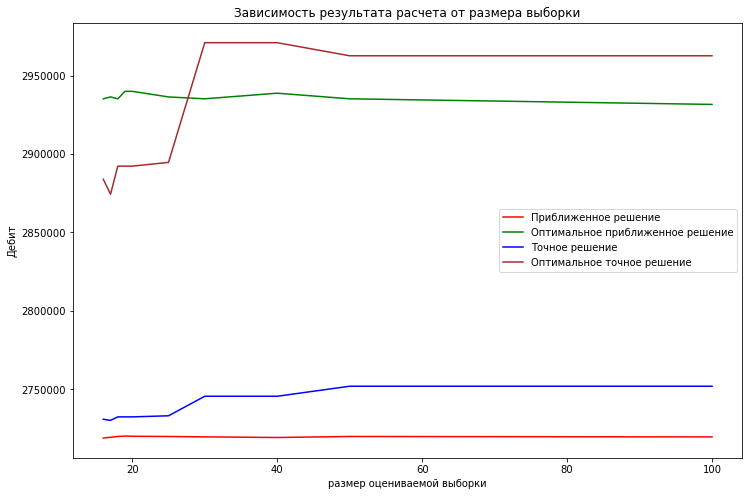

In [10]:
plt.figure(figsize=(12,8))
leg1,=plt.plot(y,F1[:,0],c='red')
leg2,=plt.plot(y,F1[:,1],c='green')
leg3,=plt.plot(y,F2[:,0],c='blue')
leg4,=plt.plot(y,F2[:,1],c='brown')
plt.legend((leg1,leg2,leg3,leg4),('Приближенное решение','Оптимальное приближенное решение','Точное решение','Оптимальное точное решение'))
plt.xlabel('размер оцениваемой выборки')
plt.ylabel('Дебит')
plt.title('Зависимость результата расчета от размера выборки')
plt.show()

In [82]:
def assignment(a=np.array([]),add=True):
    if add:
        rzeros=np.zeros(a.shape[0]).reshape(-1,1)
        a=np.hstack((rzeros,a))
        czeros=np.zeros(a.shape[1]).reshape(1,-1)
        a=np.vstack((czeros,a))
    u=np.zeros(a.shape[0],dtype=np.float)
    v=np.zeros(a.shape[1],dtype=np.float)
    p=np.zeros(a.shape[1],dtype=np.int32)
    way=np.zeros(a.shape[1],dtype=np.int32)
   
    for i in np.arange(1,a.shape[0]):
        p[0]=i
        j0=0
        minv=np.empty(shape=a.shape[1])
        minv.fill(np.inf)
        used=np.zeros(shape=a.shape[1],dtype=bool)
        mark=True
        while mark:
            used[j0]=True
            i0=p[j0]
            delta=np.inf
            j1=0
            for j in np.arange(1,a.shape[1]):
                if not used[j]:
                    cur=a[i0,j]-u[i0]-v[j]
                    if cur<minv[j]:
                        minv[j]=cur
                        way[j]=j0
                    if minv[j]<delta:
                        delta=minv[j]
                        j1=j
            for j in np.arange(a.shape[1]):
                if used[j]:
                    #print('used ',j)
                    u[p[j]]+=delta
                    v[j]-=delta
                else:
                    minv[j]-=delta
            j0=j1
            if p[j0]!=0:
                mark=True
            else:
                mark=False
                
        mark1=True
        while mark1:
            j1=way[j0]
            p[j0]=p[j1]
            j0=j1
            if j0>0:
                mark1=True
            else:
                mark1=False
    c=np.empty(a.shape[0],dtype=np.int32)
    for i in np.arange(p.shape[0]):
        c[p[i]-1]=i-1
    return c[:-1],v[0]
                
            
        
    

In [39]:
qt=get_w_choice(groups,ts1,tr1,Q0,Q1,dQ.min(),89)
#sqt=np.argsort(qt)

In [62]:
reload(op)

<module 'optimization' from 'd:\\Python\\NVIDA\\optimization.py'>

In [154]:
reload(op)

<module 'optimization' from 'd:\\Python\\NVIDA\\optimization.py'>

In [21]:
qt=get_w_choice(groups,ts1,tr1,Q0,Q1,dQ.min(),89)
sqt=np.argsort(qt)

In [39]:
def get_indices(row=np.array([]),col=np.array([]),values=np.array([])):
    ROW=[]
    COL=[]
    si=np.argsort(row)
    i=0
    xmax=0
    rmax=0
    cmax=0
    while i<si.shape[0]:
        r=row[i]
        c=col[i]
        x=values[r,c]
        if x>xmax:
            xmax=x
            rmax=r
            cmax=c
        i+=1
        j=i
        while j<si.shape[0]:
            r1=row[j]
            c1=col[j]
            y=values[r1,c1]
            if r1==rmax:
                if y>xmax:
                    xmax=y
                    rmax=j
                     
                j+=1
            else:
                xmax=0
                i=j
                break
        ROW.append(rmax)
        COL.append(cmax)
    return np.array(ROW),np.array(COL)
                
                
                
            
        
        

In [43]:
reload(op)

<module 'optimization' from 'd:\\Python\\NVIDA\\optimization.py'>

In [110]:
x=dict({"x1": 1., 'x2': 0.})
d=dict({"d1": 0., 'd2':1.})
line1=ml.linear_transform(x=x,d=d)
x=dict({"x1": 2., 'x2': 0.})
d=dict({"d1": 0., 'd2':2.})
line2=ml.linear_transform(x=x,d=d)

In [111]:
y1=line1.value(0.2)
y2=line1.value(0.7)
z1=line2.value(0.2)
z2=line2.value(0.7)

In [112]:
print(y1+z2)
print(y2+z1)

2.1
2.1


In [116]:
Q0=repairs['дебит до'].values
Q1=repairs['дебит после'].values
dQ=Q1-Q0
tr=repairs['t ремонта'].values
groups=np.array([15,0,10,11],dtype=int)
ts=distances.values/24
t=89

In [20]:
def get_product(a,b,c,tr,t):
    d=np.zeros_like(a)
    for i in np.arange(a.shape[0]):
        for j in np.arange(a.shape[1]):
            d[i,j]=-a[i,j]*b[i]-c[i]*tr[i]+b[i]*t
    return d
def get_w_out(dQ,Q1,tr,out,t):
    q=[]
    for i in out:
        w=[]
        dt=t-i
        for j in np.arange(dQ.shape[0]):
            w.append(dQ[j]*dt-Q1[j]*tr[j])
        q.append(w)
    return np.array(q)

def get_groups_to_wells(qlp,group):
    w=[]
    for i in group:
        
        w.append(np.argmax(qlp[:,i]))
    return np.array(w)

        
def get_w_choice(groups,ts,tr,Q0,Q1,dqmin,t):
    w=[]
    for i in np.arange(groups.shape[0]):
        well=groups[i]
        k=[]
        for j in np.arange(tr.shape[0]):
            k.append((Q0[j]*ts[j,well]+Q1[j]*(t-tr[j]-ts[j,well])-Q0[j]*t-dqmin*t)/t)
        w.append(k)
    return np.array(w)
            
        
    

In [96]:
qlp_=get_w_out(dQ,Q1,tr,out,t)

In [336]:
srted[-4:,0].sum()

8430.0

In [97]:
def get_max(indexed):
    indices=[]
    s=0
    while indexed.shape[0]>0:
        i=np.argmax(indexed[:,0])
        s=s+indexed[i][0]
        t=indexed[i][1]
        f=indexed[i][2]
        mask2=indexed[:,1]==t
        mask1=indexed[:,2]==f
        mask=mask1|mask2
        indexed=indexed[~mask]
        indices.append([t,f])
    return s, indices
def get_min(indexed):
    indices=[]
    s=0
    while indexed.shape[0]>0:
        i=np.argmin(indexed[:,0])
        s=s+indexed[i][0]
        t=indexed[i][1]
        f=indexed[i][2]
        mask2=indexed[:,1]==t
        mask1=indexed[:,2]==f
        mask=mask1|mask2
        indexed=indexed[~mask]
        indices.append([t,f])
    return s, indices
def get_indexed(A):
    idc=np.arange(A.shape[1])
    idc_rvl=[]
    for i in np.arange(A.shape[0]):
        idc_rvl.append(idc)
    idc_rvl=np.array(idc_rvl, dtype=int).ravel()
    indices=[]
    #wells=[]
    n=A.shape[1]
    mask=np.ones(n,dtype=bool)
    #k=0
    for i in np.arange(A.shape[0]):
        empty=np.empty(n)
        #empty1=np.empty(n)
        #empty[mask]=i
        empty[mask]=i
        indices.append(empty)
        #print(len(indices))
        #wells.append(empty1)
        #k=k+1
    indices=np.array(indices,dtype=int).ravel()
    rvl=A.ravel()
    #print(rvl.shape)
    #print(indices.shape)
    #print(idc_rvl.shape)
        #wells=np.array(wells,dtype=int).ravel()
    indexed=np.hstack((rvl.reshape(-1,1),indices.reshape(-1,1),idc_rvl.reshape(-1,1)))
    return indexed

In [3]:
def get_max_indices_v2(x,y,i,index):
    row=x[:,i]
    #print('row=',row)
    arg_x=[]
    arg_y=[]   
    unique=np.unique(row) 
    #print(unique)
    for j in unique:
        indices_x=np.where(row==j)
        indices_y=row[indices_x]
        i_x=index[indices_x]
        #print('j ',j)
        #print('x ',indices_x)
        #print('y ',indices_y)
        #print('i_x ',i_x)
        
        am=np.argmax(y[i_x,indices_y])
        #print('am ',am)
        #print('i[am] ',i_x[am])
        arg_x.append(i_x[am])
        arg_y.append(j)      
    return np.array([arg_x,arg_y])
def get_max_indices(row,y,index):
    #row=x[:,i]
    #print('row=',row)
    arg_x=[]
    arg_y=[]   
    unique=np.unique(row) 
    #print(unique)
    for j in unique:
        indices_x=np.where(row==j)
        indices_y=row[indices_x]
        i_x=index[indices_x]
        #print('j ',j)
        #print('x ',indices_x)
        #print('y ',indices_y)
        #print('i_x ',i_x)
        
        am=np.argmax(y[i_x,indices_y])
        #print('am ',am)
        #print('i[am] ',i_x[am])
        arg_x.append(i_x[am])
        arg_y.append(j)      
    return np.array([arg_x,arg_y])
def get_min_indices(row,y,index):
    #row=x[:,i]
    #print('row=',row)
    arg_x=[]
    arg_y=[]   
    unique=np.unique(row) 
    #print(unique)
    for j in unique:
        indices_x=np.where(row==j)
        indices_y=row[indices_x]
        i_x=index[indices_x]
        am=np.argmin(y[i_x,indices_y])
        arg_x.append(i_x[am])
        arg_y.append(j)      
    return np.array([arg_x,arg_y])
def get_optim_trajectory(sA,A, criterion='max',index=np.array([])):
    trajectory_x=[]
    trajectory_y=[]
    s=0
    teta=1
    #print(criterion)
    if criterion=='max':
        #print('chosen max')
        function=get_max_indices
        column=-1
    else:
        #print('chosen min')
        function=get_min_indices
        column=0
        
    row=sA[:,column]
    while index.shape[0]>0:
        #t1=time.perf_counter()
        indices=function(row,A, index)
        #t2=time.perf_counter()
        #print('step ',teta,' time=',t2-t1)
        teta=teta+1
        trajectory_x.extend(indices[0])
        trajectory_y.extend(indices[1])
        s+=A[indices[0],indices[1]].sum()
        #t4=time.perf_counter()
        mask=np.isin(index,indices[0])
        index=index[~mask]
        sA=sA[~mask,:]
        #for j in indices[0]:
            #ids=np.where(index==j)
            #sA=np.delete(sA,ids,axis=0)
            #index=np.delete(index,ids)
        #t5=time.perf_counter()
        #print('time deleting rows', t5-t4)
        mask1=np.isin(sA,indices[1])
        sA[mask1]=-1
        row=get_row(sA,column=column)
        #a_new=sA.tolist()
        #a_new=delete_from_rows(a_new,indices[1])
        #t6=time.perf_counter()
        #print('time deleting indices', t6-t5)
        #sA=np.array(a_new)
        #t3=time.perf_counter()
        #print('time2=',t3-t2)
    return np.array([trajectory_x,trajectory_y]),s
def get_optim_trajectory_v2(sA,A,index=np.array([])):
    trajectory=[]
    s=0
    teta=1
    while index.shape[0]>0:
        t1=time.perf_counter()
        indices=get_max_indices(sA,A,-1, index)
        t2=time.perf_counter()
        #print('step ',teta,' time=',t2-t1)
        teta=teta+1
        trajectory.append(indices)
        s+=A[indices[0],indices[1]].sum()
        t4=time.perf_counter()
        mask=np.isin(index,indices[0])
        index=index[~mask]
        sA=sA[~mask,:]
        #for j in indices[0]:
            #ids=np.where(index==j)
            #sA=np.delete(sA,ids,axis=0)
            #index=np.delete(index,ids)
        t5=time.perf_counter()
        #print('time deleting rows', t5-t4)
        a_new=sA.tolist()
        a_new=delete_from_rows(a_new,indices[1])
        t6=time.perf_counter()
        #print('time deleting indices', t6-t5)
        sA=np.array(a_new)
        t3=time.perf_counter()
        #print('time2=',t3-t2)
    return trajectory,s
        
def get_random_array(n,p,a=0,b=1,seed=10):
    np.random.seed(seed)
    return np.random.sample((n,p))*(b-a)+a
def delete_from_rows(A=[],items=[]):
    for i in A:
        for j in items:
            try:
                i.remove(j)
                
            except(ValueError):
                i=i                
    return A
def get_row(A=np.array([]),marker=-1,column=-1):
    row=[]
    for a in A:
        mask=a==marker
        row.append(a[~mask][column])
    return np.array(row)
        

In [229]:
import time

In [755]:
a_new=[]
for i in [7]:
    ids=np.where(arr==i)
    print(ids)
    for t,j in enumerate(ids[0]):
        a_new.append(np.delete(arr[j],ids[1][t],axis=0).tolist())
                     

(array([1, 2], dtype=int64), array([1, 0], dtype=int64))


In [135]:
import time
from time import process_time

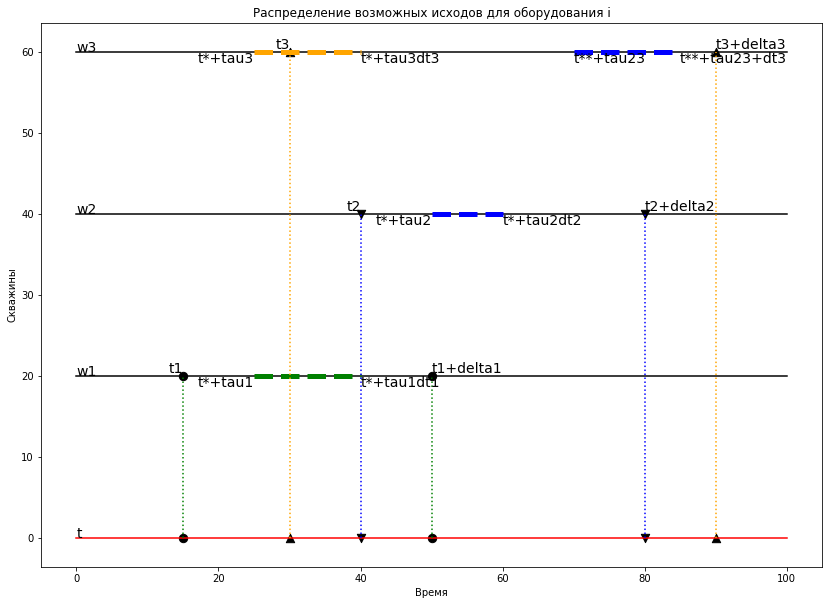

In [76]:
plt.figure(figsize=(14,10))
x=20

intervals=[[15,50],[40,80],[30,90]]
service=[[25,40],[50,60],[25,40]]
colors=['green','blue','orange']
markers=['o','v','^']
plt.plot([0,100],[0,0], color='red')
plt.annotate('t',xy=[0,0],fontsize=14)

for i in [0,1,2]:
    
    plt.plot([0,100],[x,x], color='black')
    #print([service[0],service[1]])
    plt.plot([service[i][0],service[i][1]],[x,x], color=colors[i],linestyle='dashed',linewidth=5)
    plt.plot([intervals[i][0],intervals[i][0]],[0,x], linestyle='dotted',color=colors[i])
    plt.plot([intervals[i][1],intervals[i][1]],[0,x],linestyle='dotted', color=colors[i])
    plt.annotate('t*+tau'+str(i+1),xy=[service[i][0],x],fontsize=14,horizontalalignment='right',verticalalignment='top')
    plt.annotate('t*+tau'+str(i+1)+'dt'+str(i+1),xy=[service[i][1],x],fontsize=14,horizontalalignment='left',verticalalignment='top')
    plt.annotate('w'+str(i+1),xy=[0,x],fontsize=14)
    plt.annotate('t'+str(i+1),xy=[intervals[i][0],x],fontsize=14,horizontalalignment='right',verticalalignment='bottom')
    plt.annotate('t'+str(i+1)+'+delta'+str(i+1),xy=[intervals[i][1],x],fontsize=14,horizontalalignment='left',verticalalignment='bottom')
    plt.scatter([intervals[i][0],intervals[i][0]],[0,x],marker=markers[i],s=70,c='black')
    #plt.scatter([intervals[i][0],intervals[i][0]],[0,x])
    plt.scatter([intervals[i][1],intervals[i][1]],[0,x],marker=markers[i],s=70,c='black')
    #plt.scatter([intervals[i][1],intervals[i][1]],[0,x])
    #plt.annotate('w'+str(i),xy=[0,x])
    x=x+20
a=70
plt.plot([a,a+service[2][1]-service[2][0]],[x-20,x-20], color='blue',linestyle='dashed',linewidth=5)
plt.annotate('t**+tau23',xy=[a,x-20],fontsize=14,horizontalalignment='left',verticalalignment='top')
plt.annotate('t**+tau23+dt3',xy=[a+service[2][1]-service[2][0],x-20],fontsize=14,horizontalalignment='left',verticalalignment='top')
plt.xlabel('Время')
plt.ylabel('Скважины')
plt.title('Распределение возможных исходов для оборудования i')
#plt.plot([0,100],[x,30], color='black')
#plt.plot([0,100],[50,50], color='black')
plt.show()

In [64]:
pd.DataFrame(['delta1','delta2','delta3','delta4','delta5'],columns=['t- ремонта'])

,t- ремонта
0,delta1
1,delta2
2,delta3
3,delta4
4,delta5


In [77]:
print('Транспортная карта оборудования i')
pd.DataFrame(zip(['tau1','tau2','tau3','tau4','tau5'],['dt1','dt2','dt3','dt4','dt5']),columns=['t-пути','t-работы'])

Транспортная карта оборудования i


,t-пути,t-работы
0,tau1,dt1
1,tau2,dt2
2,tau3,dt3
3,tau4,dt4
4,tau5,dt5


In [19]:
Q0=np.array([0,0,25,20])
Q1=np.array([30,40,75,40])
dQ=Q1-Q0
tr1=np.array([10./24.,3./24.,4,4])
#ti1=tr1/2
groups=np.array([0,1],dtype=int)
ts1=np.array([[0,100,0,6],[100,0,6,0],[0,6,0,6],[6,0,6,0]])

t=tr1.sum()

In [82]:
fields=pd.DataFrame(np.array([[0,6,9],[6,0,12],[9,12,0]]),columns=['SVA','US','WS'])

In [84]:
fields.to_csv(path+'Транспортная карта месторождений.csv')

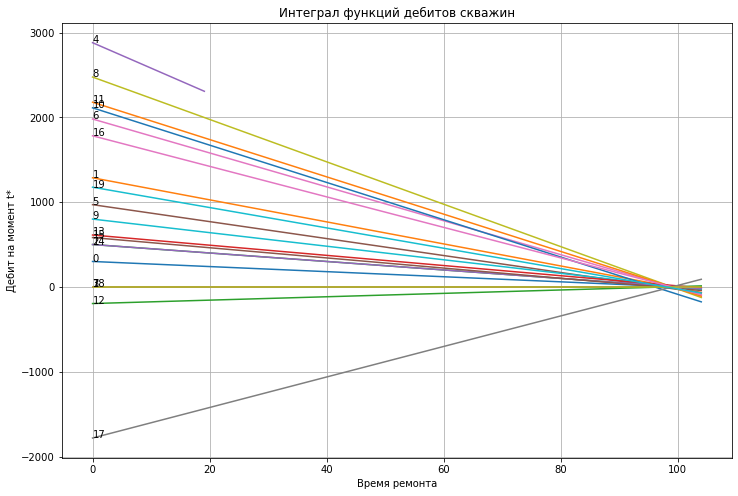

In [29]:
x=np.linspace(0,wsch.t,50) #множество возможных значений времени начала ремонта
plt.figure(figsize=(12,8))
#график интеграла функции дебита для каждой скважины
for i in wsch.debit_functions.keys():
#for i in np.array([17],dtype=int):
    fun=wsch.debit_functions[i]
    y=[wsch.f6(w,fun) for w in x]
    #q=repairs.loc[i,'дебит до']
    #qi=repairs.loc[i,'дебит после']
    
    #tau=repairs.loc[i,'t ремонта']
    #y=[qi*(t-tau)-(qi-q)*w for w in x]# интеграл функции дебита в зависимости от времени проведения ремонта
    plt.plot(x,y)
    plt.title('Интеграл функций дебитов скважин')
    plt.xlabel('Время ремонта')
    plt.ylabel('Дебит на момент t*')
    if np.fmod(i,2)==0:
        plt.annotate(str(i),xy=(x[0],y[0]))
    else:
        plt.annotate(str(i),xy=(x[0],y[0]))
    #обозначение номера скважины, для которой построена интегральная функция
plt.grid(True)
#plt.savefig(path+'wells_debit.png')
plt.show()

In [33]:
reload(op)

<module 'optimization' from 'd:\\Python\\NVIDA\\optimization.py'>

In [127]:
Q0=repairs['дебит до'].values
Q1=repairs['дебит после'].values
dQ=Q1-Q0
tr1=repairs['t ремонта'].values
ti1=tr1/2
groups=np.array([15,0,10,11],dtype=int)
ts1=distances.values/24
t=tr1.sum()


In [30]:
tr1.shape

(20,)

In [125]:
reload(osh)

<module 'osh' from 'd:\\Python\\NVIDA\\osh.py'>

In [53]:
Q0=np.array([0,0,25,20])
Q1=np.array([1000,1000,75,40])
dQ=Q1-Q0
tr1=np.array([10./24.,3./24.,4,4])
#ti1=tr1/2
groups=np.array([0,1],dtype=int)
ts1=np.array([[0,100,0,6],[100,0,6,0],[0,6,0,6],[6,0,6,0]])/24
t=tr1.sum()

In [124]:
np.zeros([0],dtype=bool).shape

(0,)

In [5]:
zer=np.zeros(3,dtype=bool)

In [57]:
R

array([[0, 1],
       [2, 3]])

In [59]:
R

array([[0, 1],
       [2, 3]])

In [58]:
wsch=osh.wells_schedule()
wsch.t=t
wsch.fit(ts1,tr1,Q0,Q1,groups)
wsch.fun=wsch.f6
wsch.stop=20
#wsch.debit_functions[4].supp=(0,20)
routes=wsch.get_routes_v1()
#s=wsch.cd
R,T,D=osh.get_rout_time(routes)
debit_=osh.get_debit(R,D,wsch,mt=T.max())
print(debit_.sum())

8316.25


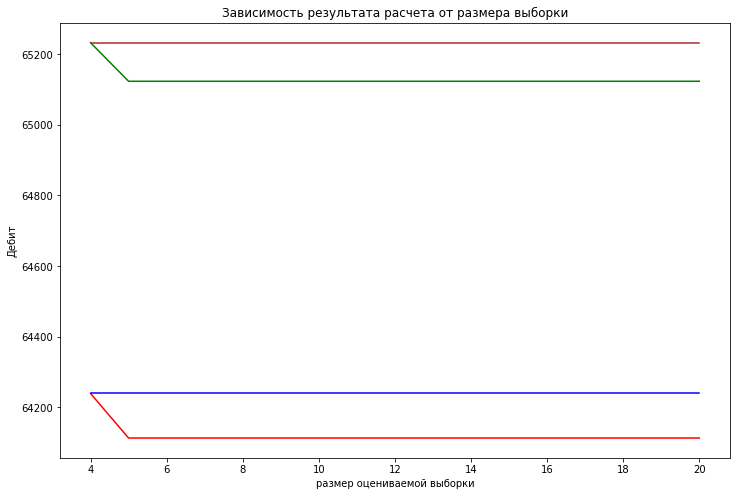

In [103]:
plt.figure(figsize=(12,8))
plt.plot(y,F1[:,0],c='red')
plt.plot(y,F1[:,1],c='green')
plt.plot(y,F2[:,0],c='blue')
plt.plot(y,F2[:,1],c='brown')
plt.xlabel('размер оцениваемой выборки')
plt.ylabel('Дебит')
plt.title('Зависимость результата расчета от размера выборки')
plt.show()

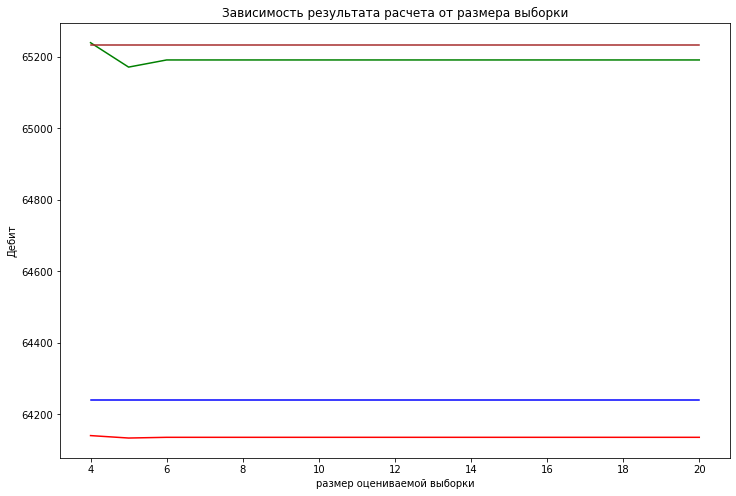

In [101]:
plt.figure(figsize=(12,8))
plt.plot(y,F1[:,0],c='red')
plt.plot(y,F1[:,1],c='green')
plt.plot(y,F2[:,0],c='blue')
plt.plot(y,F2[:,1],c='brown')
plt.xlabel('размер оцениваемой выборки')
plt.ylabel('Дебит')
plt.title('Зависимость результата расчета от размера выборки')
plt.show()

In [100]:
F1=[]
F2=[]
y=[4,5,6,7,8,9,10,20]
#y=[20]
for i in y:
    wsch=wells_schedule()
    wsch.t=89
    wsch.fit(ts1,tr1,Q0,Q1,groups)
    wsch.fun=wsch.f6
    wsch.stop=i
    routes=wsch.get_routes()
    #s=wsch.cd
    R,T,D=get_rout_time(routes)
    debit_=get_debit(R,D,wsch)
    s=wsch.optim(D.max())
    F1.append((debit_.sum(),s))
    wsch=wells_schedule()
    wsch.t=89
    wsch.fit(ts1,tr1,Q0,Q1,groups)
    wsch.fun=wsch.f6
    wsch.stop=i
    routes=wsch.get_routes_v1()
    #s=wsch.cd
    R,T,D=get_rout_time(routes)
    debit_=get_debit(R,D,wsch)
    s=wsch.optim(D.max())
    F2.append((debit_.sum(),s))
F1=np.array(F1)
F2=np.array(F2)

    
    

In [102]:
F1=[]
F2=[]
y=[4,5,6,7,8,9,10,20]
#y=[20]
for i in y:
    wsch=wells_schedule()
    wsch.t=89
    wsch.fit(ts1,tr1,Q0,Q1,groups)
    wsch.fun=wsch.f2
    wsch.stop=i
    routes=wsch.get_routes_v1()
    #s=wsch.cd
    R,T,D=get_rout_time(routes)
    debit_=get_debit(R,D,wsch)
    s=wsch.optim(D.max())
    F1.append((debit_.sum(),s))
    wsch=wells_schedule()
    wsch.t=89
    wsch.fit(ts1,tr1,Q0,Q1,groups)
    wsch.fun=wsch.f6
    wsch.stop=i
    routes=wsch.get_routes_v1()
    #s=wsch.cd
    R,T,D=get_rout_time(routes)
    debit_=get_debit(R,D,wsch)
    s=wsch.optim(D.max())
    F2.append((debit_.sum(),s))
F1=np.array(F1)
F2=np.array(F2)

In [77]:
wsch=wells_schedule()
wsch.t=89
wsch.fit(ts1,tr1,Q0,Q1,groups)

In [36]:
wsch=wells_schedule()
wsch.t=89
wsch.fit(ts1,tr1,Q0,Q1,groups)
wsch.fun=wsch.f6
wsch.stop=20
routes=wsch.get_routes_v1()
s=wsch.cd
R,T,D=get_rout_time(routes)
debit_=get_debit(R,D,wsch)
print(debit_.sum())

64239.5625


In [137]:
wsch=osh.wells_schedule()
wsch.t=50
wsch.fit(ts1,tr1,Q0,Q1,groups)
wsch.fun=wsch.f6
wsch.stop=20
routes=wsch.get_routes_v1()
s=wsch.cd
R,T,D=osh.get_rout_time(routes)
debit_=osh.get_debit(R,D,wsch,mt=T.max())
print(debit_.sum())

21297.0625


In [23]:
wsch=wells_schedule()
wsch.t=89
wsch.fit(ts1,tr1,Q0,Q1,groups)
wsch.fun=wsch.f6
wsch.stop=20
routes=wsch.get_routes()
s=wsch.cd
R,T,D=get_rout_time(routes)
debit_=get_debit(R,D,wsch)
print(debit_.sum())

64135.479166666664


In [96]:
wsch=wells_schedule()
wsch.t=89
wsch.fit(ts1,tr1,Q0,Q1,groups)
wsch.fun=wsch.f6
wsch.stop=20
routes=wsch.get_routes()
s=wsch.cd
R,T,D=get_rout_time(routes)
debit_=get_debit(R,D,wsch)
print(debit_.sum())

64135.479166666664


In [147]:
print('Начальное расположение бригад')
groups

Начальное расположение бригад


array([15,  0, 10, 11])

In [81]:
print('Приближенное решение. Дебит',debit_.sum())
R


Приближенное решение. Дебит 64140.3125


array([[ 8,  4, 11, 10],
       [ 6,  1, 16, 19],
       [ 5, 13,  9, 15],
       [ 0, 14,  2, 18],
       [17,  3,  7, 12]])

In [75]:
print('Точное решение. Дебит',debit_.sum())
R

Точное решение. Дебит 64239.5625


array([[ 8,  4, 11, 10],
       [ 6,  1, 16, 19],
       [ 5, 13,  9, 15],
       [ 0, 14,  2, 18],
       [12,  3,  7, 17]])

In [145]:
print('Решение Елина Н.Н. Дебит',d2.sum())
R1

Решение Елина Н.Н. Дебит 64110.39583333334


array([[ 8,  4,  6, 11],
       [16,  1, 19, 10],
       [ 5,  9, 15, 14],
       [ 0,  2,  7, 13],
       [12, 18, 17,  3]])

In [143]:
d2=debit(groups,R1,tr1,ts1,wsch)
d1=debit(groups,R,tr1,ts1,wsch)
print(d2.sum())
print(d1.sum())

64110.39583333334
64113.47916666668


In [131]:
R1=np.array([[8,4,6,11],[16,1,19,10],[5,9,15,14],[0,2,7,13],[12,18,17,3]],dtype=np.int32)

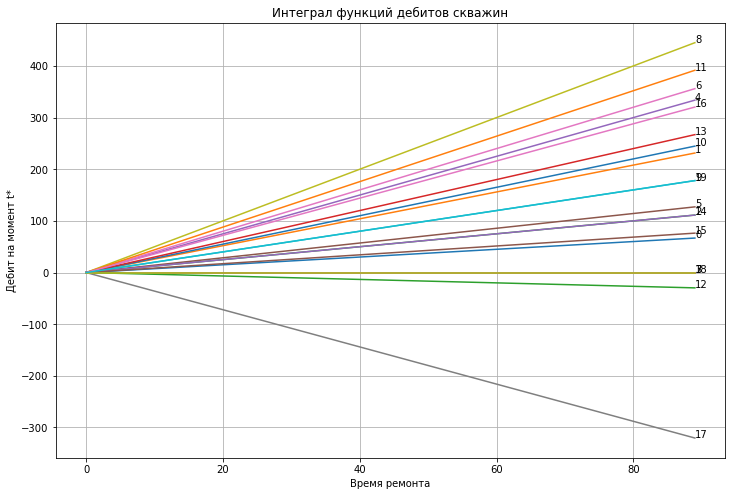

In [72]:
#срок окончания всех мероприятий t выбран как сумма сроков ремонтов по всем скважинам
#t=89
x=np.linspace(0,wsch.t,50) #множество возможных значений времени начала ремонта
plt.figure(figsize=(12,8))
#график интеграла функции дебита для каждой скважины
for i in wsch.debit_functions.keys():
    fun=wsch.debit_functions[i]
    y=[fun.dq*w/(fun.tau) for w in x]
    #q=repairs.loc[i,'дебит до']
    #qi=repairs.loc[i,'дебит после']
    
    #tau=repairs.loc[i,'t ремонта']
    #y=[qi*(t-tau)-(qi-q)*w for w in x]# интеграл функции дебита в зависимости от времени проведения ремонта
    plt.plot(x,y)
    plt.title('Интеграл функций дебитов скважин')
    plt.xlabel('Время ремонта')
    plt.ylabel('Дебит на момент t*')
    if np.fmod(i,2)==0:
        plt.annotate(str(i),xy=(x[-1],y[-1]))
    else:
        plt.annotate(str(i),xy=(x[-1],y[-1]))
    #обозначение номера скважины, для которой построена интегральная функция
plt.grid(True)
#plt.savefig(path+'wells_debit.png')
plt.show()

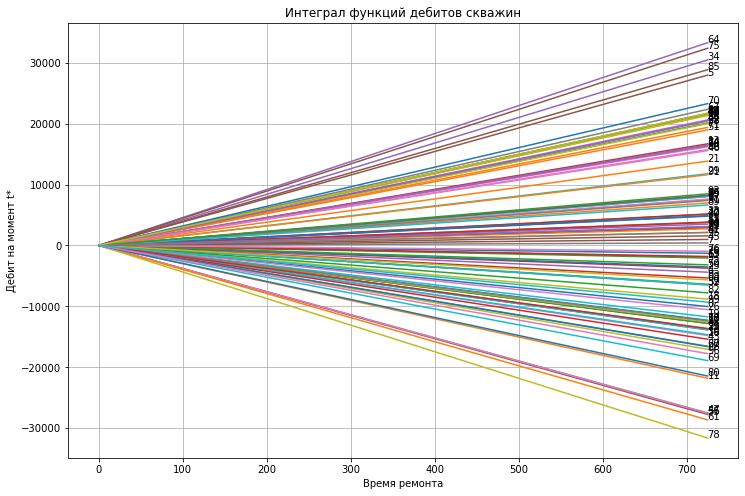

In [109]:
x=np.linspace(0,wsch.t,50) #множество возможных значений времени начала ремонта
plt.figure(figsize=(12,8))
#график интеграла функции дебита для каждой скважины
for i in wsch.debit_functions.keys():
    y=[wsch.debit_functions[i].dq*w for w in x]
    #q=repairs.loc[i,'дебит до']
    #qi=repairs.loc[i,'дебит после']
    
    #tau=repairs.loc[i,'t ремонта']
    #y=[qi*(t-tau)-(qi-q)*w for w in x]# интеграл функции дебита в зависимости от времени проведения ремонта
    plt.plot(x,y)
    plt.title('Интеграл функций дебитов скважин')
    plt.xlabel('Время ремонта')
    plt.ylabel('Дебит на момент t*')
    if np.fmod(i,2)==0:
        plt.annotate(str(i),xy=(x[-1],y[-1]))
    else:
        plt.annotate(str(i),xy=(x[-1],y[-1]))
    #обозначение номера скважины, для которой построена интегральная функция
plt.grid(True)
#plt.savefig(path+'wells_debit.png')
plt.show()

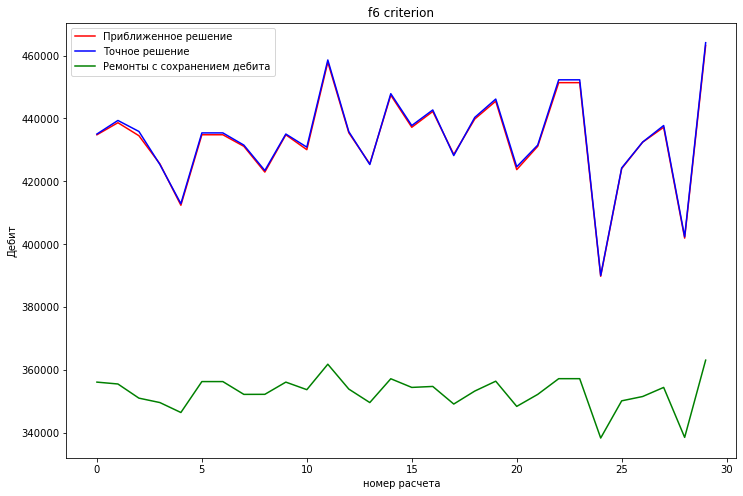

In [54]:
plt.figure(figsize=(12,8))
x=np.arange(len(F1))
leg1,=plt.plot(x,F1,c='red')
leg2,=plt.plot(x,F2,c='blue')
leg3,=plt.plot(x,F3,c='green')
plt.legend([leg1,leg2,leg3],['Приближенное решение','Точное решение','Ремонты с сохранением дебита'])
plt.xlabel('номер расчета')
plt.ylabel('Дебит')
plt.title('f6 criterion')

plt.show()

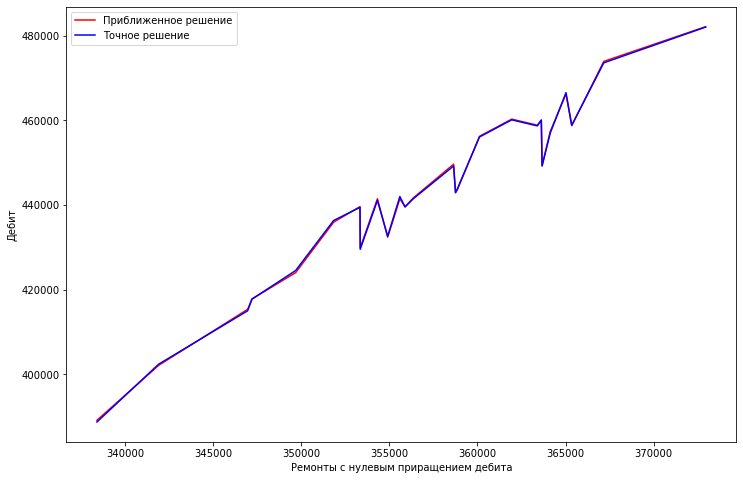

In [129]:
plt.figure(figsize=(12,8))
x=np.arange(len(F1))
ins=np.argsort(F3)
leg1,=plt.plot(F3[ins],F1[ins],c='red')
leg2,=plt.plot(F3[ins],F2[ins],c='blue')
plt.legend([leg1,leg2],['Приближенное решение','Точное решение'])
plt.xlabel('Ремонты с нулевым приращением дебита')
plt.ylabel('Дебит')

plt.show()

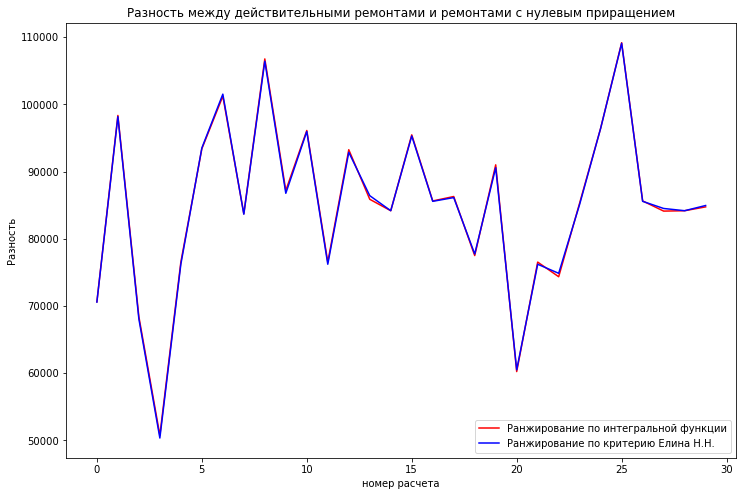

In [130]:
plt.figure(figsize=(12,8))
x=np.arange(len(F1))
#ins=np.argsort(F3)
leg1,=plt.plot(x,F1-F3,c='red')
leg2,=plt.plot(x,F2-F3,c='blue')
plt.legend([leg1,leg2],['Ранжирование по интегральной функции','Ранжирование по критерию Елина Н.Н.'])
plt.xlabel('номер расчета')
plt.ylabel('Разность')
plt.title('Разность между действительными ремонтами и ремонтами с нулевым приращением')

plt.show()

In [114]:
w=(np.arange(1,11)*1000)[1:]
w[0]=2500

In [115]:
w

array([ 2500,  3000,  4000,  5000,  6000,  7000,  8000,  9000, 10000])

In [53]:
i=0
w=30
n=100
k=5
index=np.arange(n)
F1=[]
F2=[]
F3=[]
seeds=np.random.randint(100,size=w)
while i<w:
    
    seed=seeds[i]
    i+=1
    tr=op.get_random_array(n,1,a=4,b=10,seed=seed).reshape(-1)
    ts=op.get_random_symmetric(n,a=0,b=15)/24
    Q0=op.get_random_array(n,1,a=0,b=50).reshape(-1)
    Q1=op.get_random_array(n,1,a=0,b=50,seed=seed).reshape(-1)
    #dQ=Q1-Q0
    t=(tr.sum()/k)*1.1
    shuffled=np.random.permutation(index)
    groups=shuffled[:k]
    #f1 - ранжирование по интегральной функции дебита
    #print('i=',i,'seed',seed)
    wsch=wells_schedule()
    wsch.t=t
    wsch.fit(ts,tr,Q0,Q1,groups)
    wsch.stop=100
    wsch.fun=wsch.f6
    routes=wsch.get_routes()
    #s=wsch.cd
    R,T,D=get_rout_time(routes)
    debit=get_debit(R,D,wsch)
    F1.append(debit.sum())
    #print('f1',debit.sum())
    #print('start',groups)
    #f2 - ранжирование по критерию Н.Н.
    #shuffled=np.random.permutation(index)
    #groups=shuffled[:k]
    wsch1=wells_schedule()
    wsch1.t=t
    wsch1.fit(ts,tr,Q0,Q1,groups)
    wsch1.fun=wsch.f6
    wsch1.stop=100
    routes=wsch1.get_routes_v1()
    #s=wsch.cd
    R1,T1,D1=get_rout_time(routes)
    debit1=get_debit(R1,D1,wsch1)
    F2.append(debit1.sum())
    
    wsch1=wells_schedule()
    wsch1.t=t
    wsch1.fit(ts,tr,Q0,Q0,groups)
    wsch1.fun=wsch.f2
    wsch1.stop=100
    routes=wsch1.get_routes_v1()
    #s=wsch.cd
    R1,T1,D1=get_rout_time(routes)
    debit1=get_debit(R1,D1,wsch1)
    F3.append(debit1.sum())
    #print('f2',debit1.sum())
    #print('start',groups)
F1=np.array(F1)
F2=np.array(F2)
F3=np.array(F3)

In [108]:
import time
i=0
#w=[2500,3000,4000,5000,8000,10000,3000,5000,10000]
#w=[20,21,22,25,28,30,40,50,80,100,300,500,1000]
w=[20,21,22,25,28,30,40,50,80,100]
n=1000
k=20
#w[0]=k
index=np.arange(n)
F1=[]
F2=[]
F3=[]
F4=[]
#seeds=np.random.randint(100,size=w)
#seed=seeds[i]
seed=15
shuffled=np.random.permutation(index)
groups=shuffled[:k]
tr=op.get_random_array(n,1,a=4,b=10,seed=seed).reshape(-1)
ts=op.get_random_symmetric(n,a=0,b=15)/24
Q0=op.get_random_array(n,1,a=0,b=50,seed=10).reshape(-1)
Q1=op.get_random_array(n,1,a=0,b=50,seed=seed).reshape(-1)
    #dQ=Q1-Q0
t=(tr.sum()/k)*1.1
for i in w:
    #i+=1


    #f1 - ранжирование по интегральной функции дебита
    #print('i=',i,'seed',seed)
    t1=time.perf_counter()
    
    #TIME11.append(t2-t1)
    wsch=wells_schedule()
    wsch.t=t
    wsch.fit(ts,tr,Q0,Q1,groups)
    wsch.fun=wsch.f6
    wsch.stop=i
    routes=wsch.get_routes_v1()
    t2=time.perf_counter()
    #s=wsch.cd
    R,T,D=get_rout_time(routes)
    debit_=get_debit(R,D,wsch)
    #time=t2-t1
    F1.append((debit_.sum(),w,t2-t1))
    print('f6',t2-t1,'w',i)
    #print('f1',debit.sum())
    #print('start',groups)
    #f2 - ранжирование по критерию Н.Н.
    shuffled=np.random.permutation(index)
    #groups=shuffled[:k]
    t3=time.perf_counter()
    wsch1=wells_schedule()
    wsch1.t=t
    wsch1.fit(ts,tr,Q0,Q1,groups)
    wsch1.fun=wsch.f2
    wsch1.stop=i
    routes=wsch1.get_routes_v1()
    t4=time.perf_counter()
    s=wsch.cd
    R1,T1,D1=get_rout_time(routes)
    debit1=get_debit(R1,D1,wsch1)
    F2.append((debit1.sum(),w,t4-t3))
    print('f2',t4-t3,'w',i)
    
    t1=time.perf_counter()
    
    #TIME11.append(t2-t1)
    wsch=wells_schedule()
    wsch.t=t
    wsch.fit(ts,tr,Q0,Q1,groups)
    wsch.fun=wsch.f6
    wsch.stop=i
    routes=wsch.get_routes()
    t2=time.perf_counter()
    #s=wsch.cd
    R,T,D=get_rout_time(routes)
    debit_=get_debit(R,D,wsch)
    #time=t2-t1
    F3.append((debit_.sum(),w,t2-t1))
    print('f6',t2-t1,'w',i)
    #print('f1',debit.sum())
    #print('start',groups)
    #f2 - ранжирование по критерию Н.Н.
    shuffled=np.random.permutation(index)
    #groups=shuffled[:k]
    t3=time.perf_counter()
    wsch1=wells_schedule()
    wsch1.t=t
    wsch1.fit(ts,tr,Q0,Q1,groups)
    wsch1.fun=wsch.f2
    wsch1.stop=i
    routes=wsch1.get_routes()
    t4=time.perf_counter()
    s=wsch.cd
    R1,T1,D1=get_rout_time(routes)
    debit1=get_debit(R1,D1,wsch1)
    F4.append((debit1.sum(),w,t4-t3))
    print('f2',t4-t3,'w',i)
x=[t[2] for t in F1]
y=w
s=[t[0] for t in F1]
s=np.array(s)
x1=[t[2] for t in F2]
#y=w
s1=[t[0] for t in F2]
s1=np.array(s1)

x_=[t[2] for t in F3]
#y=w
s_=[t[0] for t in F3]
s_=np.array(s_)
x1_=[t[2] for t in F4]
#y=w
s1_=[t[0] for t in F4]
s1_=np.array(s1_)

f6 0.581321329000275 w 20
f2 0.6326316470003803 w 20
f6 0.19965563699952327 w 20
f2 0.22473454300052254 w 20
f6 0.617219837000448 w 21
f2 0.672917702999257 w 21
f6 0.19855475100121112 w 21
f2 0.2276713480005128 w 21
f6 0.6391609000002063 w 22
f2 0.6673851959985768 w 22
f6 0.1998666380004579 w 22
f2 0.2310724159997335 w 22
f6 0.6958084199995938 w 25
f2 0.728403058999902 w 25
f6 0.20521319799991034 w 25
f2 0.23630396599946835 w 25
f6 0.7681397279993689 w 28
f2 0.8033385220005584 w 28
f6 0.21528509000017948 w 28
f2 0.25116427799912344 w 28
f6 0.8142803749997256 w 30
f2 0.8589865810008632 w 30
f6 0.22230244999991555 w 30
f2 0.25330085000132385 w 30
f6 1.0508001730013348 w 40
f2 1.125076068999988 w 40
f6 0.2673739059991931 w 40
f2 0.29046958700018877 w 40
f6 1.3312537129986595 w 50
f2 1.3744231439995929 w 50
f6 0.26464447999933327 w 50
f2 0.3130019939999329 w 50
f6 1.9848535250002897 w 80
f2 2.087045517999286 w 80
f6 0.3427072220001719 w 80
f2 0.4031449070007511 w 80
f6 2.4419050569995306 w

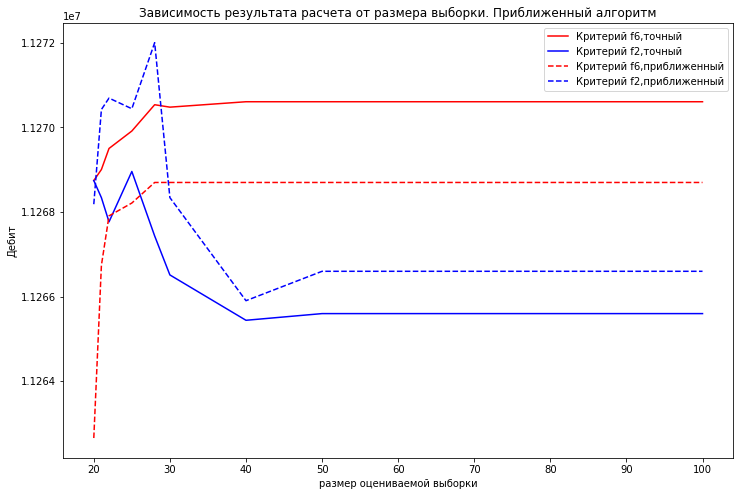

In [69]:
plt.figure(figsize=(12,8))
leg1,=plt.plot(y[:10],s[:10],c='red')
leg2,=plt.plot(y[:10],s1[:10],c='blue')
linestyle='--'
leg3,=plt.plot(y[:10],s_[:10],c='red',linestyle=linestyle)
leg4,=plt.plot(y[:10],s1_[:10],c='blue',linestyle=linestyle)
plt.legend([leg1,leg2,leg3,leg4],['Критерий f6,точный','Критерий f2,точный','Критерий f6,приближенный','Критерий f2,приближенный'])
plt.xlabel('размер оцениваемой выборки')
plt.ylabel('Дебит')
plt.title('Зависимость результата расчета от размера выборки. Приближенный алгоритм')
plt.show()

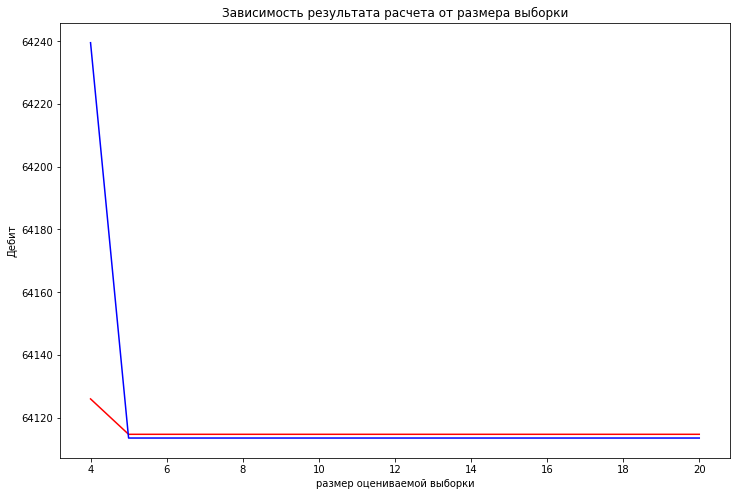

In [20]:
plt.figure(figsize=(12,8))
plt.plot(y,F1,c='red')
plt.plot(y,F2,c='blue')
plt.xlabel('размер оцениваемой выборки')
plt.ylabel('Дебит')
plt.title('Зависимость результата расчета от размера выборки')
plt.show()

In [246]:
Q1[:10]

array([42.44088486,  8.94479625,  2.71816072, 18.0769223 , 13.77004643,
       26.50001124, 15.29594579, 15.22371796,  5.58706381, 12.49495069])

In [8]:
groups

array([15,  0, 10, 11])

In [13]:
IDS

[([16, 10], 2, 6.875),
 ([8, 10], 2, 7.458333333333334),
 ([10], 1, 4.375),
 ([2, 8], 2, 5.25),
 ([2, 10], 2, 6.958333333333333),
 ([13, 16], 2, 4.25),
 ([13, 8], 2, 4.458333333333334),
 ([13, 10], 2, 5.375),
 ([13, 2], 2, 3.854166666666667)]

In [12]:
t01=np.arange(3)
w=groups[0]
tau=0
x0=t01[0]
#indices=[]


IDS=getsub(w=w,t0=x0,ts=ts1,ti=ti1,bounds=T[0],index=indices,mask=mask,maxiter=3, trajectories=[])

In [16]:
mask=np.ones(R[0].shape[0],dtype=bool)
indices=np.array([np.arange(R[0].shape[0]),R[0]])


In [23]:
IDS=getsub(w=15,t0=0,ts=ts1,ti=ti1,bounds=np.array([D[1],T[1]]),index=indices,mask=mask,maxiter=3, trajectories=[])

[[0.375      0.47916667 0.375      0.375     ]
 [2.875      4.47916667 2.875      4.375     ]]
[0 1 2 3]
[[ 5.375  8.     5.375  8.375]
 [10.375 13.    10.375 14.375]]


In [26]:
len(trajectories[0])

9

In [147]:
submask=array1[:,mask]>0
res=submask.sum(axis=1)
h_mask=array1[:,-1]>res

In [305]:
trajectory[0]

[([0, 2], 2, 6.875),
 ([1, 2], 2, 7.458333333333334),
 ([2], 1, 4.375),
 ([3, 1], 2, 5.25),
 ([3, 2], 2, 6.958333333333333),
 ([4, 0], 2, 4.25),
 ([4, 1], 2, 4.458333333333334),
 ([4, 2], 2, 5.375),
 ([4, 3], 2, 3.854166666666667)]

In [400]:
n_=200
m_=50
indices_c=np.arange(m_)
#suffled=indices_c.copy()
trj=dict({})
for i in indices_c:
    
    rnumber=np.random.randint(10,40)
    L=[]
    for j in np.arange(rnumber):
        rlenght=np.random.randint(1,10)
        shuffled=np.random.permutation(indices_c)
        route=shuffled[:rlenght]
        r=route.shape[0]
        d=np.random.random()*(9)+1
        L.append((list(route),r,d))
    trj.update({i:L})
        
        
        
    
    

In [235]:
trajecs=get_trajectories(trajectory,indices[0])

In [401]:
trajecs=get_trajectories(trj,indices_c)

In [402]:
#trajecs=get_trajectories(trj,indices_c)
mask=np.zeros(shape=trajecs[0].matrix.shape[1], dtype=bool)
max_key=list(trajecs.keys())[-1]
routes=[]
#mask[[1,3]]=True
rout=get_map(trajecs,max_key,mask,max_key=0,routes=routes,indices=indices_c,max_nodes=1,current=0)
print(len(rout))

KeyboardInterrupt: 

In [7]:
def get_tr_frame(tr=[], indices=np.array([])):
    array=np.empty(shape=(len(tr),indices.shape[0]+1),dtype=int)
    array.fill(-1)
    k=0
    max_i=0
    min_i=np.inf
    for i in tr:
        s=1
        for j in i[0]:
            array[k,j]=s
            s=s+1
        array[k,-1]=i[1]
        if max_i<i[1]:
            max_i=i[1]
        if min_i>i[1]:
            min_i=i[1]
        k=k+1
    if min_i<max_i:
        x_sorted=array[:,-1].argsort()
        return array[x_sorted,:],max_i,min_i    
    return array,max_i,min_i
class trajectories:
    def __init__(self):
        self.matrix=np.array([])
        self.min=0
        self.max=0
        self.cumm=0
        #self.index=0
def get_trajectories(d=dict({}),indices=np.array([])):
    D=dict({})
    t=0
    for k in d.keys():
        group=trajectories()
        group.matrix,group.max,group.min=get_tr_frame(d[k],indices=indices)
        t=t+group.max
        group.cumm=t
        D.update({k:group})
    return D
        
def get_map(d=dict({}),key=0,mask=np.array([],dtype=bool),traces=None,routes=[],max_key=0,first=True,indices=np.array([]),current=0,max_nodes=0):
    #print(key)
    if key<max_key:
        routes.append(traces)
        #print('returned ',len(routes))
        return
    group=d[key]
    submask=group.matrix[:,mask]>0
    res=submask.sum(axis=1)
    v_mask=res==0
    #v_mask2=res>0
    i=-1
    subgroup=group.matrix[v_mask,:]
    l=v_mask[v_mask==True].shape[0]
    if l==0:
        routes.append(traces)
        #print('returned ',len(routes))
        return
        
    #print(v_mask[v_mask==True].shape[0])
    while i>=-v_mask[v_mask==True].shape[0]:
        #print('i ',i,' rows',-v_mask[v_mask==True].shape[0],' key',key)
        row=subgroup[i]
        count=row[-1]
        sub_current=current+count
        i=i-1
        h_mask=row>0
        h_mask[-1]=False
        trace=indices[h_mask[:-1]]        
        if first:
            traces=[]
            first=False
        subtrace=traces.copy()
        subtrace.append(trace)
        cumm=0
        if key-1>=max_key:
            cumm=d[key-1].cumm
        #print(sub_current)
        #print(cumm)
        #print('_______')
        if cumm+sub_current>=max_nodes:
            get_map(d,key=key-1,mask=h_mask|mask,traces=subtrace,max_key=max_key,first=first,routes=routes,indices=indices,current=sub_current,max_nodes=max_nodes)        
    return routes

    
    
    
    

In [625]:
P=np.array([[0.5,0.7,0.8],[0.3,0.2,0.15],[0.2,0.1,0.05]])
C=np.array([[0.33,0.4,0.5,0.7,0.9],[0.33,0.33,0.3,0.2,0.09],[0.33,0.27,0.2,0.1,0.01]])

In [627]:
I=np.empty(shape=P.shape)

In [629]:
C[0].prod()

0.04158

In [631]:
i=0
while i<P.shape[1]:
    j=0    
    while j<P.shape[0]:
        I[j,i]=P[j,i]*C[:,j].prod()
        j+=1
    i+=1

In [632]:
I

array([[0.0179685, 0.0251559, 0.0287496],
       [0.010692 , 0.007128 , 0.005346 ],
       [0.006    , 0.003    , 0.0015   ]])

In [646]:
I.sum(axis=0)

array([0.0346605, 0.0352839, 0.0355956])

In [655]:
P_

array([[0.51841433, 0.7129569 , 0.80767286],
       [0.30847795, 0.20201848, 0.1501871 ],
       [0.17310772, 0.08502461, 0.04214004]])

In [656]:
a=np.array([1,2,3,4])
b=np.array([1,2,1,2])

In [710]:
weigth=np.array([1,1,1,1,3])
i1=P[0,0]*np.prod(np.power(C[0],weigth))
i2=P[1,0]*np.prod(np.power(C[1],weigth))
i3=P[2,0]*np.prod(np.power(C[2],weigth))
s=i1+i2+i3
p1=i1/s
p2=i2/s
p3=i3/s

In [703]:
print(p1,p2,p3)

0.9914171600147296 0.00841288275783928 0.00016995722743109656


In [707]:
print(p1,p2,p3)

0.9914171600147297 0.008412882757839274 0.00016995722743109654


In [709]:
print(p1,p2,p3)

0.9914171600147297 0.008412882757839277 0.00016995722743109654


In [711]:
print(p1,p2,p3)

0.9999151288968373 8.484994093781734e-05 2.1162224950197623e-08


In [699]:
power=np.array([1,2,3,4,5,6,7,8,9,10])
#power=np.ones(shape=C.shape[1])
power_=np.ones(shape=C.shape[1])
I1=np.empty(shape=(P.shape[0],power.shape[0]))

i=0
for t,p in enumerate(power):
    j=0
    power_[0]=p
    while j<P[:,i].shape[0]:
        pr=P[j,i]*np.prod(np.power(C[j],power_))
        I1[j,t]=pr
        j+=1
        
        
P_=np.divide(I1,I1.sum(axis=0))    

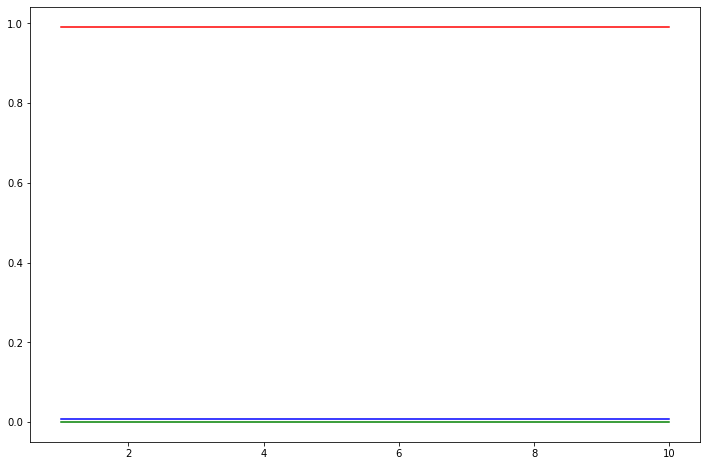

In [700]:
#power=np.arange(power.shape[0])
plt.figure(figsize=(12,8))
plt.plot(power,P_[0],c='red')
plt.plot(power,P_[1],c='blue')
plt.plot(power,P_[2],c='green')
plt.show()

In [696]:
P_[0]

array([0.99591472, 0.99591472, 0.99591472, 0.99591472, 0.99591472])

In [698]:
P_[1]

array([0.00402431, 0.00402431, 0.00402431, 0.00402431, 0.00402431])

In [667]:
P_=np.divide(I1,I1.sum(axis=0))

In [668]:
P_.sum(axis=0)

array([1., 1., 1., 1., 1., 1., 1., 1., 1., 1.])

In [671]:
P_[0]

array([0.99732858, 0.99973459, 0.99997348, 0.99999735, 0.99999973,
       0.99999997, 1.        , 1.        , 1.        , 1.        ])

In [673]:
P_[1]

array([2.64470169e-03, 2.65108192e-04, 2.65171539e-05, 2.65177868e-06,
       2.65178501e-07, 2.65178564e-08, 2.65178571e-09, 2.65178571e-10,
       2.65178571e-11, 2.65178571e-12])